In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Import TensorFlow and its components
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, BatchNormalization, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras import regularizers

# Import scikit-learn functions for model evaluation and data manipulation
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# Import imbalanced data handling library
from imblearn.over_sampling import RandomOverSampler

# Import Keras utility for model loading
from keras.models import load_model

# Import OpenCV for image processing
import os
import cv2

# Import Keras utility for one-hot encoding
from keras.utils import to_categorical


In [2]:
#loading model trained on Easy Altered
model2 = load_model("Gender1.keras")

In [3]:
# Define a function to extract labels from image filenames
def extract_label(img_path, train=True):
    filename, _ = os.path.splitext(os.path.basename(img_path))

    # Extract subject ID and other information from the filename
    subject_id, etc = filename.split('__')

    # Split the remaining information based on underscores
    if train:
        gender, lr, finger, _, _ = etc.split('_')
    else:
        gender, lr, finger, _ = etc.split('_')

    # Convert gender to a numeric value (0 for 'M', 1 for 'F')
    gender = 0 if gender == 'M' else 1
    # Convert lr (left/right) to a numeric value (0 for 'Left', 1 for 'Right')
    lr = 0 if lr == 'Left' else 1

    # Convert finger type to numeric values (0 for thumb, 1 for index, and so on)
    if finger == 'thumb':
        finger = 0
    elif finger == 'index':
        finger = 1
    elif finger == 'middle':
        finger = 2
    elif finger == 'ring':
        finger = 3
    elif finger == 'little':
        finger = 4
    return np.array([gender], dtype=np.uint16)

# Define the size for image resizing
img_size = 96

# Define a function to load data from a given path
def loading_data(path, boolean):
    data = []
    for img in os.listdir(path):
        # Read and resize the image
        img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
        img_resize = cv2.resize(img_array, (img_size, img_size))
        
        # Extract label using the extract_label function
        label = extract_label(os.path.join(path, img), boolean)
        
        # Append label and resized image to the data list
        data.append([label[0], img_resize])
        
        # Print progress after processing 1000 images
        if len(data) % 1000 == 0:
            print(len(data))
    return data

# Define paths for different image datasets
Real_path = "C:/Users/Pita/Desktop/python/machine learning/fingerprint_datasets/fingerprint_datasets/Real"
Easy_path = "C:/Users/Pita/Desktop/python/machine learning/fingerprint_datasets/fingerprint_datasets/Altered/Altered-Easy"
Medium_path = "C:/Users/Pita/Desktop/python/machine learning/fingerprint_datasets/fingerprint_datasets/Altered/Altered-Medium"
Hard_path = "C:/Users/Pita/Desktop/python/machine learning/fingerprint_datasets/fingerprint_datasets/Altered/Altered-Hard"

# Load test data from the "Real" path using the loading_data function
test_data = loading_data(Real_path, False)

# Separate features and labels from the loaded test data
x_test, y_test = [], []
for label, feature in test_data:
    y_test.append(label)
    x_test.append(feature)

# Convert x_test to a numpy array and reshape it
x_test = np.array(x_test).reshape(-1, img_size, img_size, 1)
y_test = np.array(y_test)


1000
2000
3000
4000
5000
6000


numpy.ndarray

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
Epoch 1/24
171/171 [==============================] - 300s 2s/step - loss: 0.4257 - accuracy: 0.8465 - val_loss: 0.3880 - val_accuracy: 0.8919
Epoch 2/24
171/171 [==============================] - 264s 2s/step - loss: 0.3980 - accuracy: 0.8559 - val_loss: 0.3657 - val_accuracy: 0.9214
Epoch 3/24
171/171 [==============================] - 237s 1s/step - loss: 0.3860 - accuracy: 0.8628 - val_loss: 0.3479 - val_accuracy: 0.9269
Epoch 4/24
171/171 [==============================] - 240s 1s/step - loss: 0.3681 - accuracy: 0.8728 - val_loss: 0.4504 - val_accuracy: 0.8483
Epoch 5/24
171/171 [==============================] - 247s 1s/step - loss: 0.3696 - accuracy: 0.8726 - val_loss: 0.3460 - val_accuracy: 0.9261
Epoch 6/24
171/171 [==============================] - 237s 1s/step - loss: 0.3732 - accuracy: 0.8707 - val_loss: 0.4101 - val_accuracy: 0.8802
Epoch 7/24
171/171 [=============================

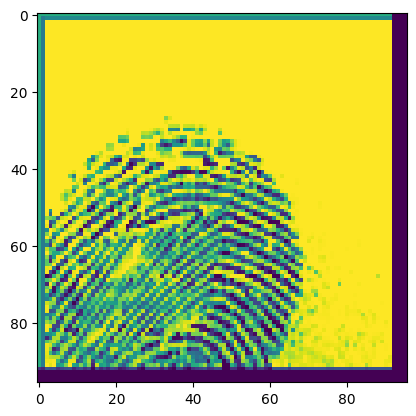

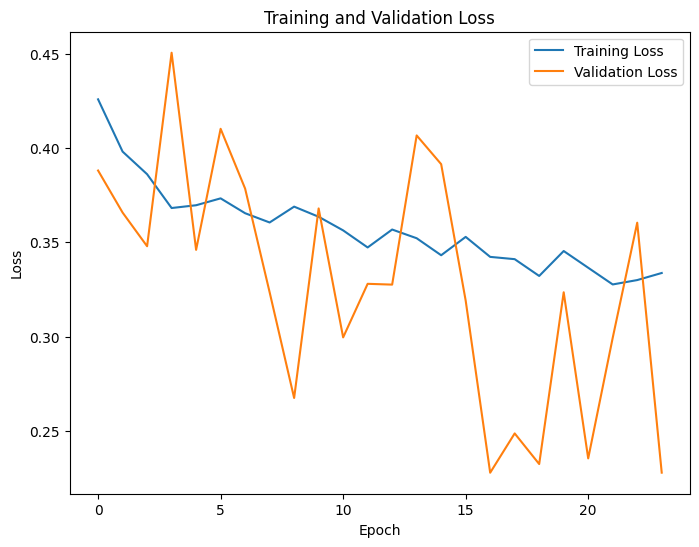

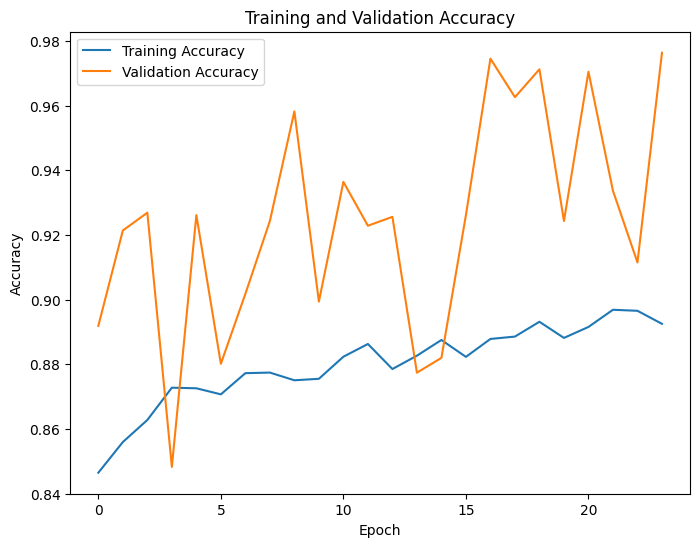

188/188 [==============================] - 15s 75ms/step - loss: 27.0021 - accuracy: 0.9178
Test Loss: 27.0021, Test Accuracy: 0.9178
188/188 [==============================] - 14s 74ms/step


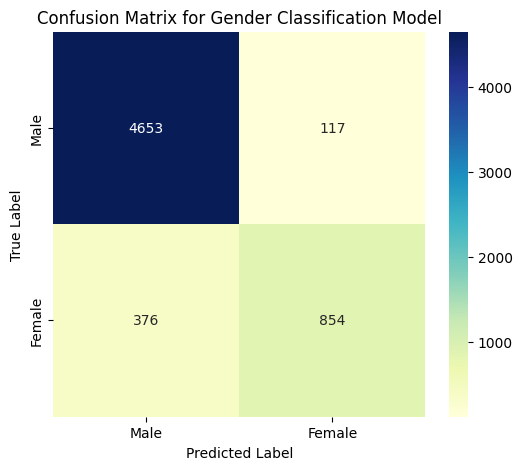

Classification Report:
              precision    recall  f1-score   support

        Male       0.93      0.98      0.95      4770
      Female       0.88      0.69      0.78      1230

    accuracy                           0.92      6000
   macro avg       0.90      0.83      0.86      6000
weighted avg       0.92      0.92      0.91      6000

Sample 32: True: Female, Predicted: Male


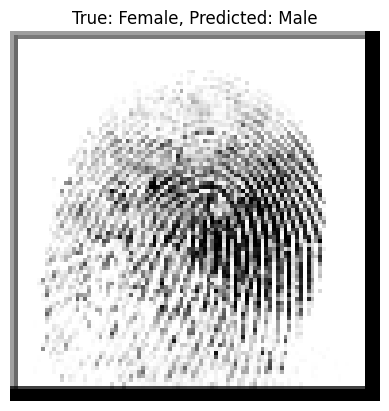

Sample 33: True: Female, Predicted: Male


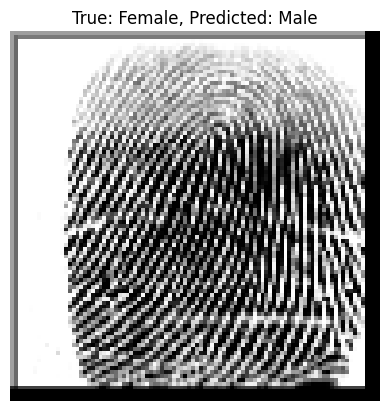

Sample 35: True: Female, Predicted: Male


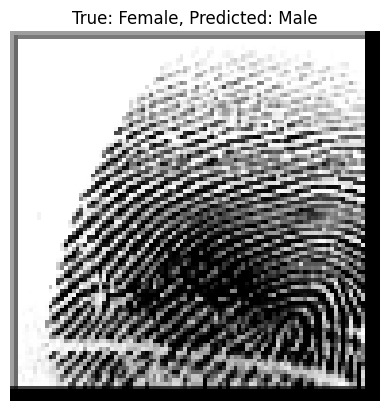

Sample 40: True: Female, Predicted: Male


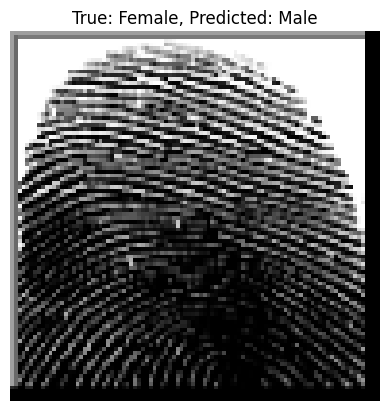

Sample 93: True: Female, Predicted: Male


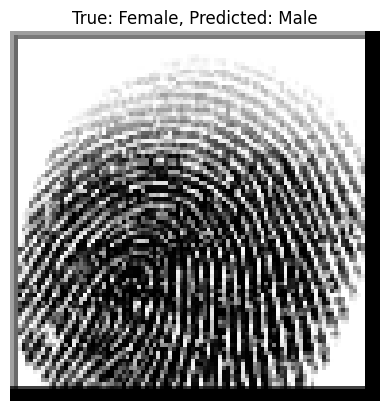

Sample 97: True: Female, Predicted: Male


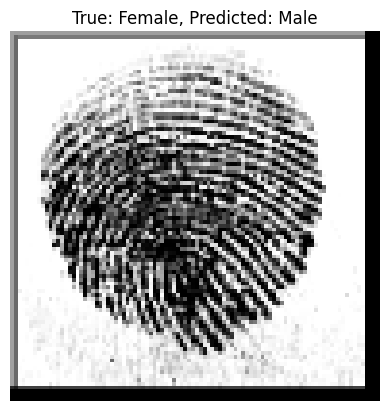

Sample 98: True: Female, Predicted: Male


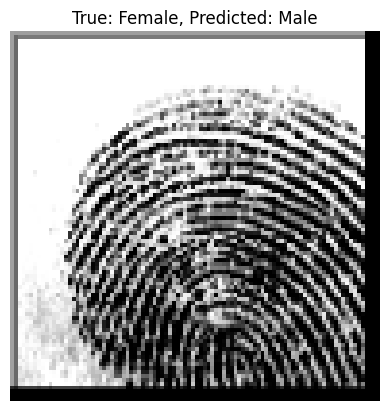

Sample 99: True: Female, Predicted: Male


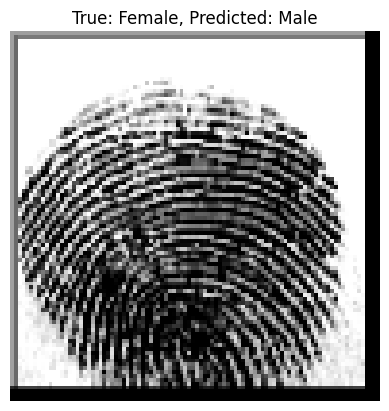

Sample 112: True: Female, Predicted: Male


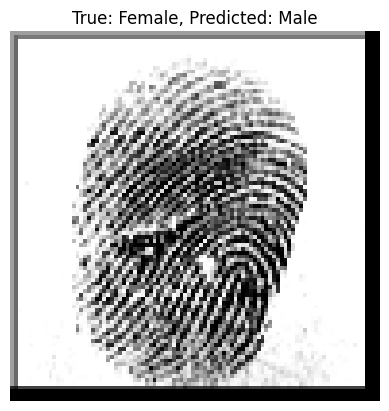

Sample 113: True: Female, Predicted: Male


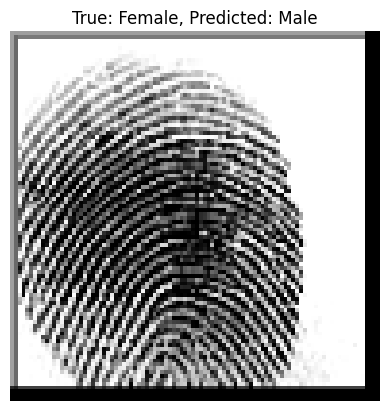

Sample 115: True: Female, Predicted: Male


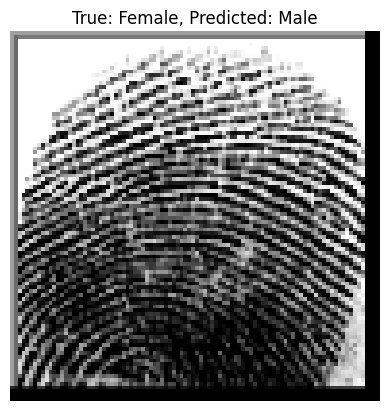

Sample 118: True: Female, Predicted: Male


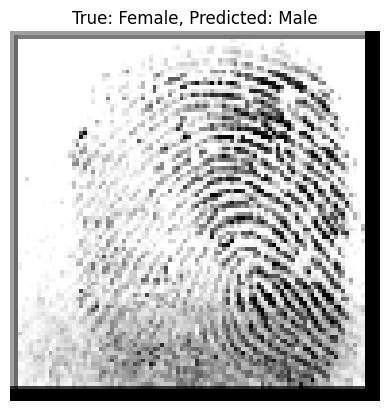

Sample 119: True: Female, Predicted: Male


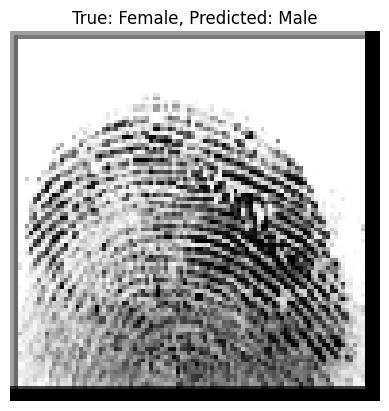

Sample 153: True: Female, Predicted: Male


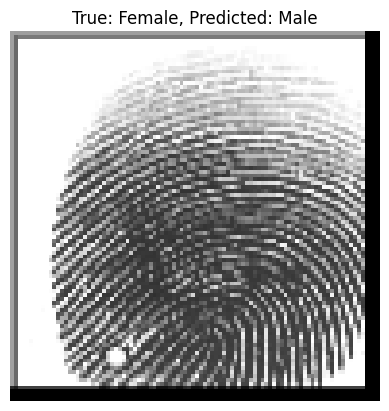

Sample 157: True: Female, Predicted: Male


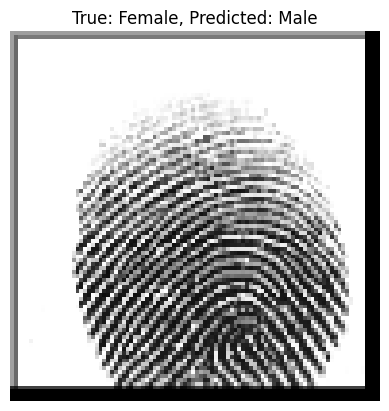

Sample 159: True: Female, Predicted: Male


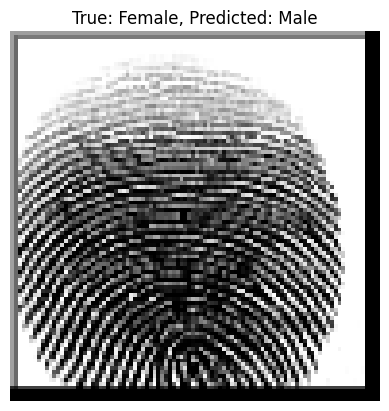

Sample 163: True: Female, Predicted: Male


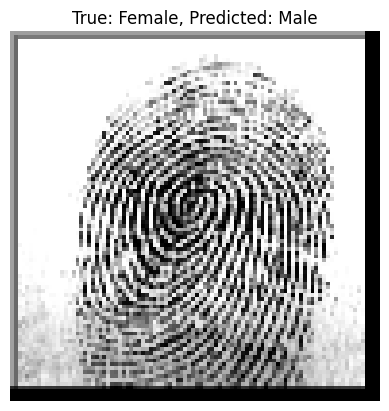

Sample 166: True: Female, Predicted: Male


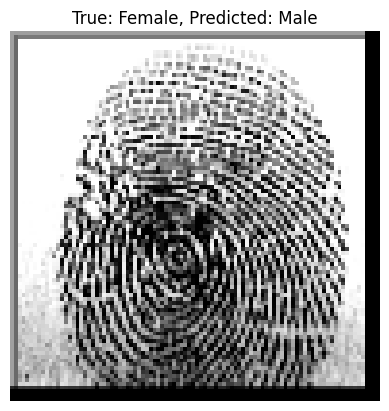

Sample 170: True: Female, Predicted: Male


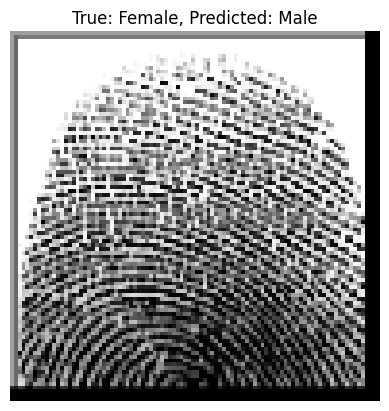

Sample 181: True: Female, Predicted: Male


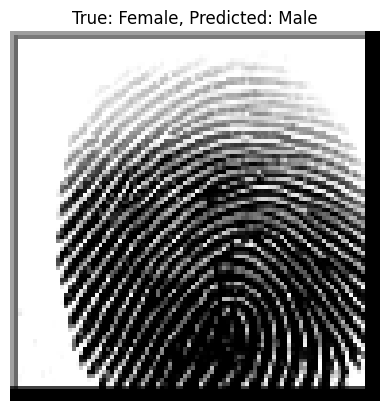

Sample 182: True: Female, Predicted: Male


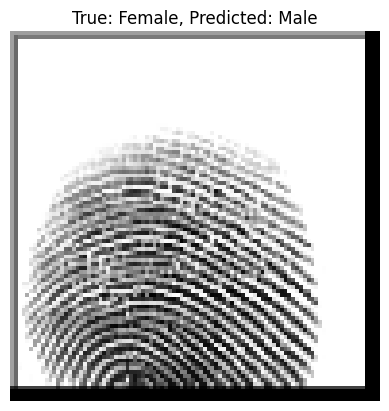

Sample 186: True: Female, Predicted: Male


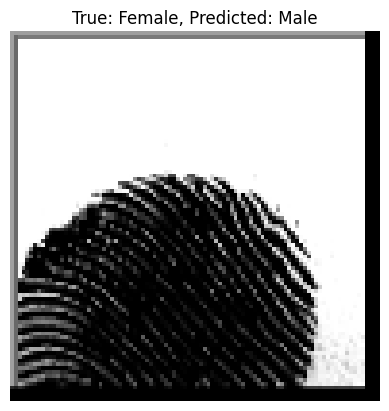

Sample 191: True: Female, Predicted: Male


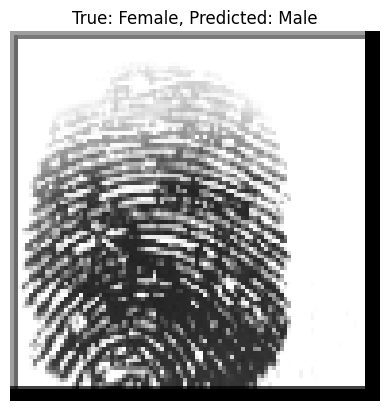

Sample 192: True: Female, Predicted: Male


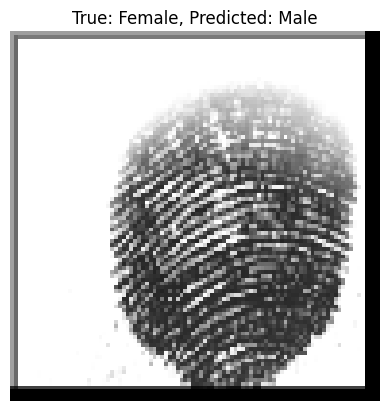

Sample 193: True: Female, Predicted: Male


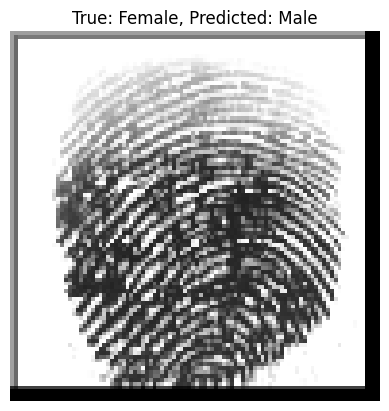

Sample 194: True: Female, Predicted: Male


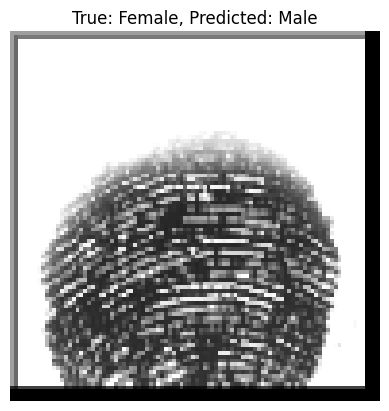

Sample 197: True: Female, Predicted: Male


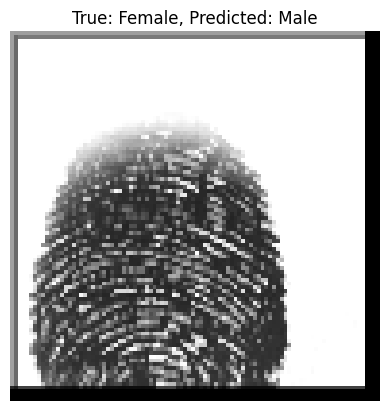

Sample 199: True: Female, Predicted: Male


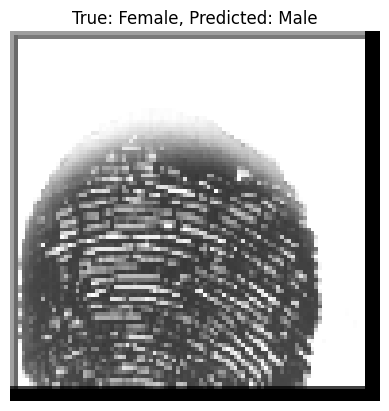

Sample 206: True: Female, Predicted: Male


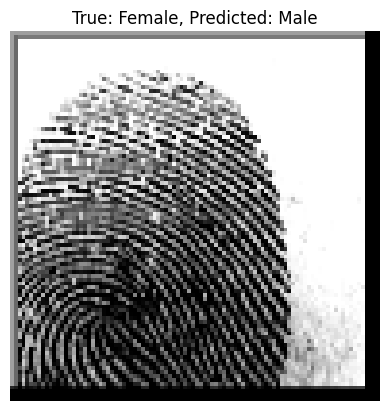

Sample 207: True: Female, Predicted: Male


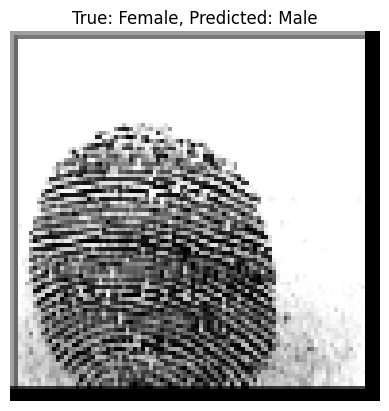

Sample 208: True: Female, Predicted: Male


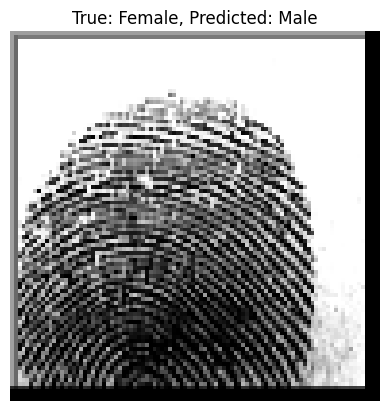

Sample 209: True: Female, Predicted: Male


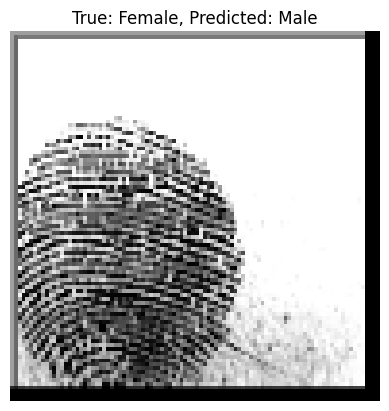

Sample 227: True: Male, Predicted: Female


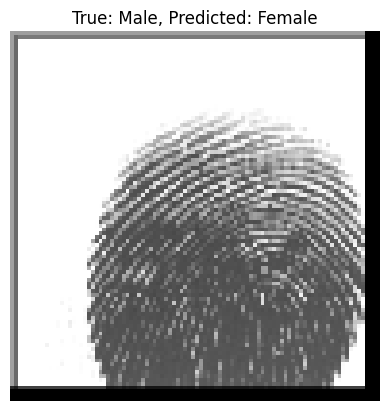

Sample 232: True: Female, Predicted: Male


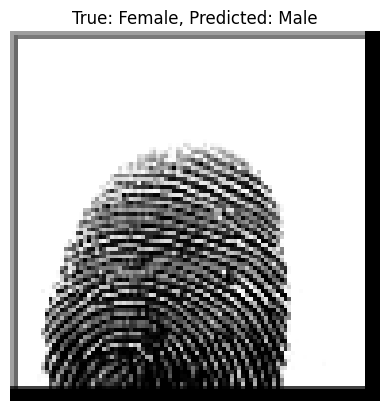

Sample 236: True: Female, Predicted: Male


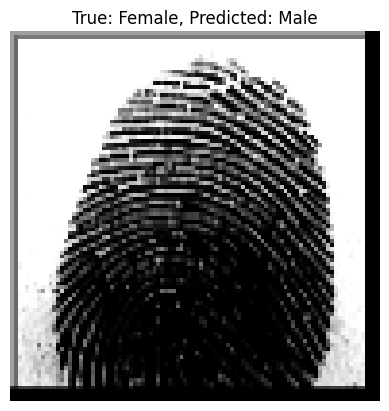

Sample 237: True: Female, Predicted: Male


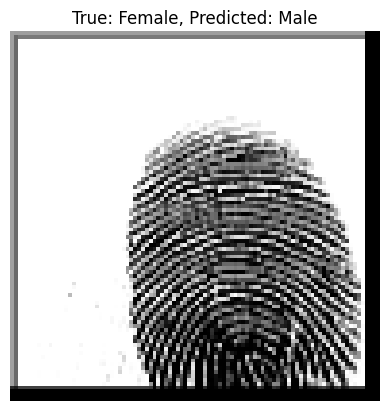

Sample 238: True: Female, Predicted: Male


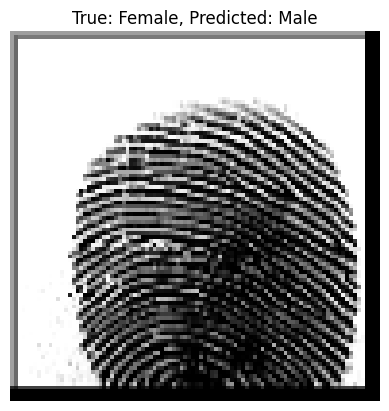

Sample 260: True: Male, Predicted: Female


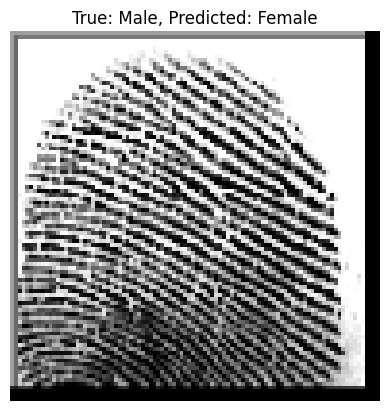

Sample 264: True: Male, Predicted: Female


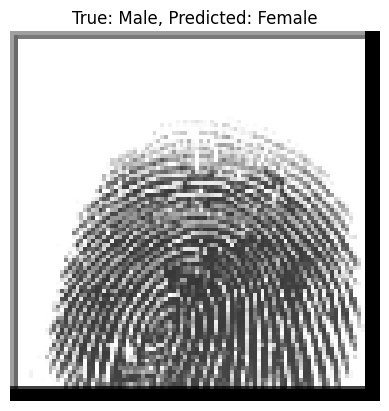

Sample 286: True: Female, Predicted: Male


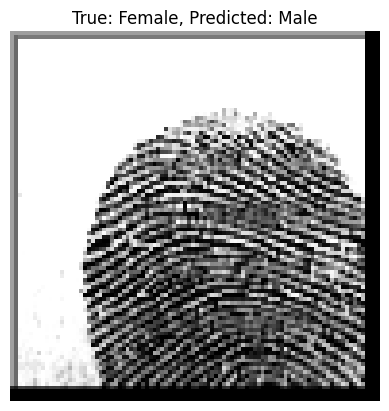

Sample 289: True: Female, Predicted: Male


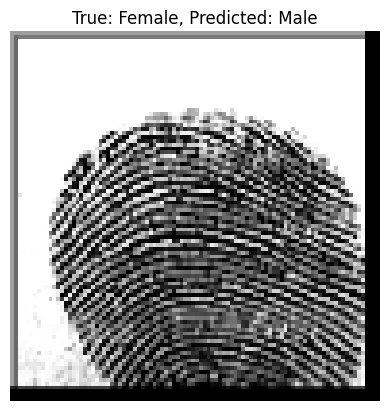

Sample 295: True: Female, Predicted: Male


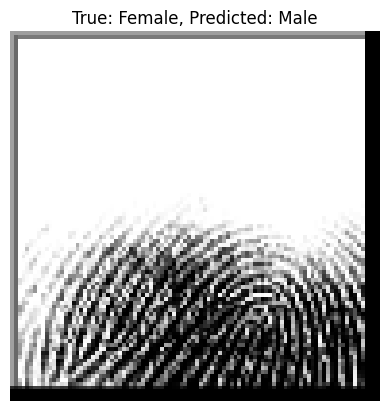

Sample 299: True: Female, Predicted: Male


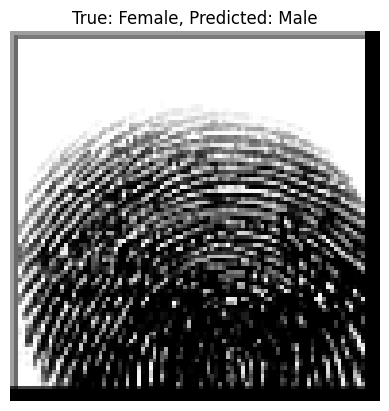

Sample 306: True: Male, Predicted: Female


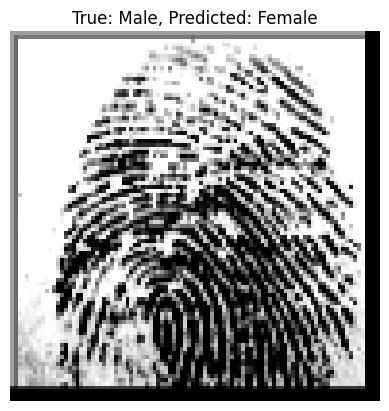

Sample 322: True: Male, Predicted: Female


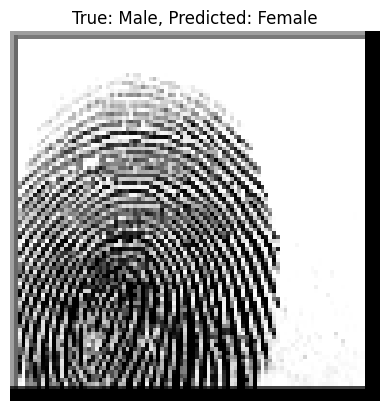

Sample 331: True: Female, Predicted: Male


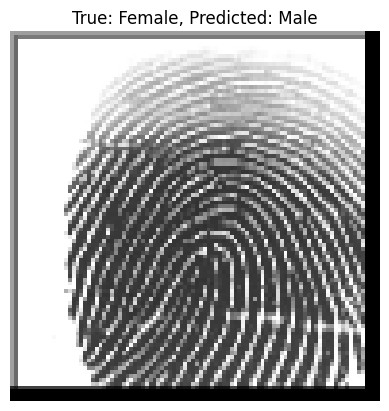

Sample 332: True: Female, Predicted: Male


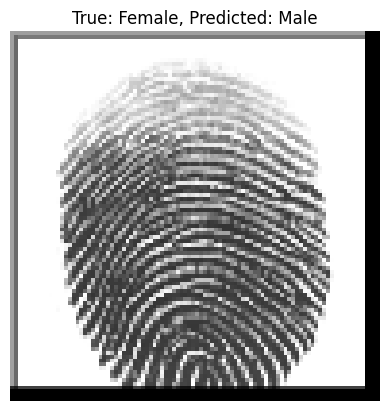

Sample 333: True: Female, Predicted: Male


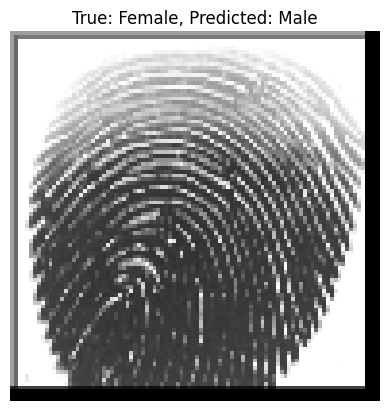

Sample 336: True: Female, Predicted: Male


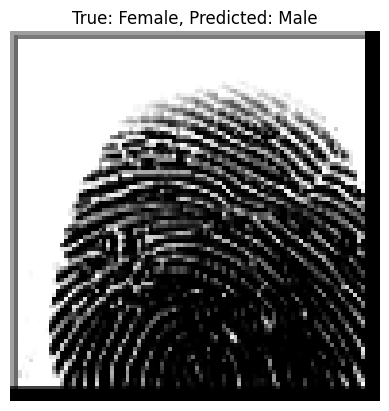

Sample 337: True: Female, Predicted: Male


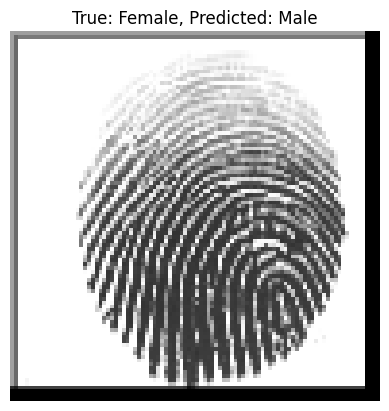

Sample 339: True: Female, Predicted: Male


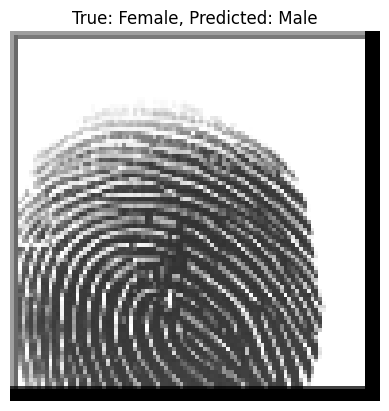

Sample 382: True: Female, Predicted: Male


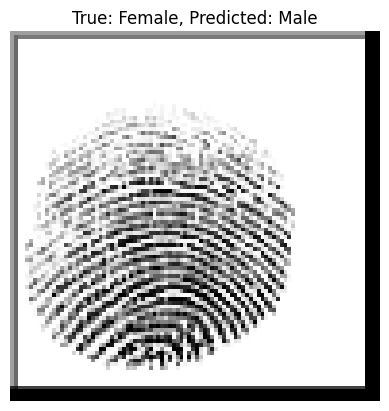

Sample 384: True: Female, Predicted: Male


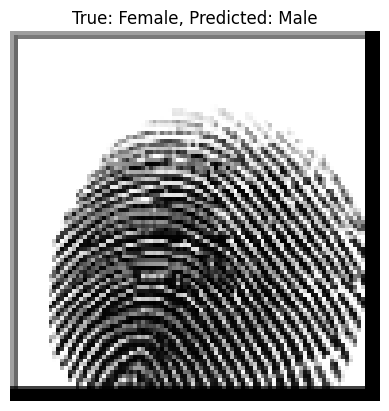

Sample 386: True: Female, Predicted: Male


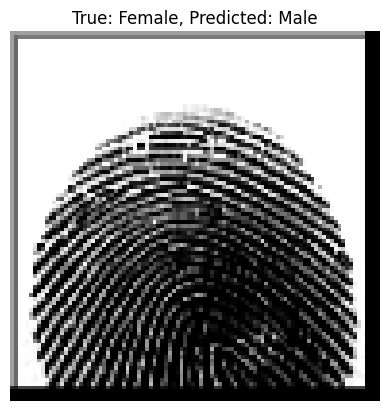

Sample 388: True: Female, Predicted: Male


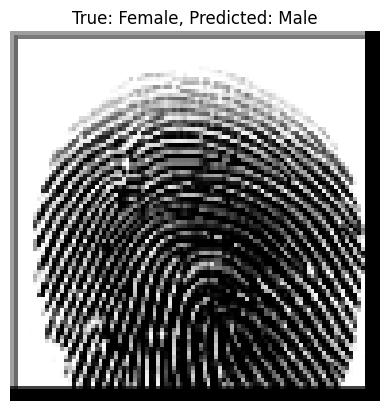

Sample 391: True: Female, Predicted: Male


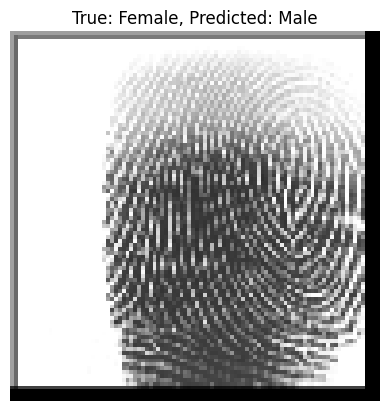

Sample 395: True: Female, Predicted: Male


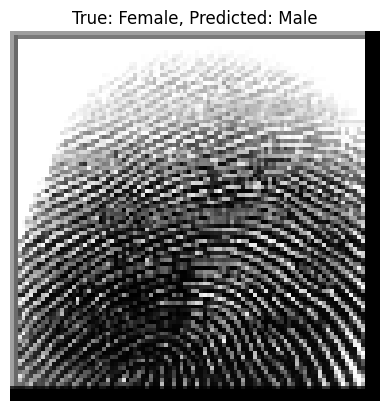

Sample 439: True: Female, Predicted: Male


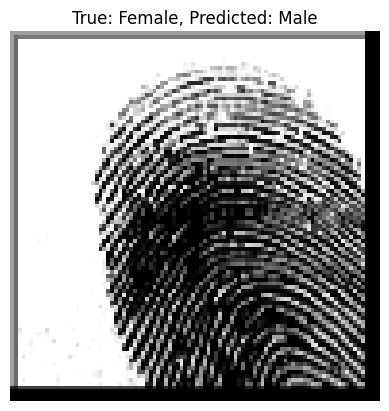

Sample 448: True: Female, Predicted: Male


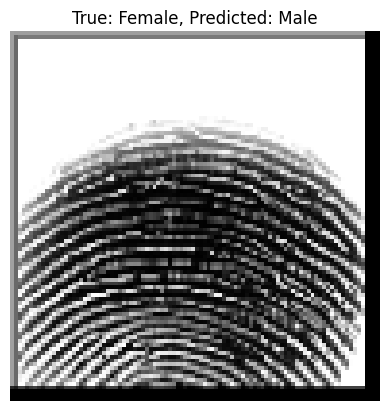

Sample 451: True: Female, Predicted: Male


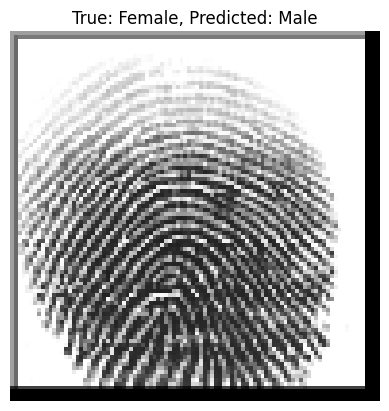

Sample 452: True: Female, Predicted: Male


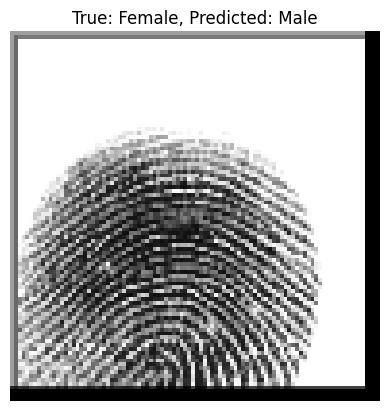

Sample 453: True: Female, Predicted: Male


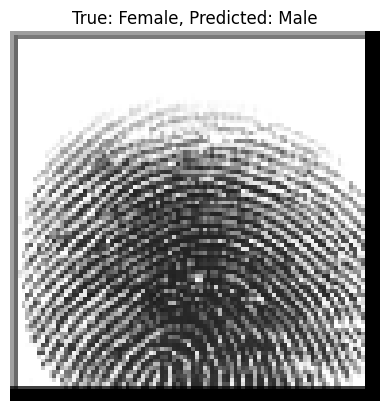

Sample 458: True: Female, Predicted: Male


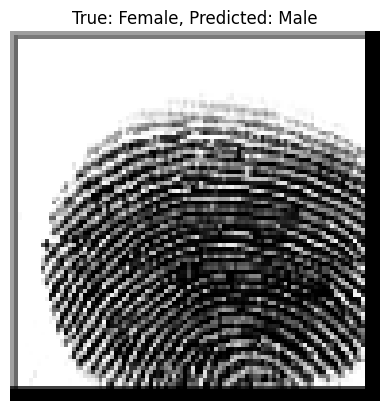

Sample 461: True: Female, Predicted: Male


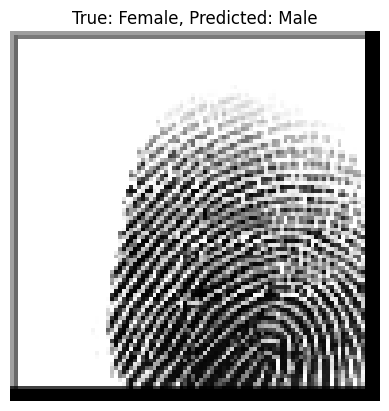

Sample 462: True: Female, Predicted: Male


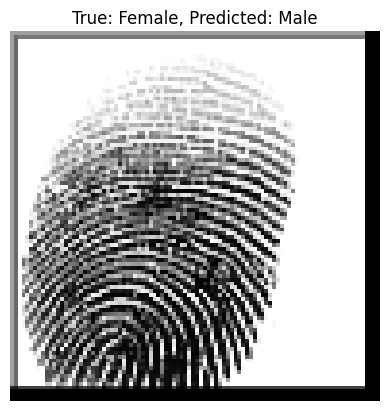

Sample 467: True: Female, Predicted: Male


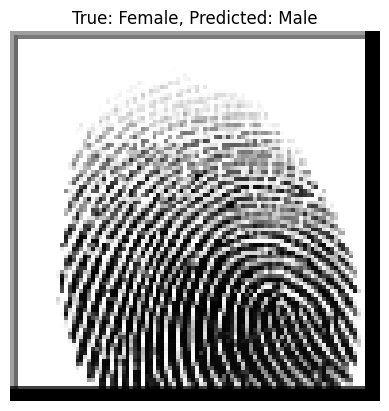

Sample 469: True: Female, Predicted: Male


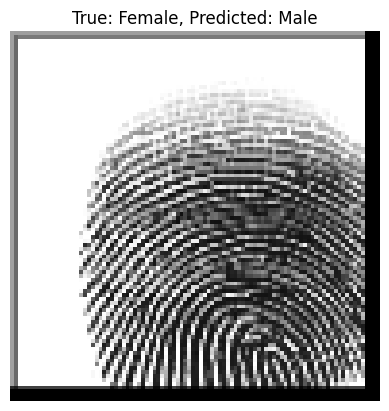

Sample 470: True: Female, Predicted: Male


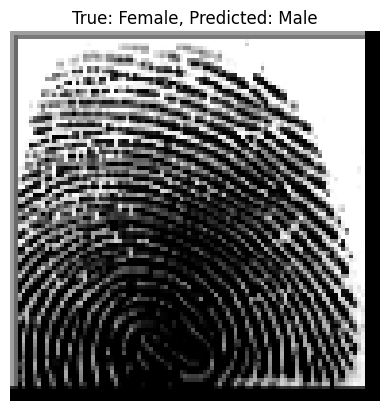

Sample 481: True: Male, Predicted: Female


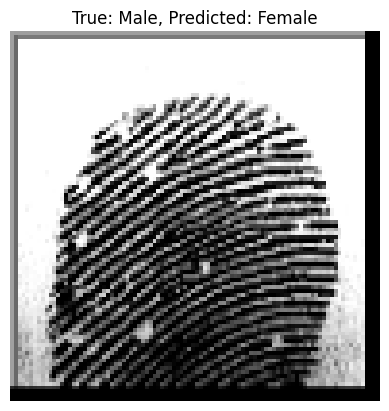

Sample 483: True: Male, Predicted: Female


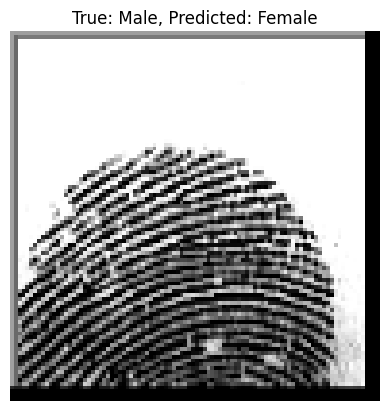

Sample 533: True: Female, Predicted: Male


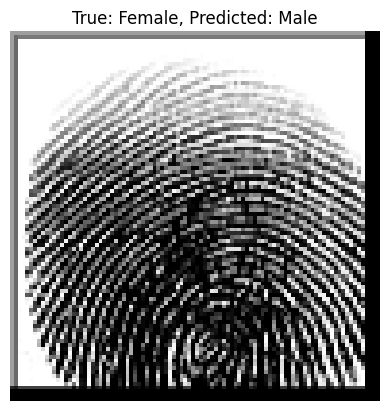

Sample 552: True: Male, Predicted: Female


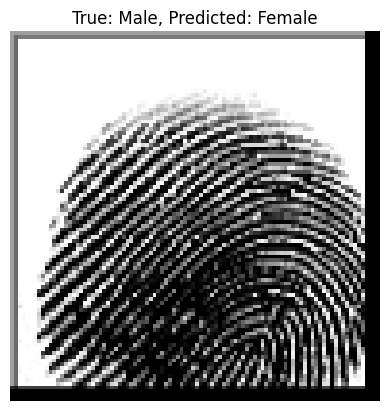

Sample 572: True: Male, Predicted: Female


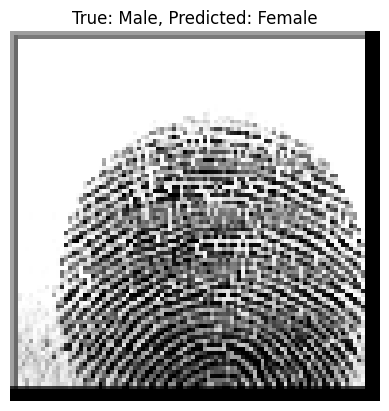

Sample 601: True: Male, Predicted: Female


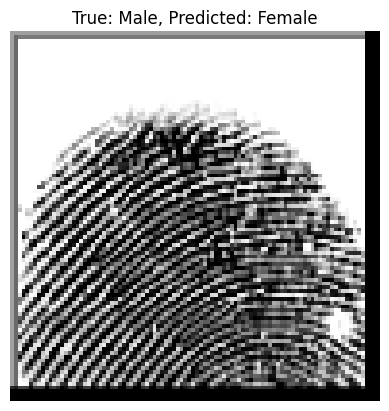

Sample 623: True: Male, Predicted: Female


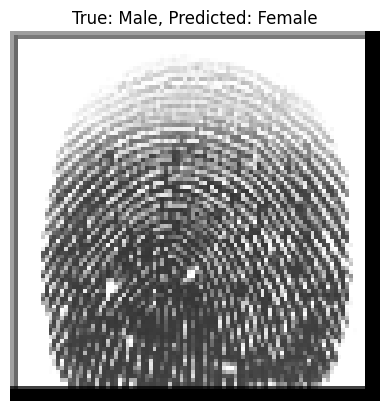

Sample 651: True: Female, Predicted: Male


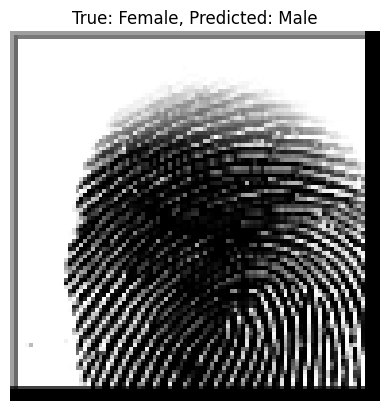

Sample 654: True: Female, Predicted: Male


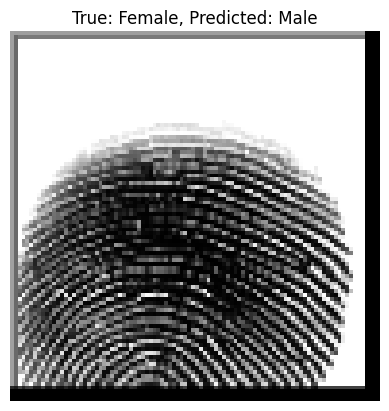

Sample 662: True: Male, Predicted: Female


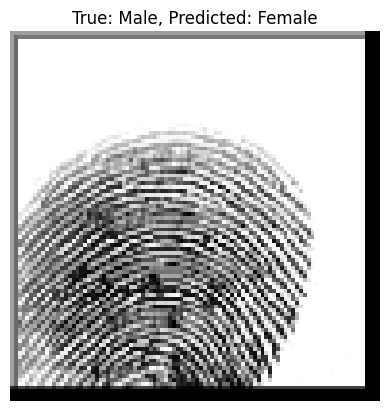

Sample 667: True: Male, Predicted: Female


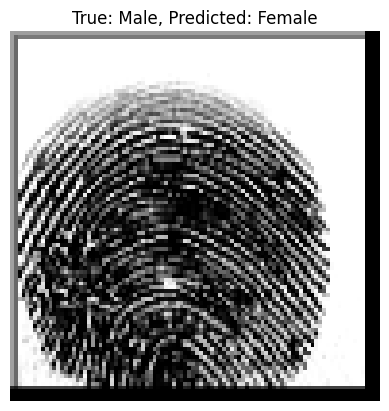

Sample 676: True: Female, Predicted: Male


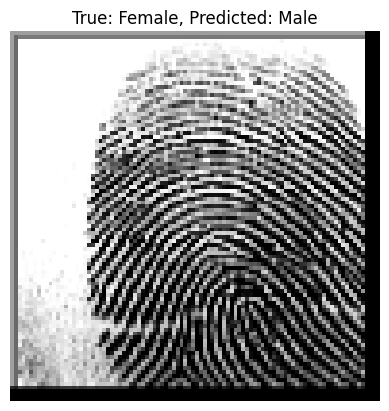

Sample 692: True: Male, Predicted: Female


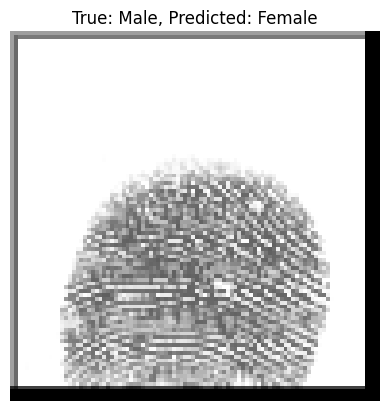

Sample 747: True: Male, Predicted: Female


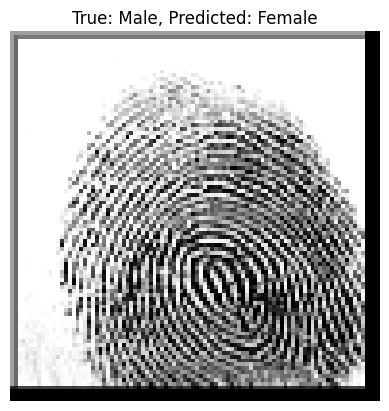

Sample 748: True: Male, Predicted: Female


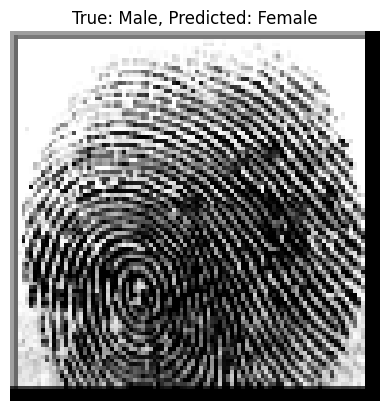

Sample 752: True: Female, Predicted: Male


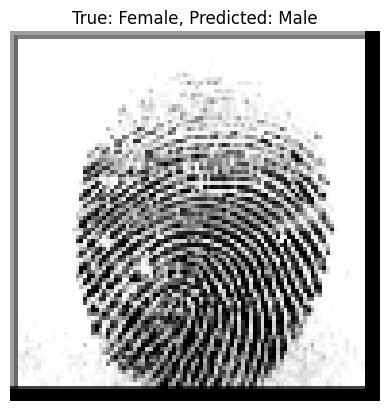

Sample 753: True: Female, Predicted: Male


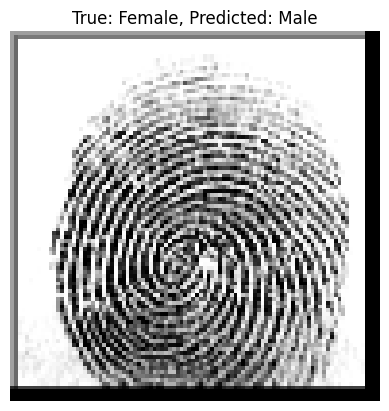

Sample 755: True: Female, Predicted: Male


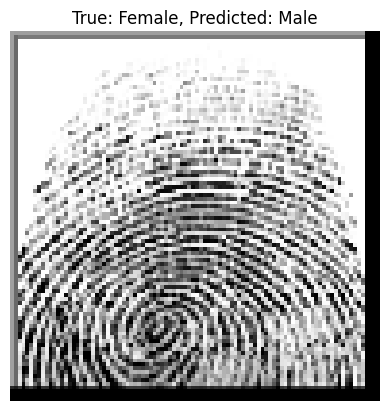

Sample 757: True: Female, Predicted: Male


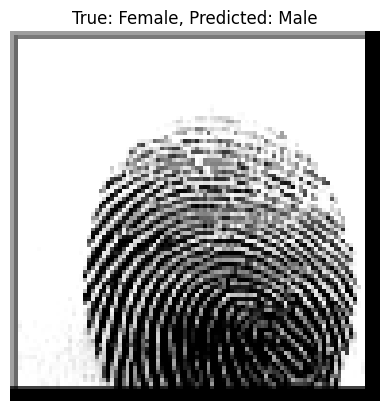

Sample 759: True: Female, Predicted: Male


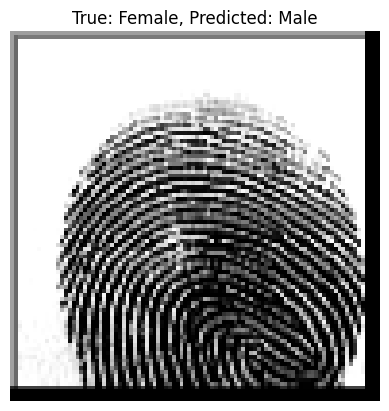

Sample 760: True: Female, Predicted: Male


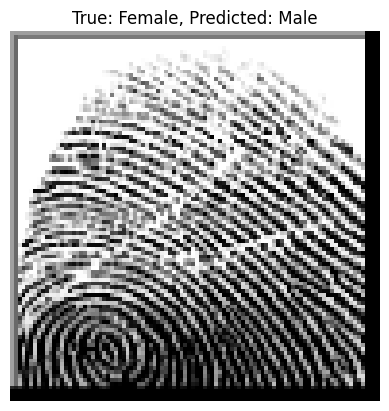

Sample 804: True: Female, Predicted: Male


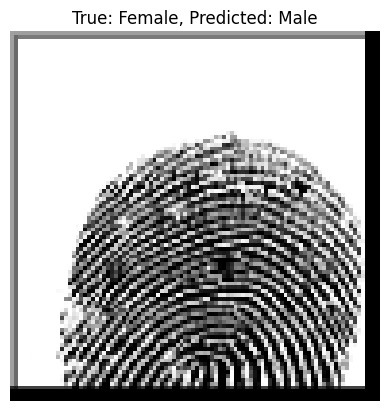

Sample 807: True: Female, Predicted: Male


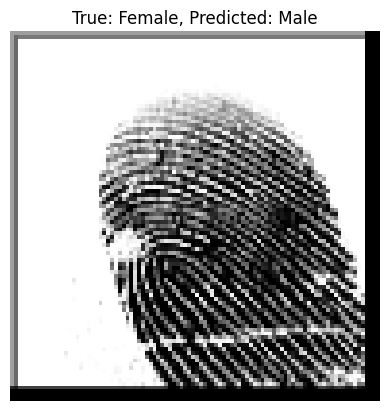

Sample 808: True: Female, Predicted: Male


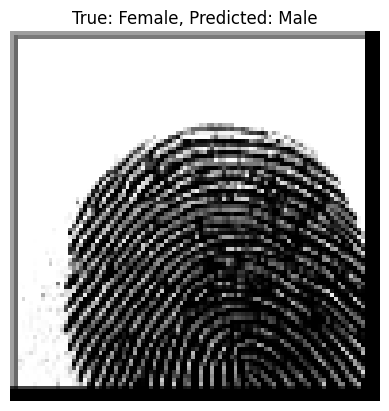

Sample 811: True: Female, Predicted: Male


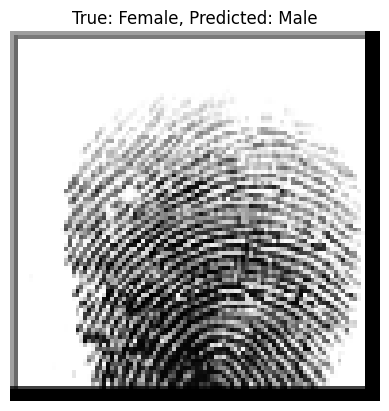

Sample 813: True: Female, Predicted: Male


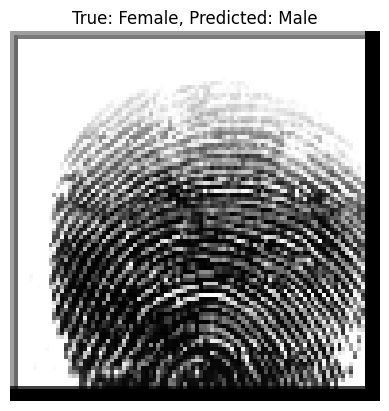

Sample 814: True: Female, Predicted: Male


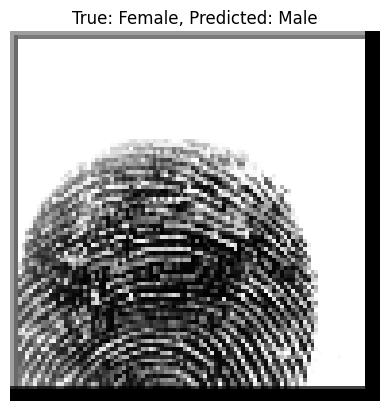

Sample 845: True: Female, Predicted: Male


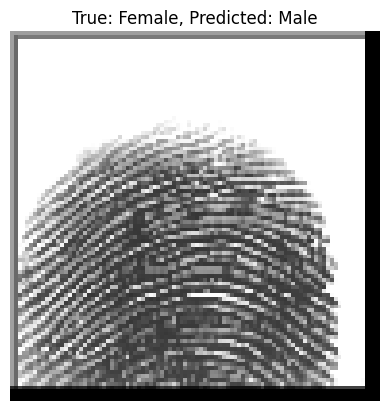

Sample 847: True: Female, Predicted: Male


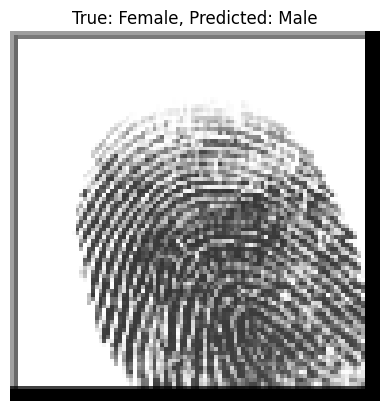

Sample 848: True: Female, Predicted: Male


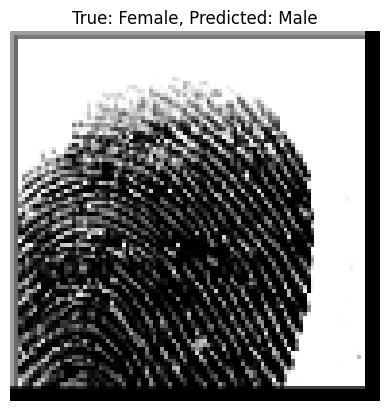

Sample 849: True: Female, Predicted: Male


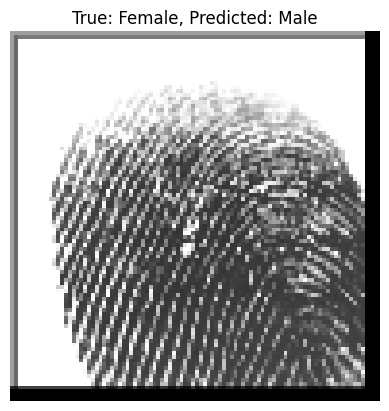

Sample 850: True: Female, Predicted: Male


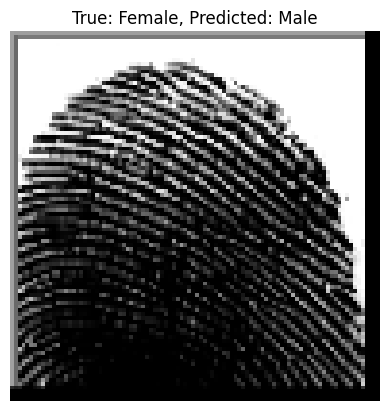

Sample 882: True: Female, Predicted: Male


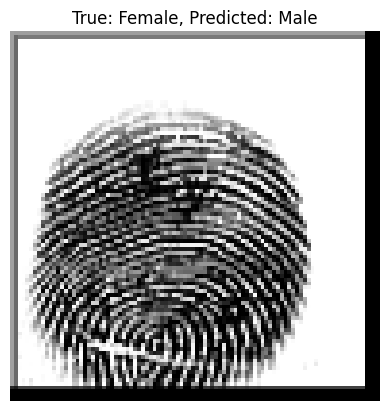

Sample 890: True: Female, Predicted: Male


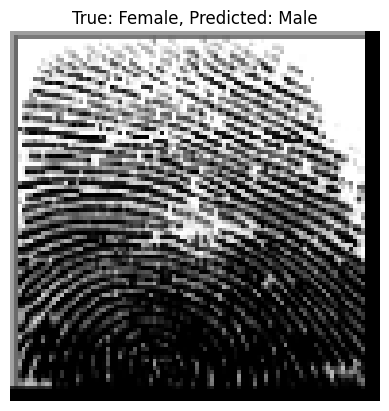

Sample 940: True: Male, Predicted: Female


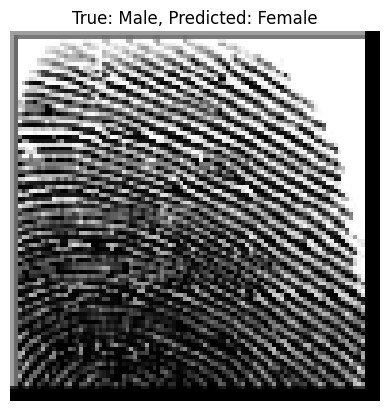

Sample 971: True: Female, Predicted: Male


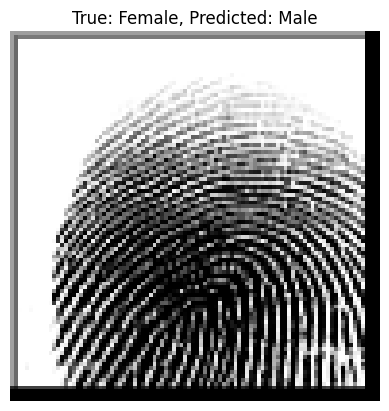

Sample 972: True: Female, Predicted: Male


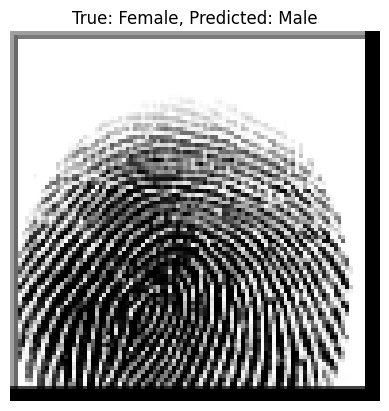

Sample 977: True: Female, Predicted: Male


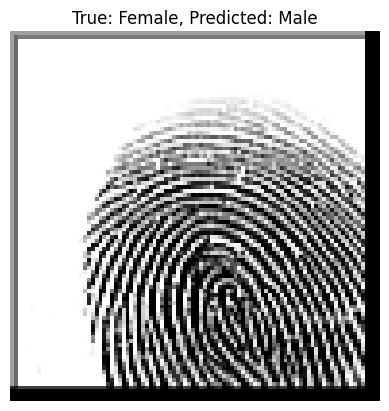

Sample 979: True: Female, Predicted: Male


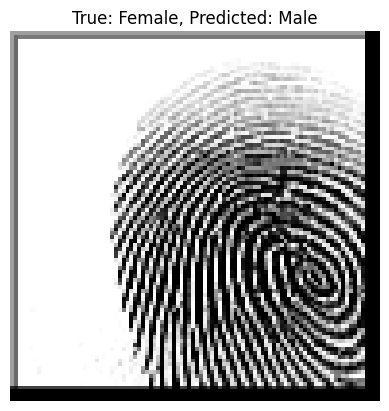

Sample 994: True: Male, Predicted: Female


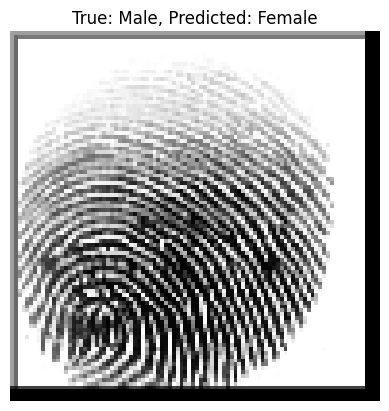

Sample 1001: True: Female, Predicted: Male


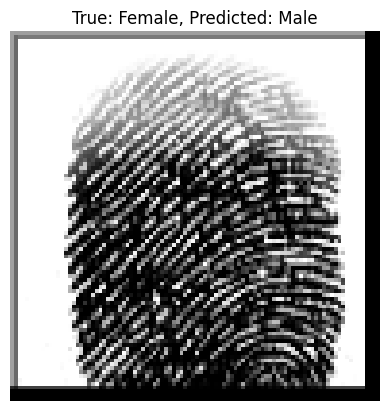

Sample 1007: True: Female, Predicted: Male


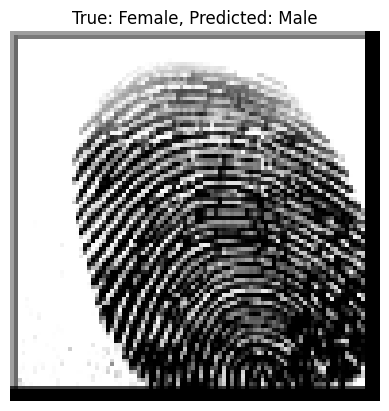

Sample 1052: True: Male, Predicted: Female


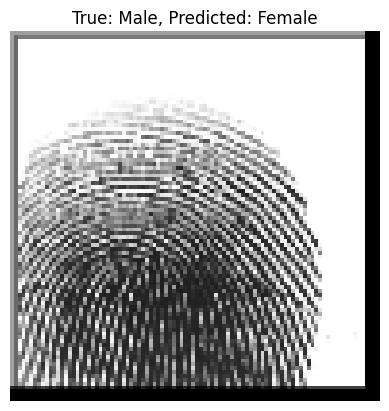

Sample 1080: True: Male, Predicted: Female


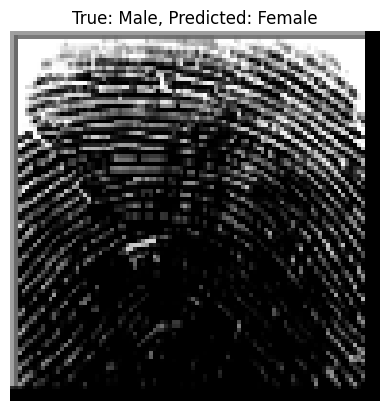

Sample 1103: True: Male, Predicted: Female


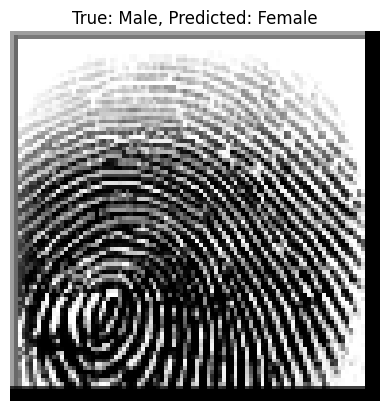

Sample 1107: True: Male, Predicted: Female


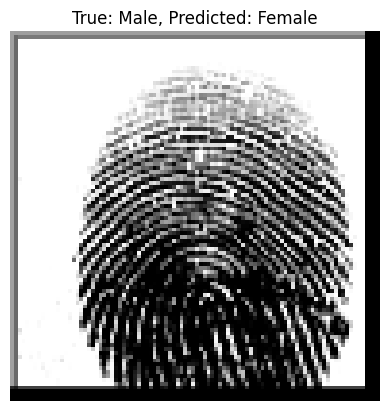

Sample 1121: True: Female, Predicted: Male


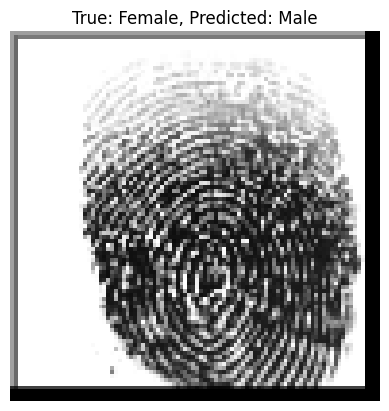

Sample 1122: True: Female, Predicted: Male


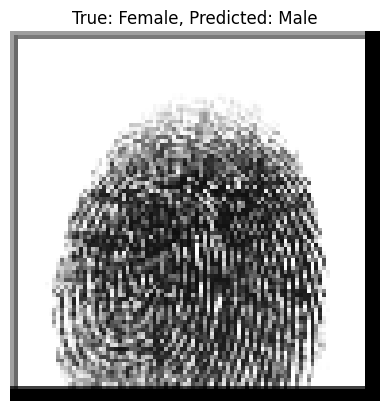

Sample 1130: True: Female, Predicted: Male


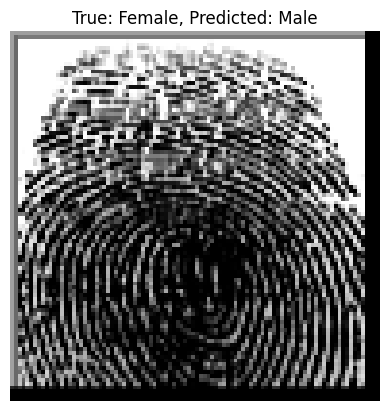

Sample 1138: True: Male, Predicted: Female


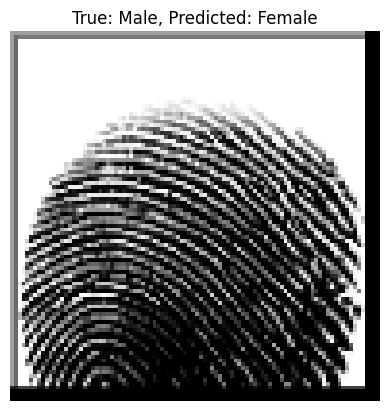

Sample 1140: True: Male, Predicted: Female


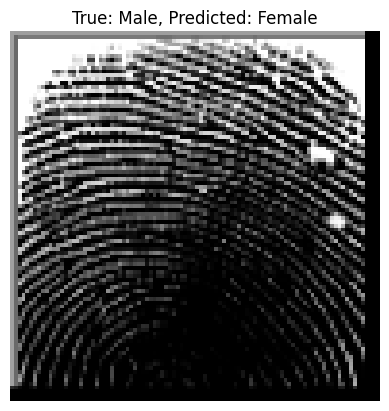

Sample 1155: True: Female, Predicted: Male


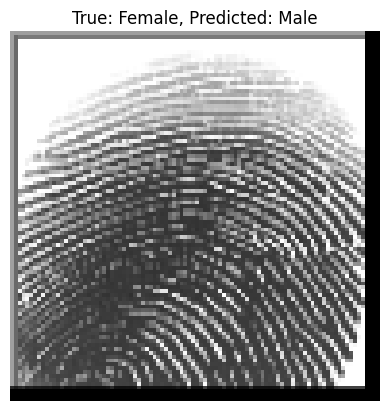

Sample 1159: True: Female, Predicted: Male


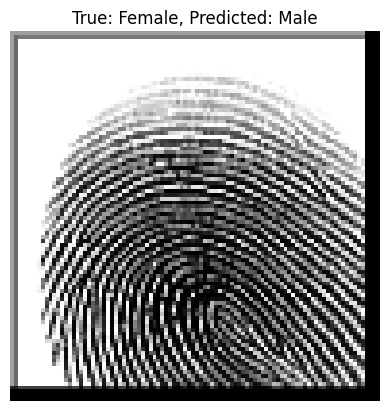

Sample 1160: True: Female, Predicted: Male


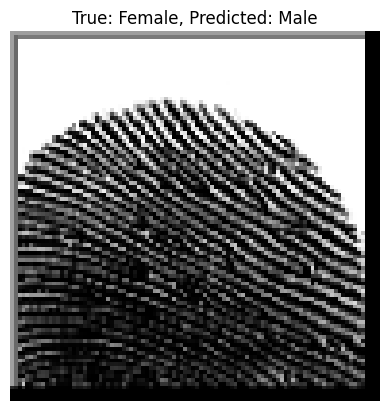

Sample 1162: True: Female, Predicted: Male


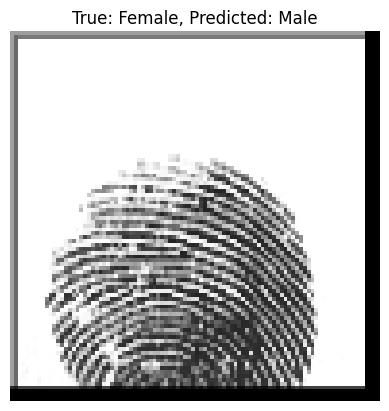

Sample 1163: True: Female, Predicted: Male


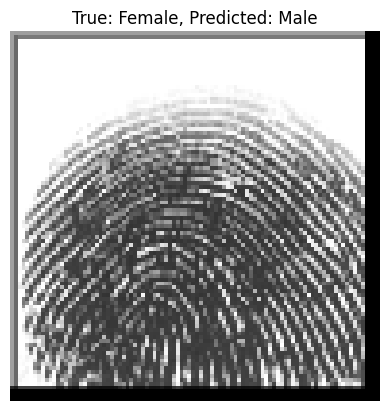

Sample 1164: True: Female, Predicted: Male


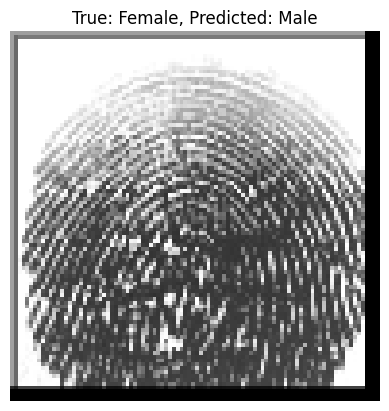

Sample 1165: True: Female, Predicted: Male


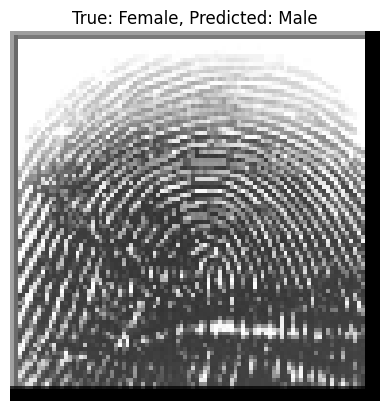

Sample 1167: True: Female, Predicted: Male


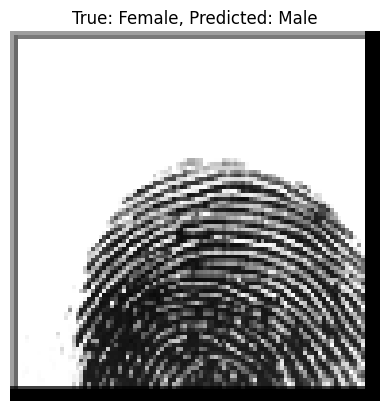

Sample 1169: True: Female, Predicted: Male


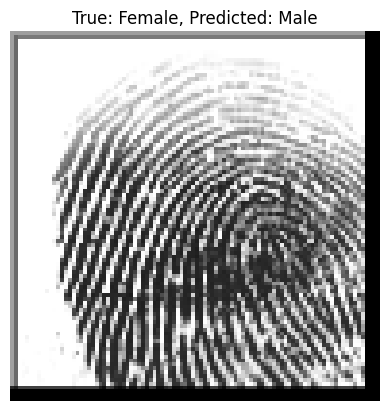

Sample 1192: True: Male, Predicted: Female


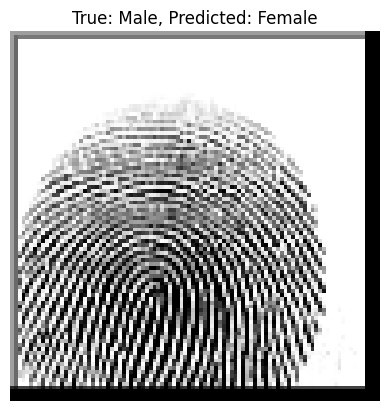

Sample 1202: True: Female, Predicted: Male


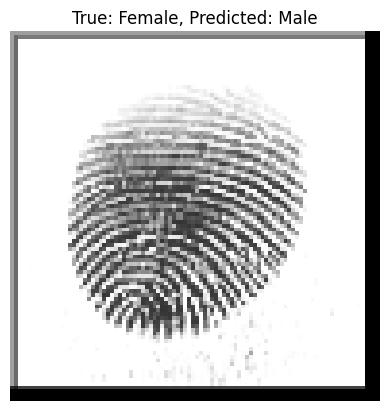

Sample 1203: True: Female, Predicted: Male


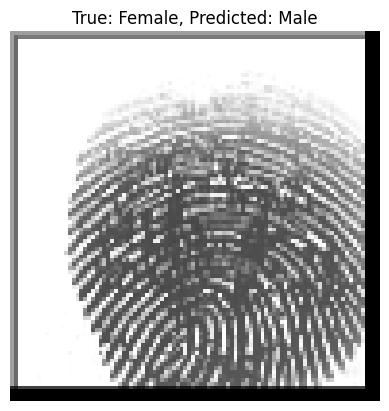

Sample 1206: True: Female, Predicted: Male


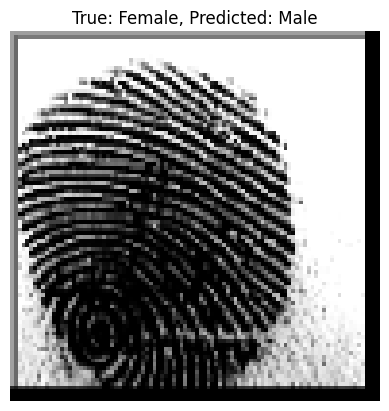

Sample 1207: True: Female, Predicted: Male


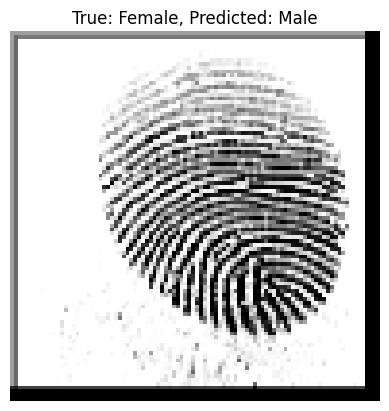

Sample 1208: True: Female, Predicted: Male


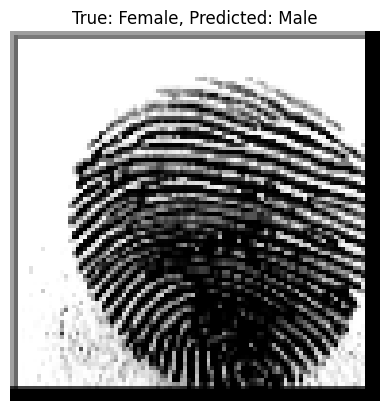

Sample 1209: True: Female, Predicted: Male


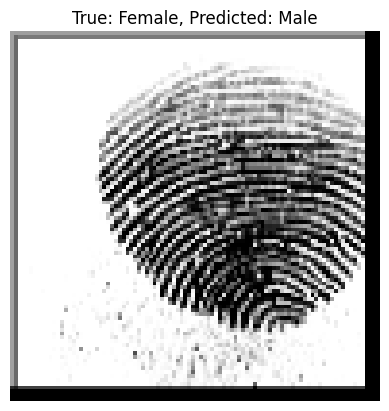

Sample 1231: True: Male, Predicted: Female


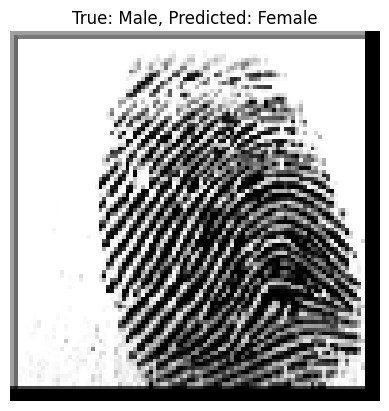

Sample 1242: True: Male, Predicted: Female


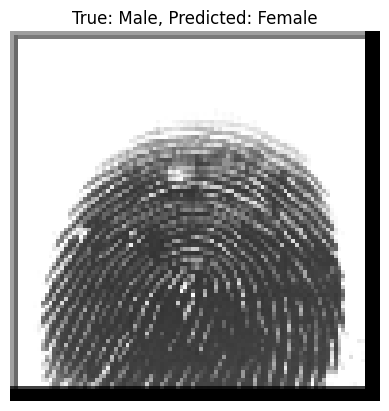

Sample 1244: True: Male, Predicted: Female


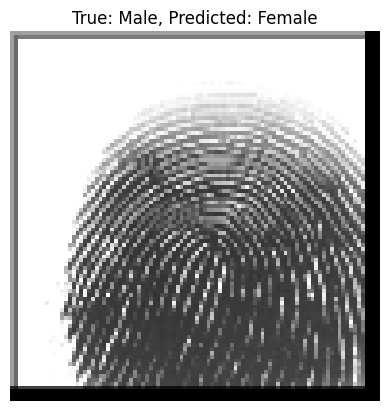

Sample 1247: True: Male, Predicted: Female


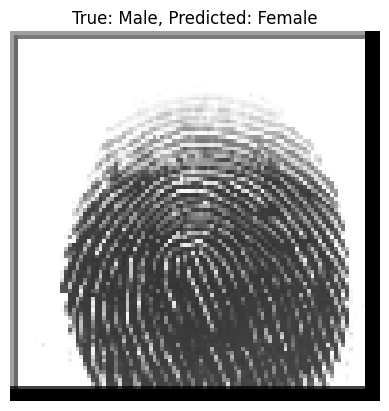

Sample 1267: True: Male, Predicted: Female


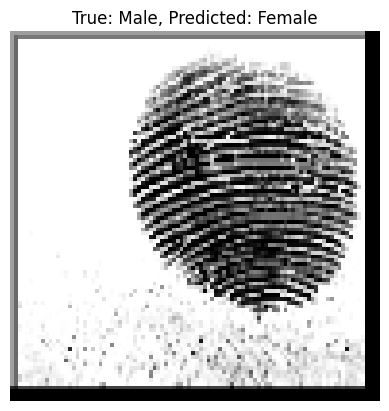

Sample 1272: True: Male, Predicted: Female


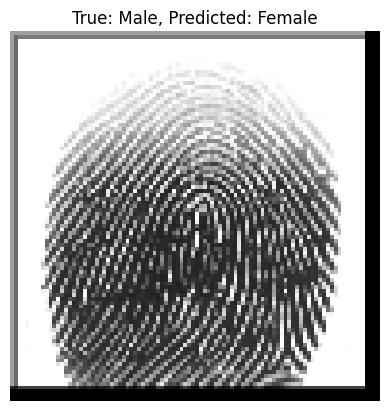

Sample 1301: True: Male, Predicted: Female


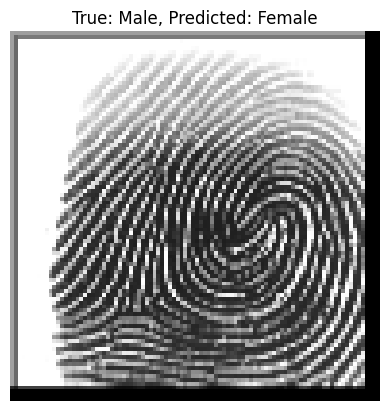

Sample 1335: True: Female, Predicted: Male


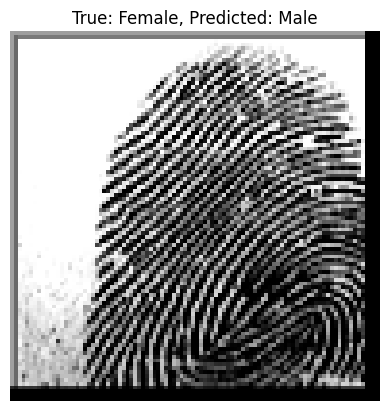

Sample 1365: True: Male, Predicted: Female


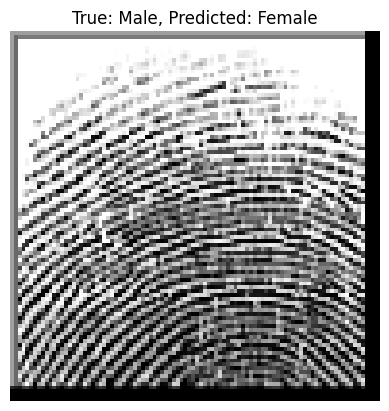

Sample 1382: True: Male, Predicted: Female


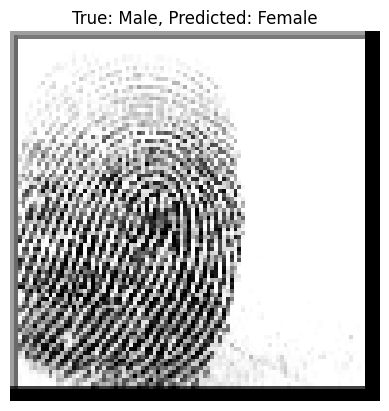

Sample 1427: True: Male, Predicted: Female


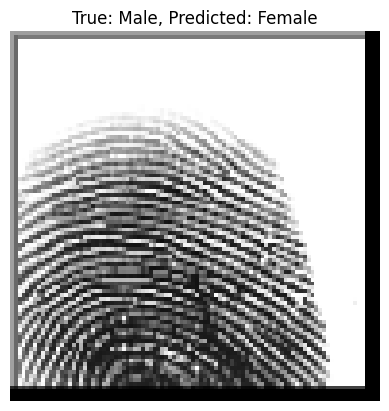

Sample 1472: True: Male, Predicted: Female


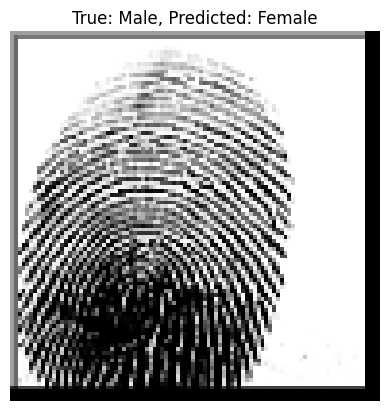

Sample 1497: True: Male, Predicted: Female


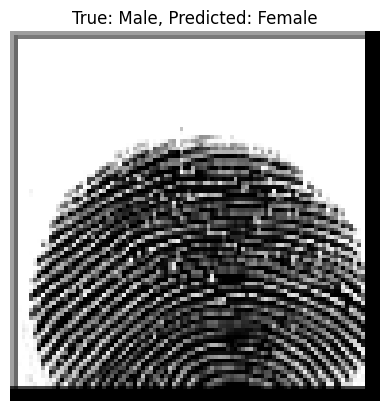

Sample 1518: True: Male, Predicted: Female


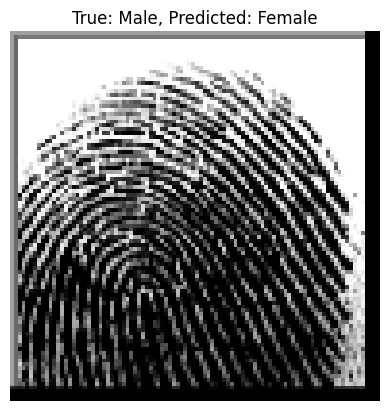

Sample 1552: True: Female, Predicted: Male


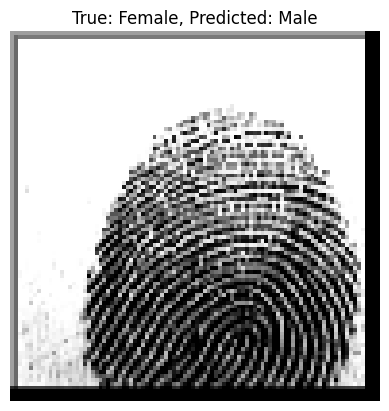

Sample 1553: True: Female, Predicted: Male


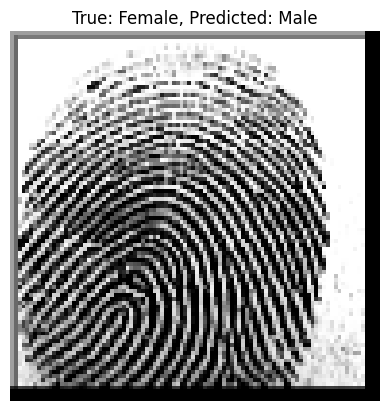

Sample 1557: True: Female, Predicted: Male


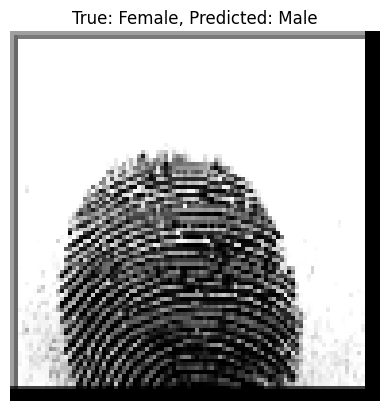

Sample 1558: True: Female, Predicted: Male


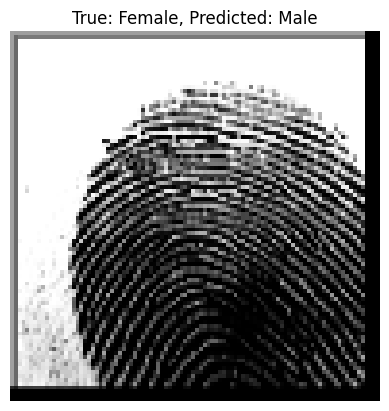

Sample 1652: True: Female, Predicted: Male


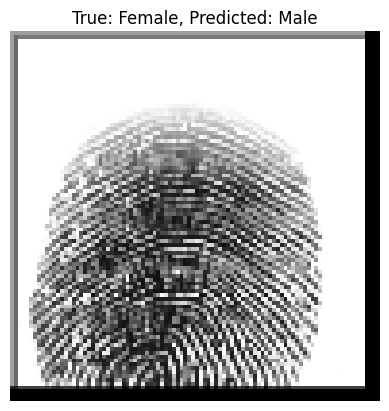

Sample 1654: True: Female, Predicted: Male


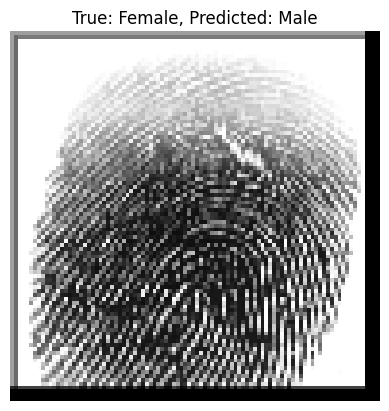

Sample 1656: True: Female, Predicted: Male


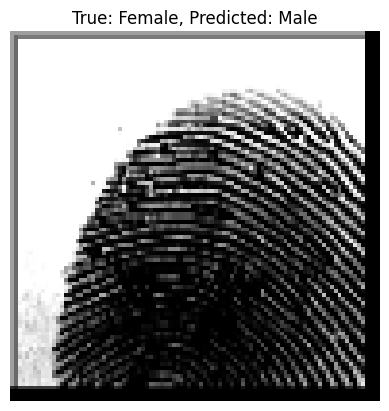

Sample 1660: True: Female, Predicted: Male


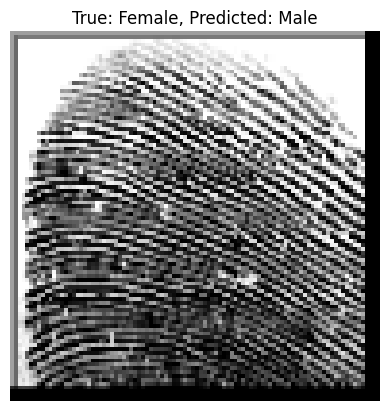

Sample 1661: True: Female, Predicted: Male


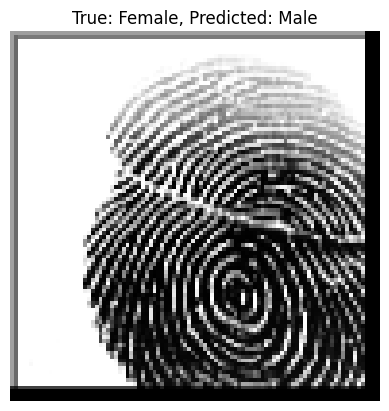

Sample 1662: True: Female, Predicted: Male


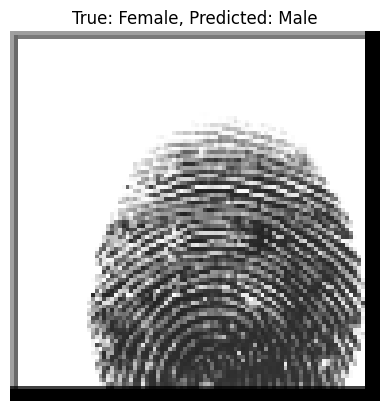

Sample 1664: True: Female, Predicted: Male


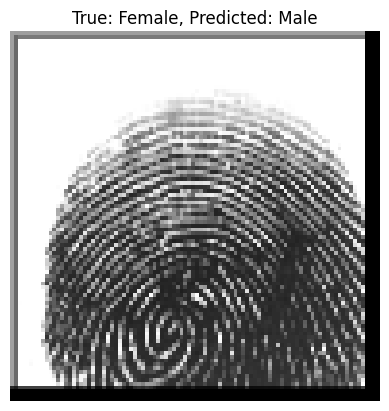

Sample 1667: True: Female, Predicted: Male


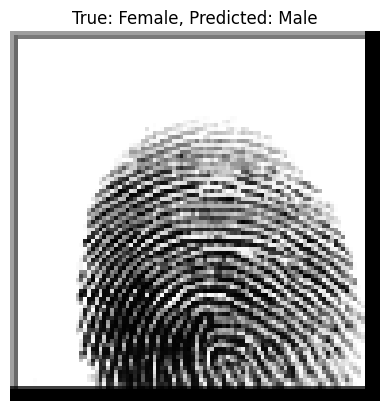

Sample 1695: True: Female, Predicted: Male


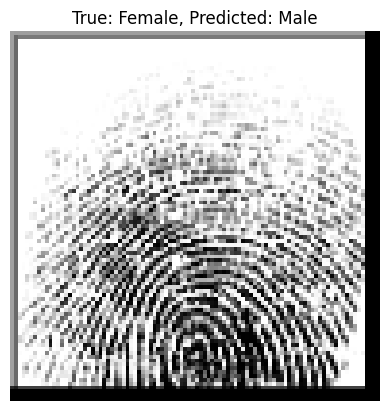

Sample 1696: True: Female, Predicted: Male


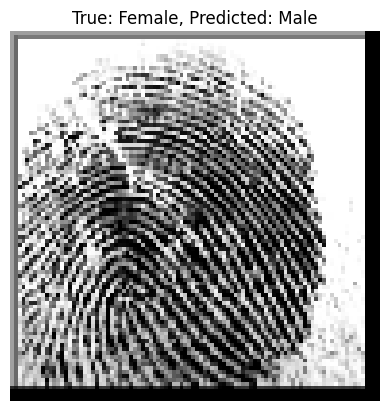

Sample 1700: True: Female, Predicted: Male


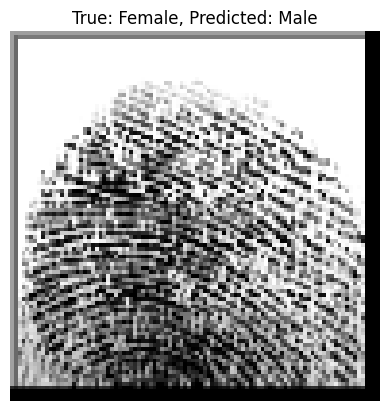

Sample 1760: True: Male, Predicted: Female


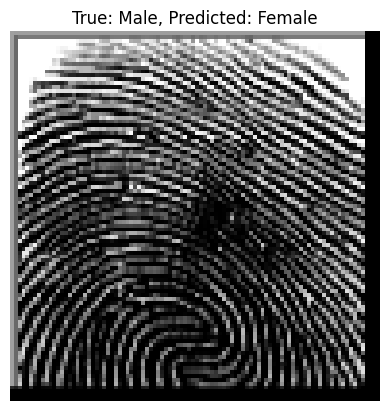

Sample 1767: True: Female, Predicted: Male


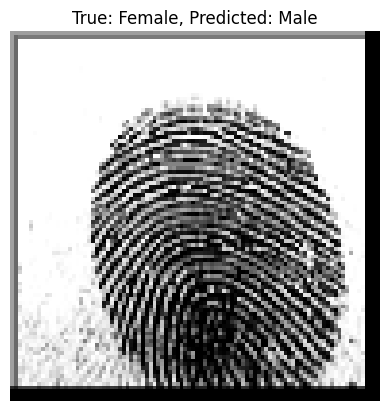

Sample 1769: True: Female, Predicted: Male


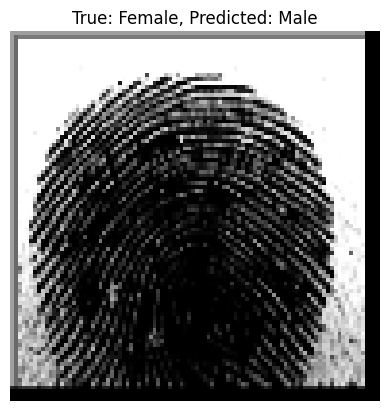

Sample 1836: True: Male, Predicted: Female


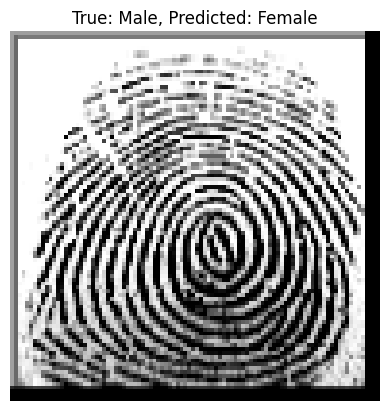

Sample 1852: True: Male, Predicted: Female


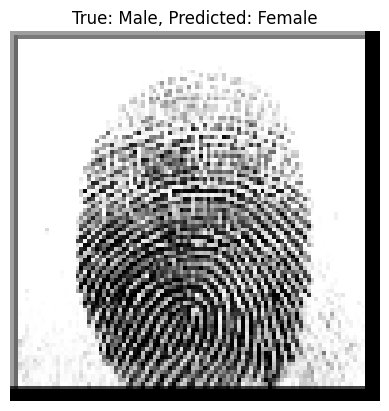

Sample 1868: True: Male, Predicted: Female


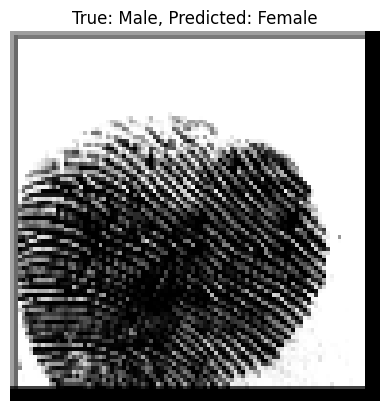

Sample 1938: True: Female, Predicted: Male


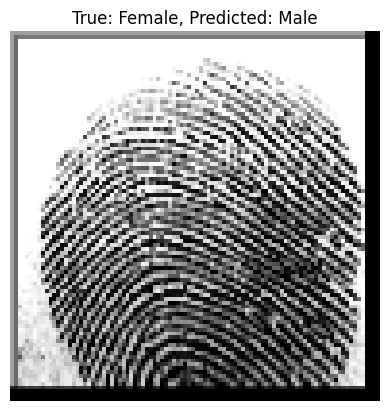

Sample 1976: True: Male, Predicted: Female


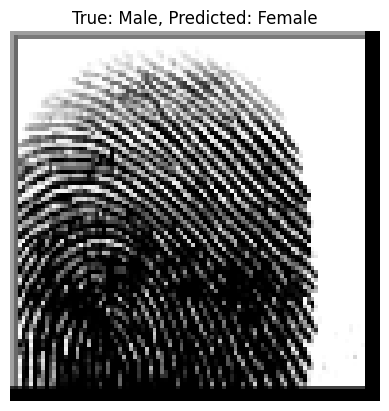

Sample 2036: True: Male, Predicted: Female


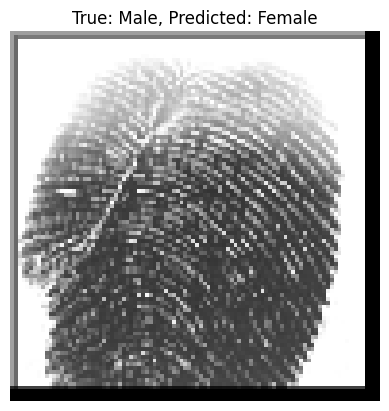

Sample 2038: True: Male, Predicted: Female


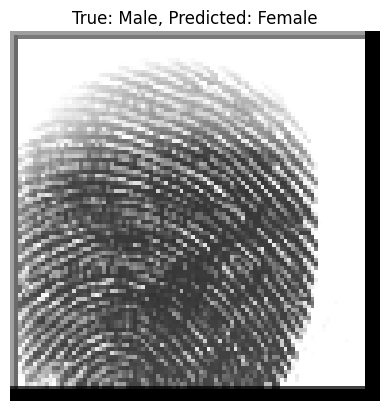

Sample 2072: True: Male, Predicted: Female


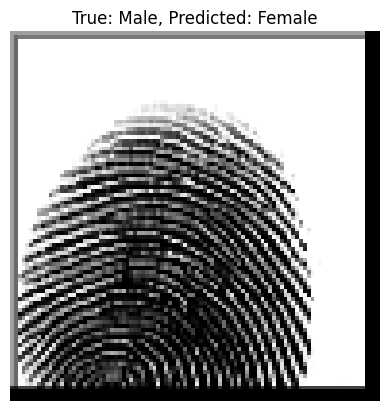

Sample 2081: True: Female, Predicted: Male


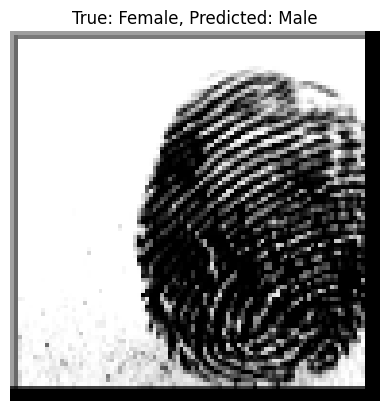

Sample 2083: True: Female, Predicted: Male


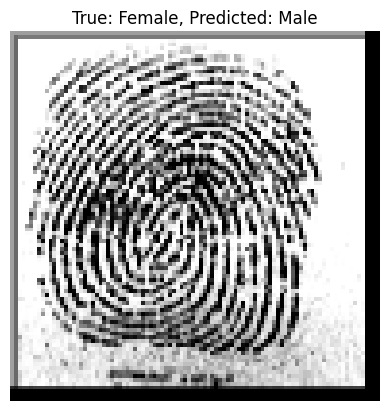

Sample 2087: True: Female, Predicted: Male


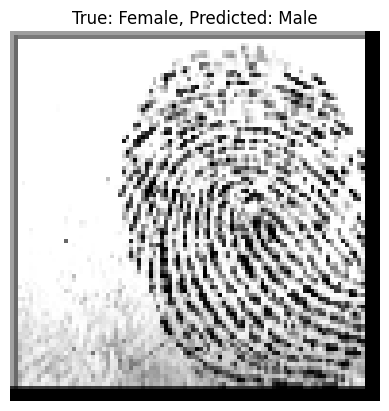

Sample 2090: True: Female, Predicted: Male


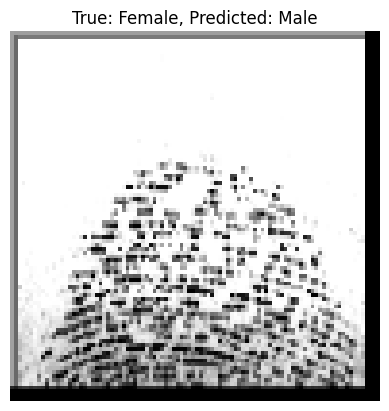

Sample 2105: True: Male, Predicted: Female


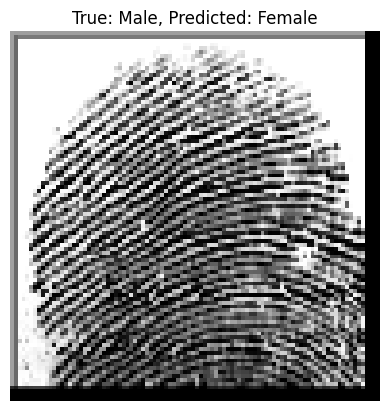

Sample 2132: True: Female, Predicted: Male


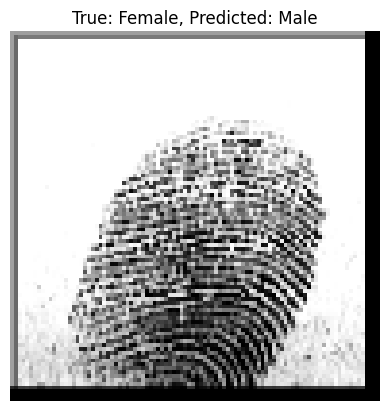

Sample 2133: True: Female, Predicted: Male


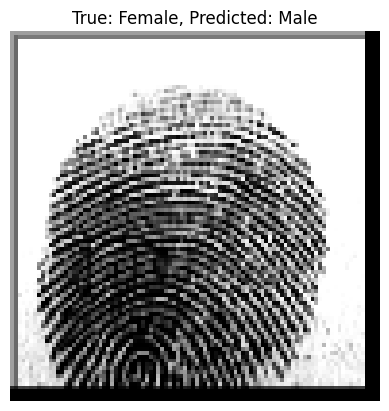

Sample 2134: True: Female, Predicted: Male


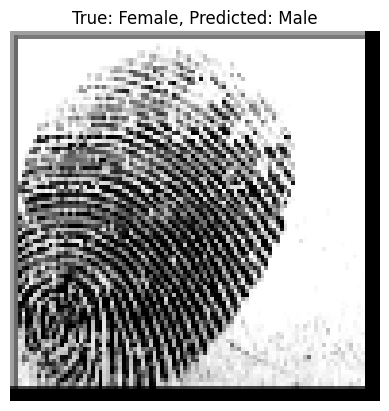

Sample 2139: True: Female, Predicted: Male


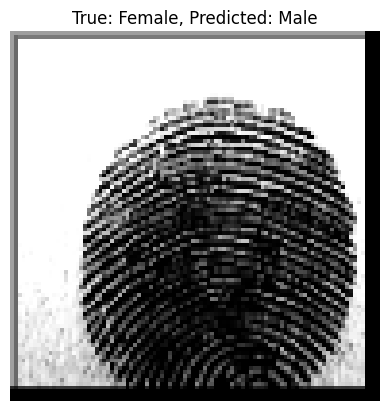

Sample 2201: True: Female, Predicted: Male


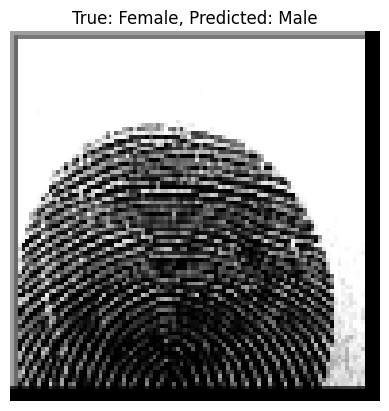

Sample 2216: True: Female, Predicted: Male


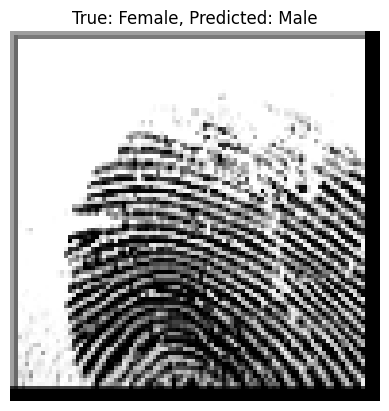

Sample 2217: True: Female, Predicted: Male


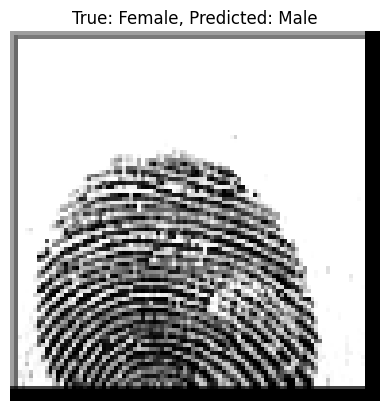

Sample 2218: True: Female, Predicted: Male


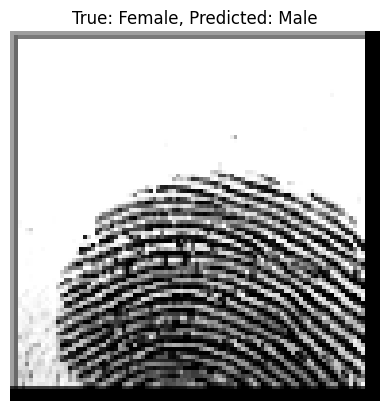

Sample 2219: True: Female, Predicted: Male


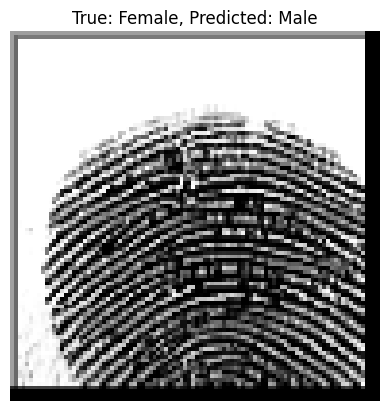

Sample 2232: True: Female, Predicted: Male


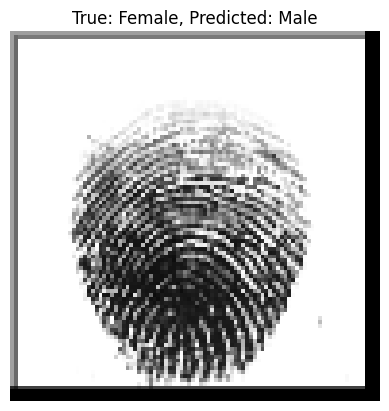

Sample 2233: True: Female, Predicted: Male


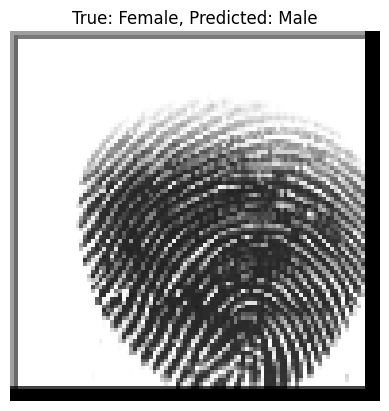

Sample 2234: True: Female, Predicted: Male


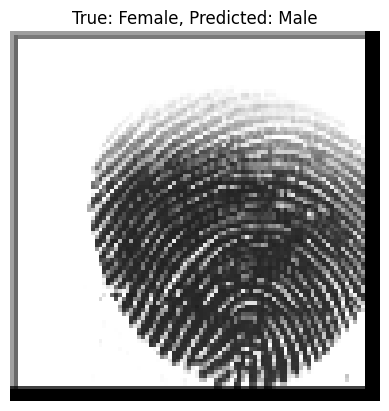

Sample 2236: True: Female, Predicted: Male


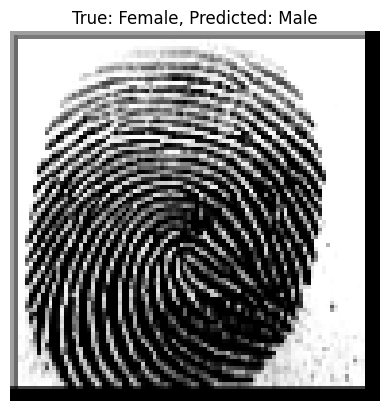

Sample 2253: True: Female, Predicted: Male


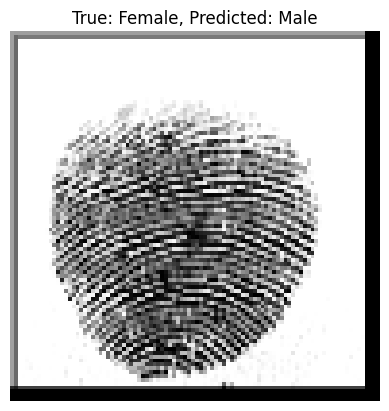

Sample 2257: True: Female, Predicted: Male


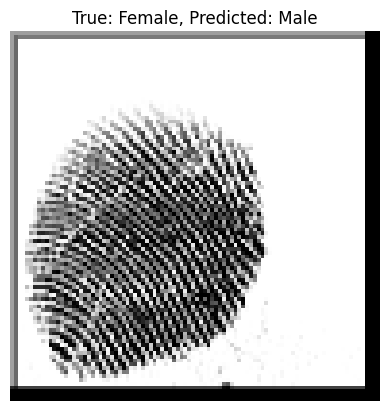

Sample 2258: True: Female, Predicted: Male


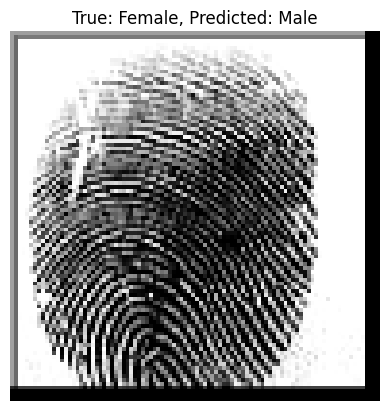

Sample 2278: True: Male, Predicted: Female


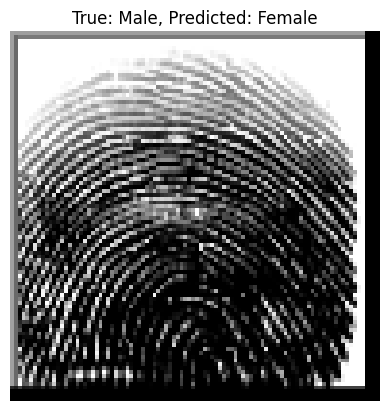

Sample 2321: True: Female, Predicted: Male


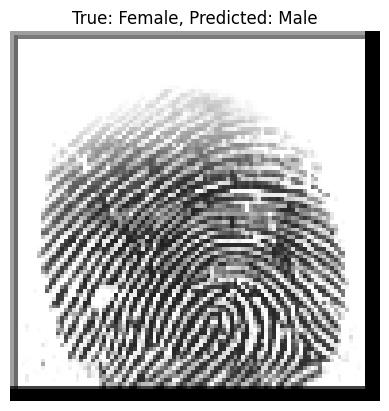

Sample 2322: True: Female, Predicted: Male


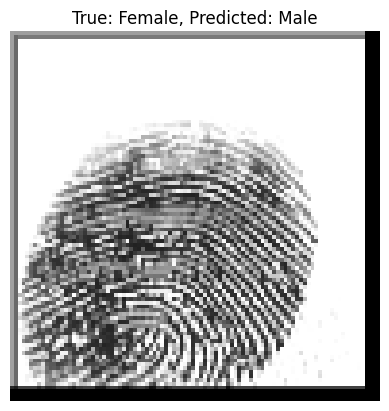

Sample 2323: True: Female, Predicted: Male


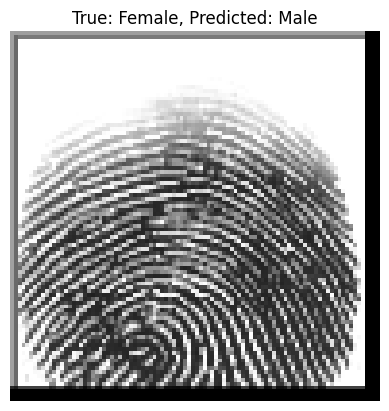

Sample 2324: True: Female, Predicted: Male


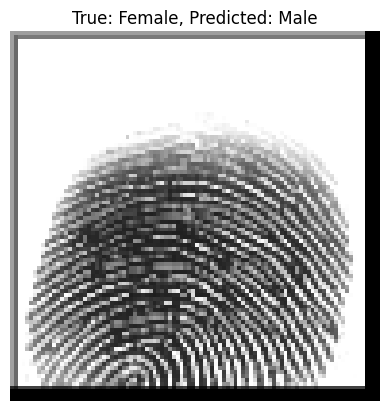

Sample 2327: True: Female, Predicted: Male


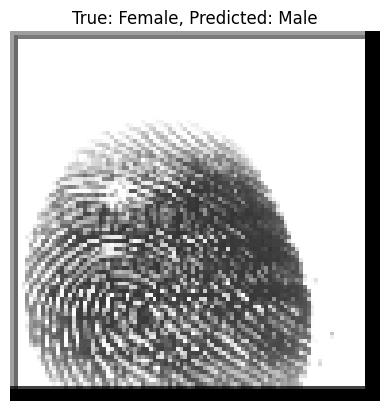

Sample 2328: True: Female, Predicted: Male


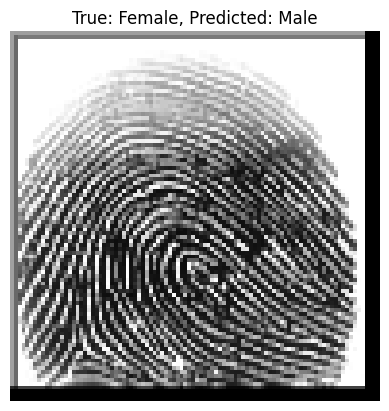

Sample 2329: True: Female, Predicted: Male


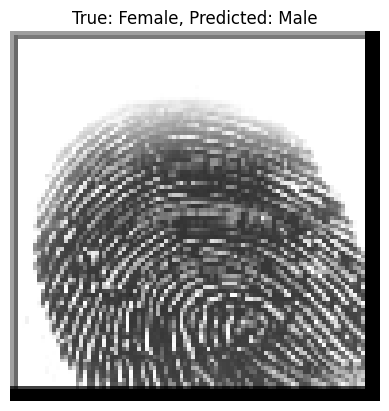

Sample 2366: True: Male, Predicted: Female


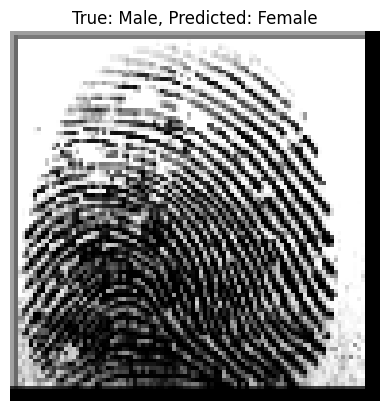

Sample 2381: True: Female, Predicted: Male


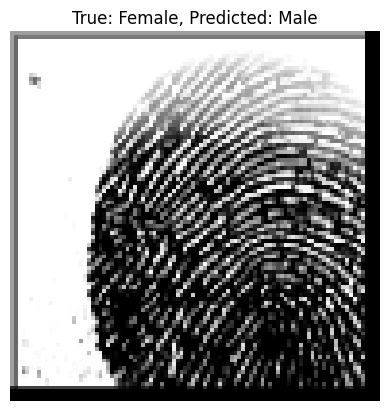

Sample 2388: True: Female, Predicted: Male


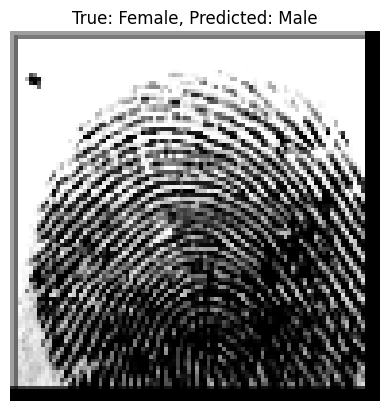

Sample 2412: True: Female, Predicted: Male


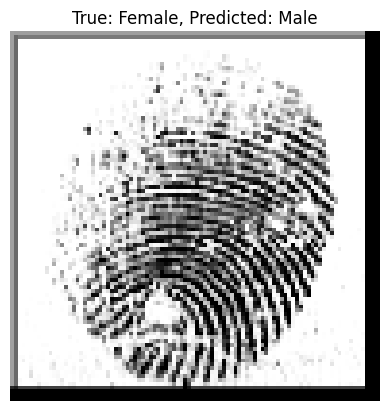

Sample 2413: True: Female, Predicted: Male


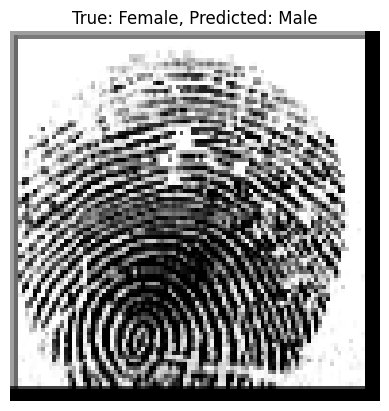

Sample 2414: True: Female, Predicted: Male


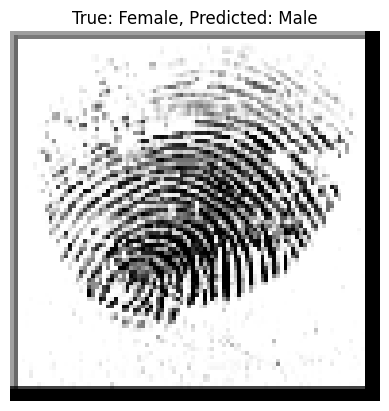

Sample 2416: True: Female, Predicted: Male


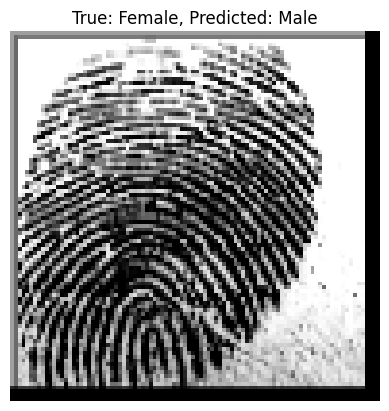

Sample 2418: True: Female, Predicted: Male


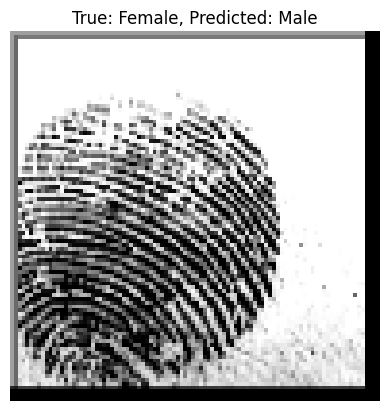

Sample 2436: True: Female, Predicted: Male


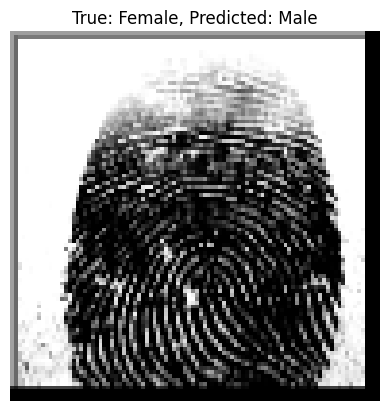

Sample 2437: True: Female, Predicted: Male


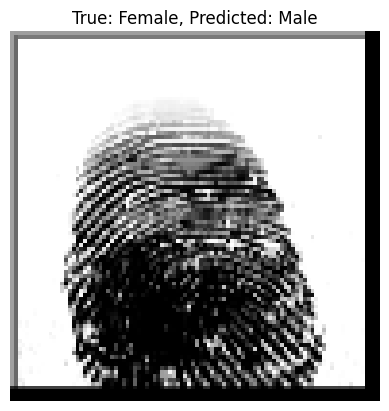

Sample 2515: True: Male, Predicted: Female


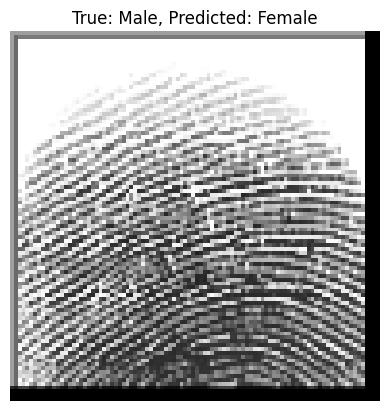

Sample 2525: True: Male, Predicted: Female


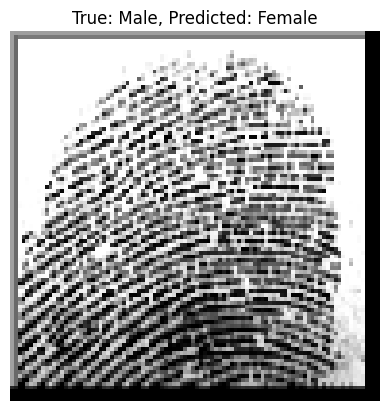

Sample 2563: True: Male, Predicted: Female


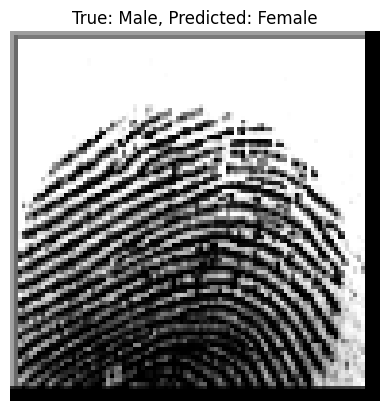

Sample 2586: True: Male, Predicted: Female


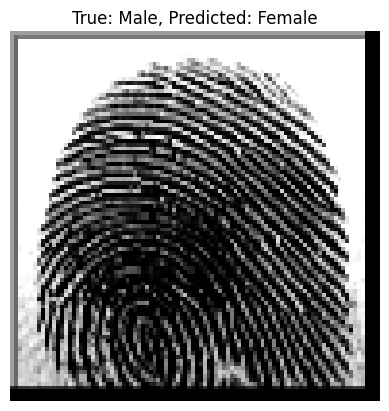

Sample 2597: True: Female, Predicted: Male


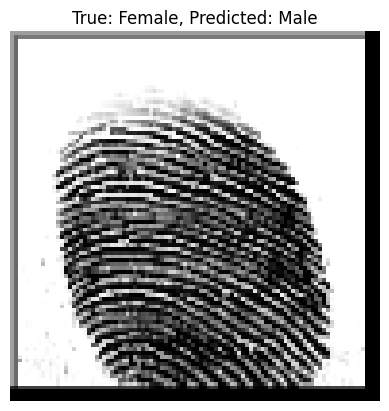

Sample 2598: True: Female, Predicted: Male


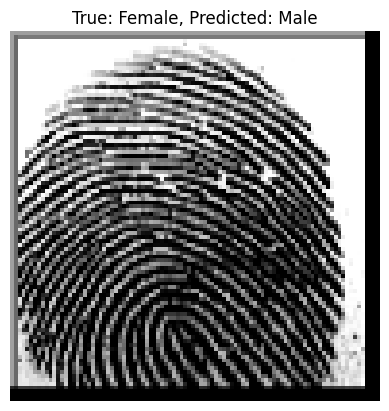

Sample 2599: True: Female, Predicted: Male


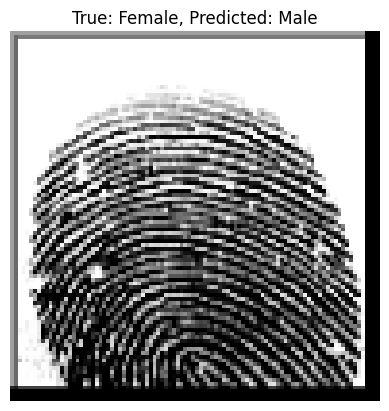

Sample 2621: True: Female, Predicted: Male


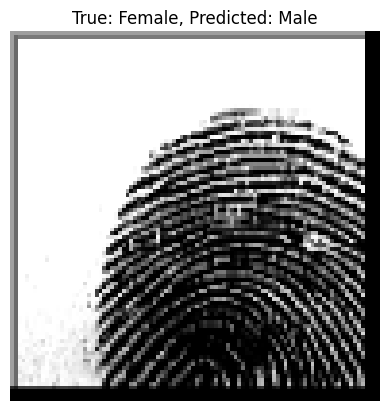

Sample 2622: True: Female, Predicted: Male


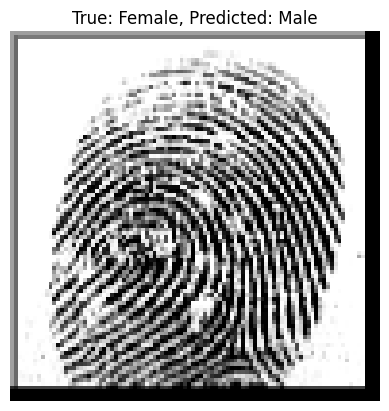

Sample 2624: True: Female, Predicted: Male


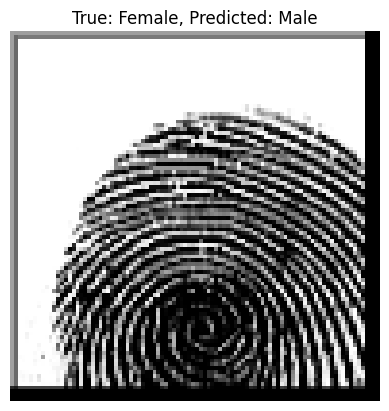

Sample 2628: True: Female, Predicted: Male


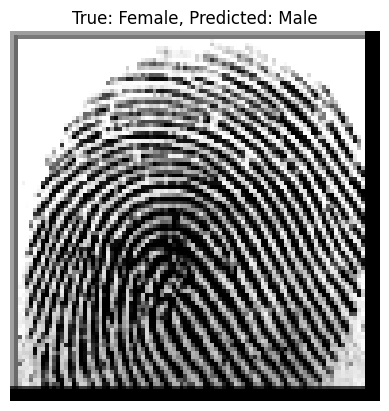

Sample 2745: True: Female, Predicted: Male


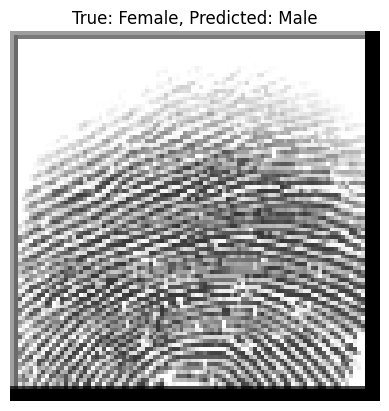

Sample 2748: True: Female, Predicted: Male


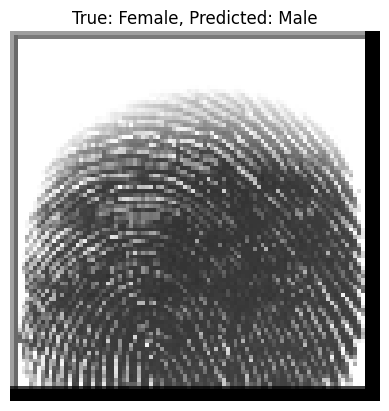

Sample 2749: True: Female, Predicted: Male


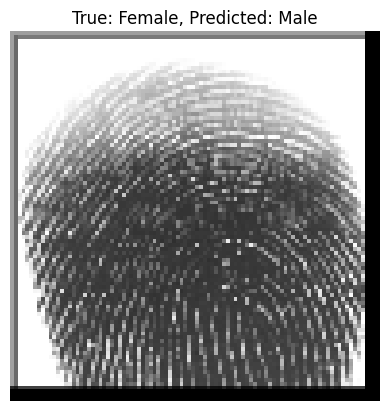

Sample 2780: True: Male, Predicted: Female


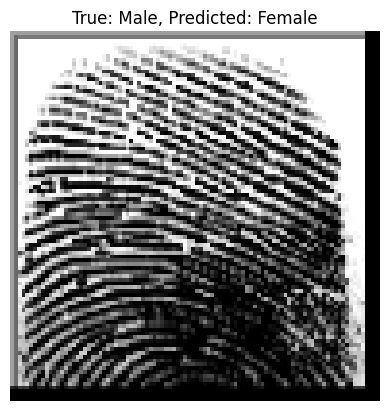

Sample 2843: True: Male, Predicted: Female


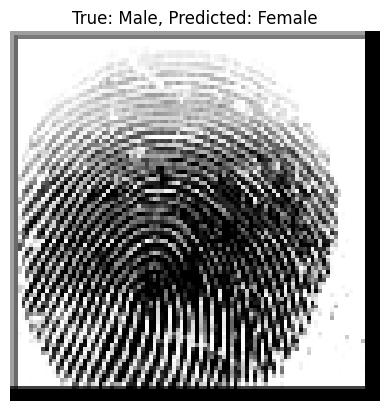

Sample 2901: True: Male, Predicted: Female


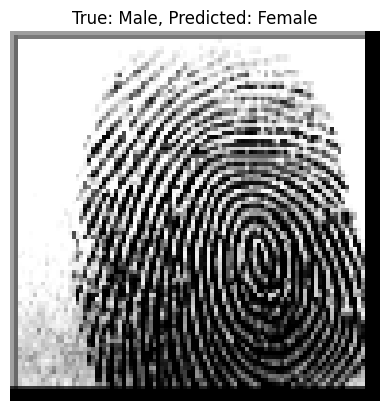

Sample 2910: True: Male, Predicted: Female


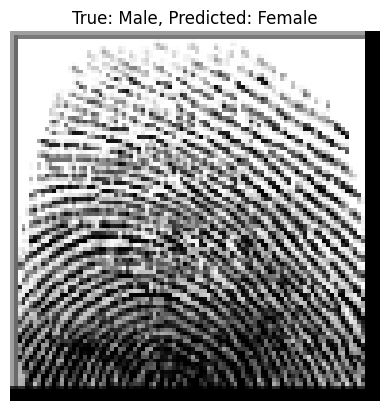

Sample 2912: True: Male, Predicted: Female


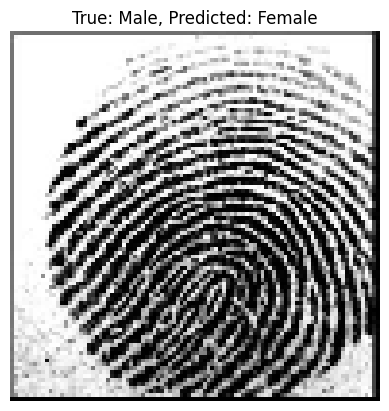

Sample 2955: True: Male, Predicted: Female


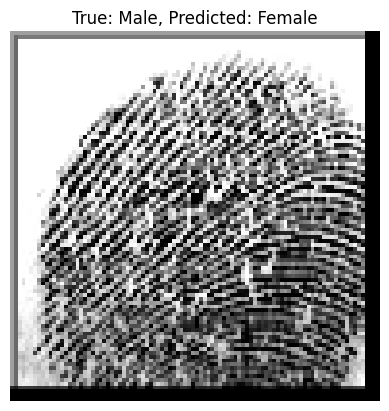

Sample 2972: True: Female, Predicted: Male


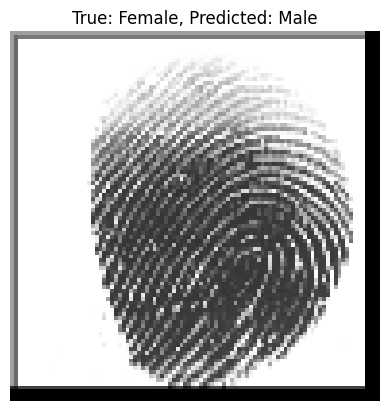

Sample 2975: True: Female, Predicted: Male


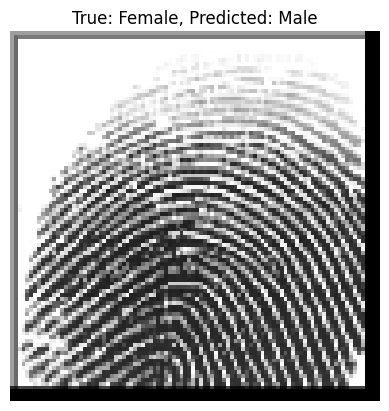

Sample 2977: True: Female, Predicted: Male


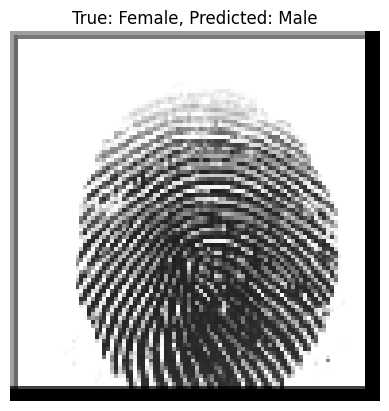

Sample 2979: True: Female, Predicted: Male


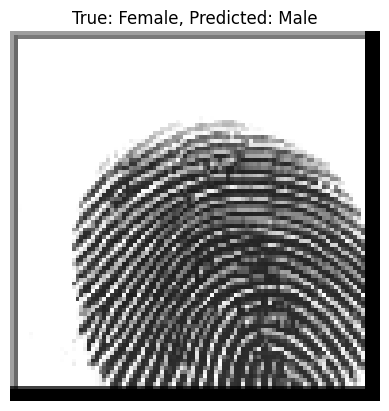

Sample 3054: True: Female, Predicted: Male


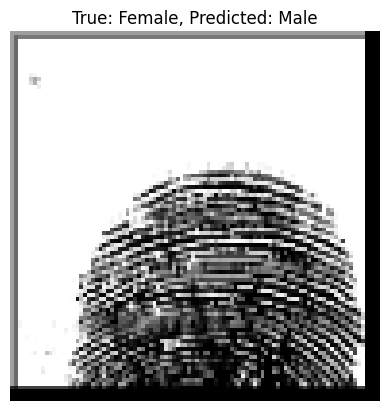

Sample 3057: True: Female, Predicted: Male


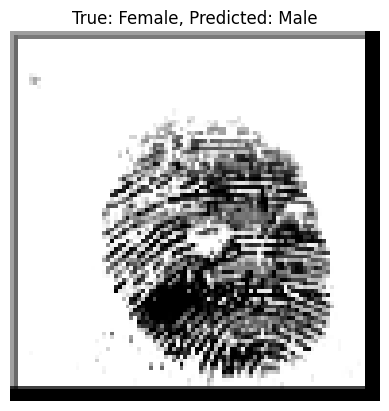

Sample 3074: True: Female, Predicted: Male


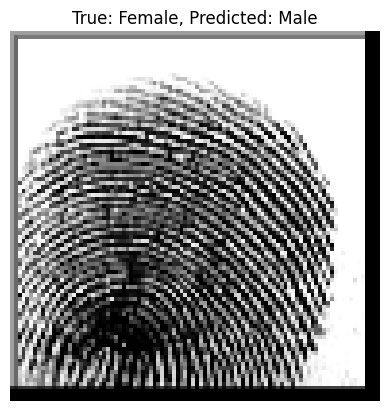

Sample 3075: True: Female, Predicted: Male


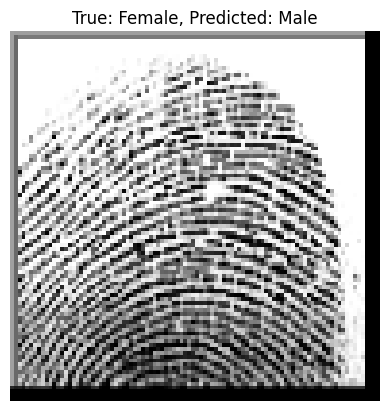

Sample 3076: True: Female, Predicted: Male


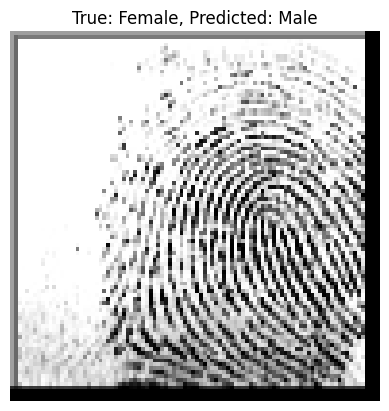

Sample 3081: True: Female, Predicted: Male


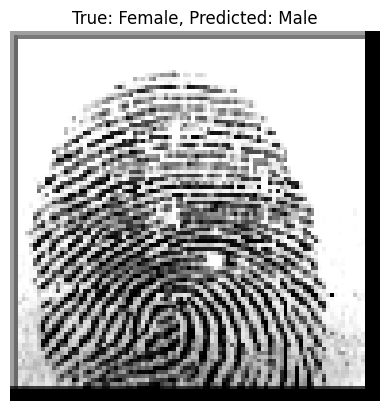

Sample 3082: True: Female, Predicted: Male


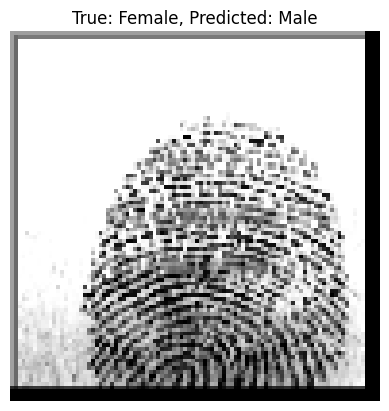

Sample 3083: True: Female, Predicted: Male


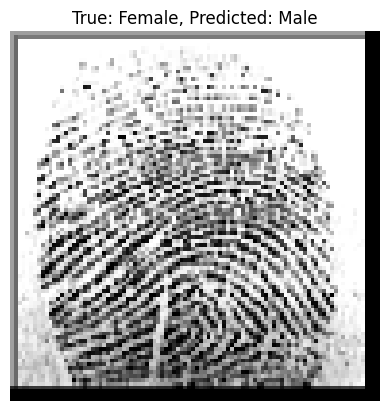

Sample 3085: True: Female, Predicted: Male


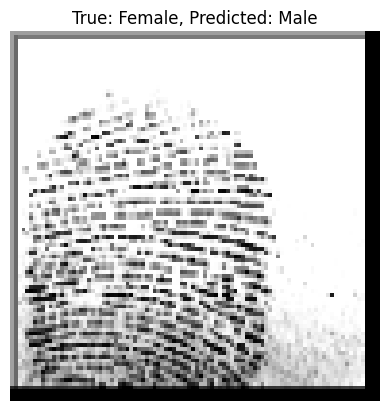

Sample 3087: True: Female, Predicted: Male


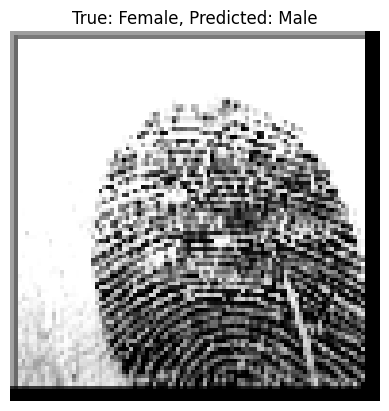

Sample 3089: True: Female, Predicted: Male


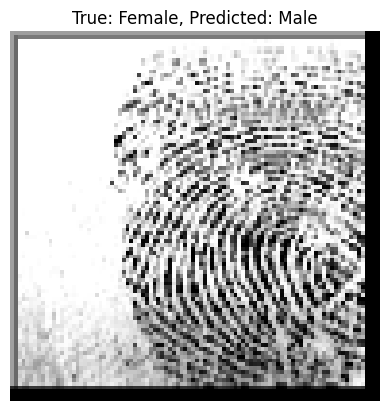

Sample 3096: True: Male, Predicted: Female


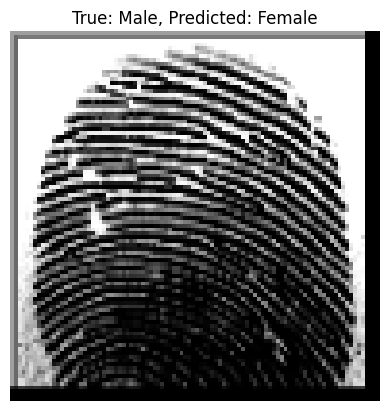

Sample 3117: True: Male, Predicted: Female


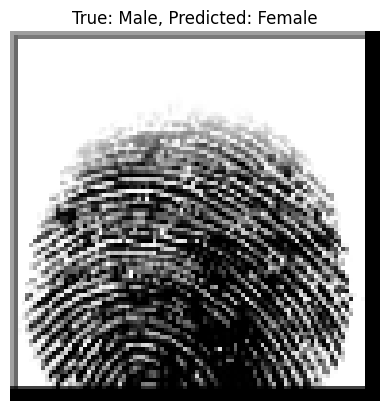

Sample 3146: True: Female, Predicted: Male


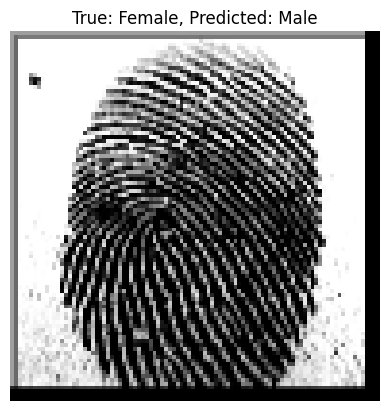

Sample 3173: True: Female, Predicted: Male


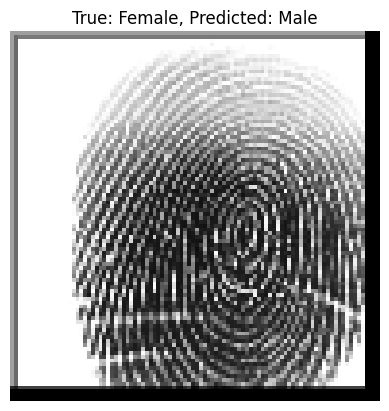

Sample 3174: True: Female, Predicted: Male


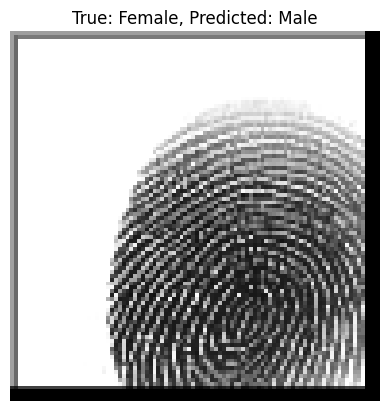

Sample 3185: True: Female, Predicted: Male


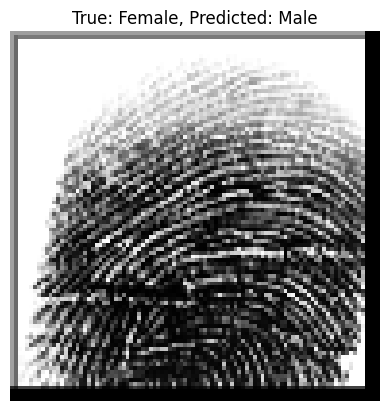

Sample 3190: True: Female, Predicted: Male


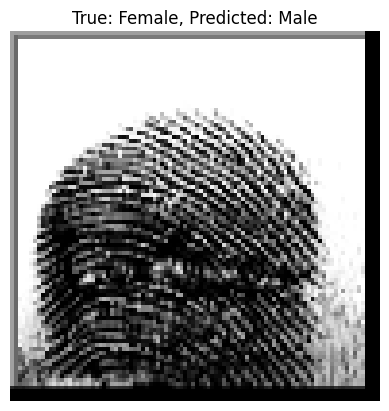

Sample 3211: True: Female, Predicted: Male


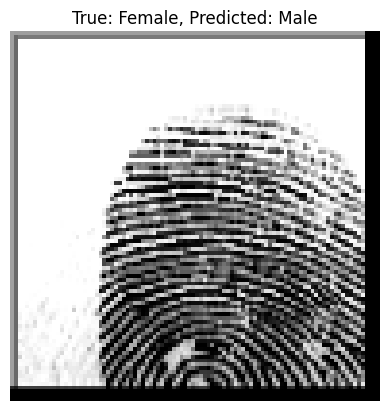

Sample 3215: True: Female, Predicted: Male


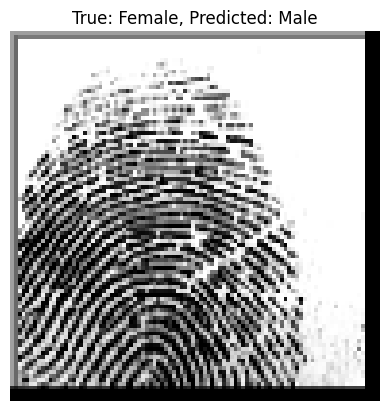

Sample 3217: True: Female, Predicted: Male


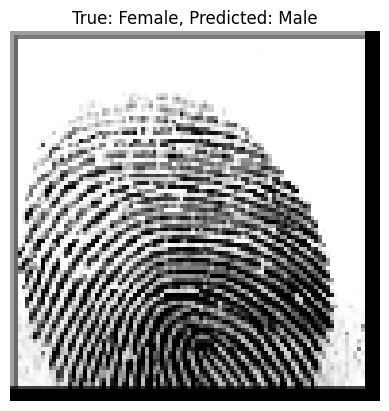

Sample 3219: True: Female, Predicted: Male


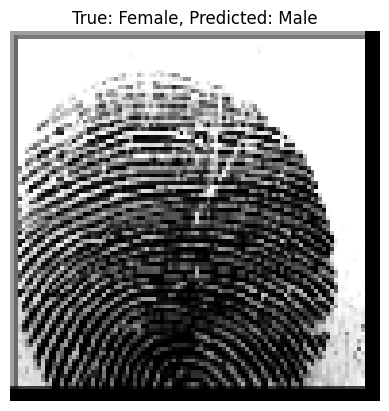

Sample 3222: True: Male, Predicted: Female


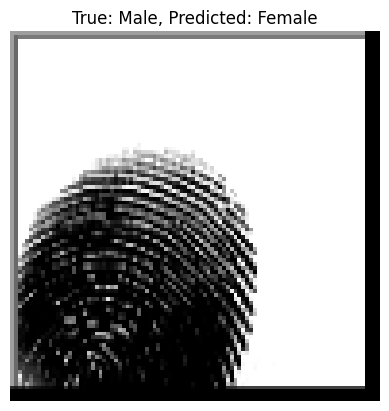

Sample 3226: True: Male, Predicted: Female


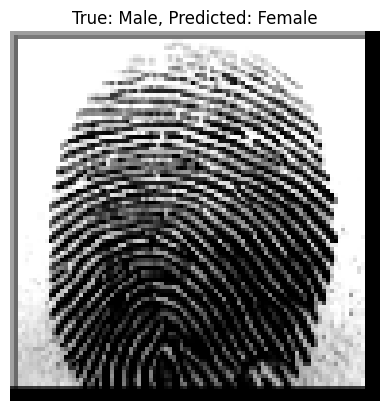

Sample 3227: True: Male, Predicted: Female


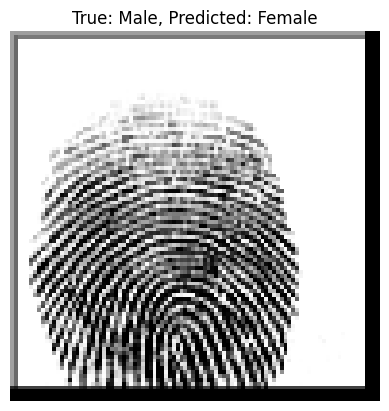

Sample 3342: True: Male, Predicted: Female


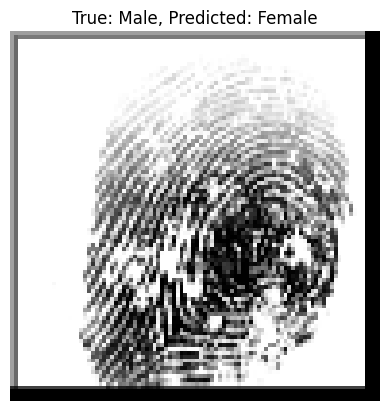

Sample 3425: True: Male, Predicted: Female


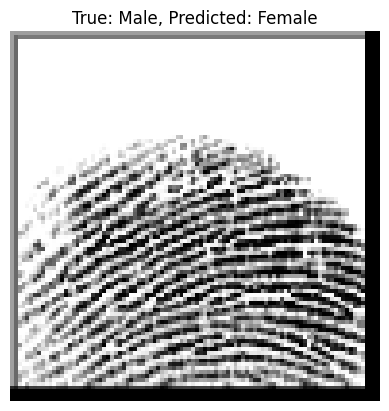

Sample 3434: True: Female, Predicted: Male


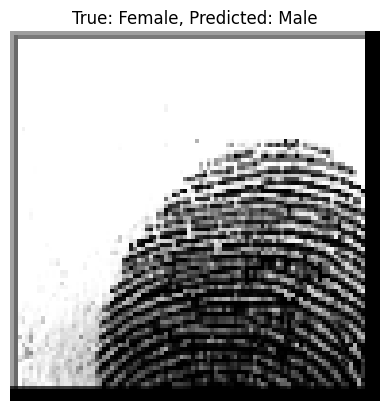

Sample 3437: True: Female, Predicted: Male


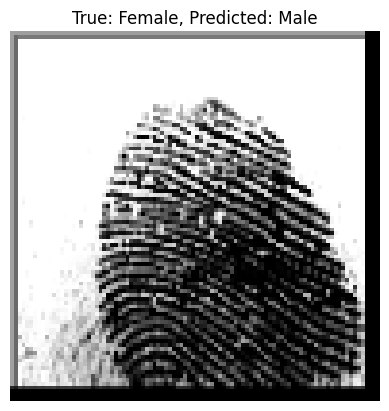

Sample 3439: True: Female, Predicted: Male


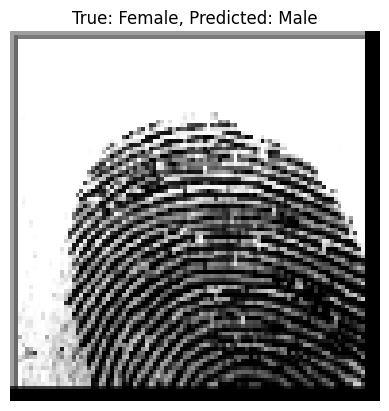

Sample 3446: True: Male, Predicted: Female


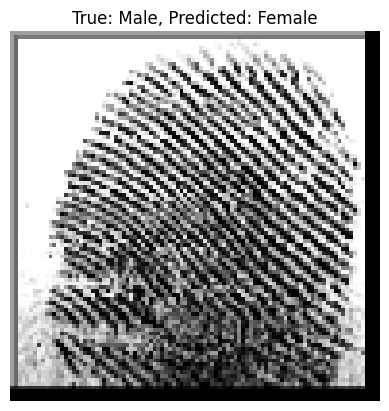

Sample 3486: True: Male, Predicted: Female


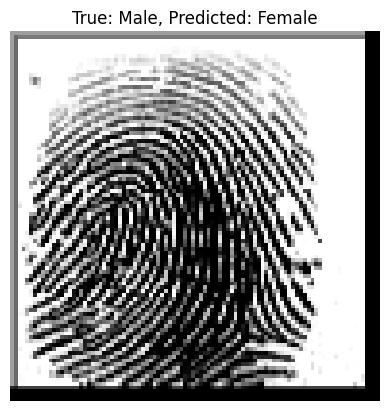

Sample 3516: True: Male, Predicted: Female


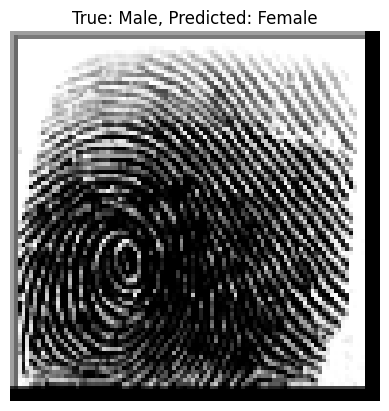

Sample 3517: True: Male, Predicted: Female


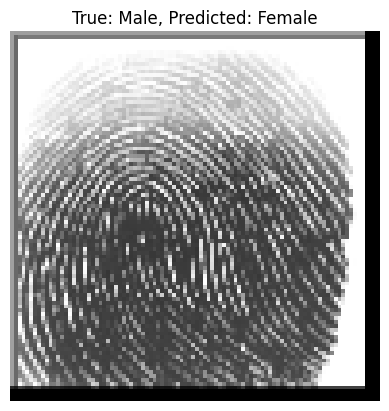

Sample 3520: True: Male, Predicted: Female


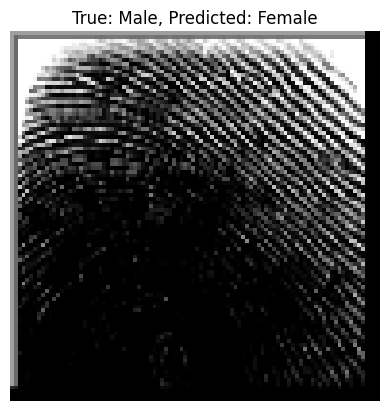

Sample 3523: True: Female, Predicted: Male


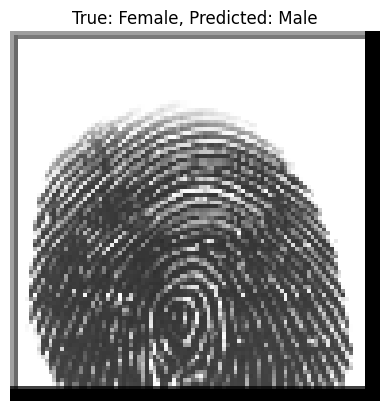

Sample 3524: True: Female, Predicted: Male


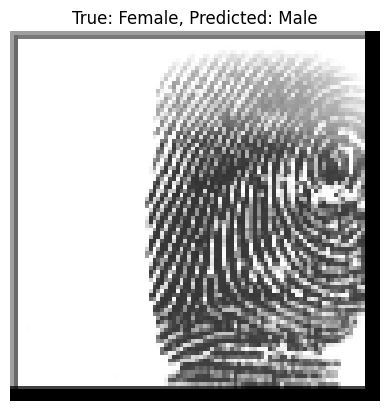

Sample 3525: True: Female, Predicted: Male


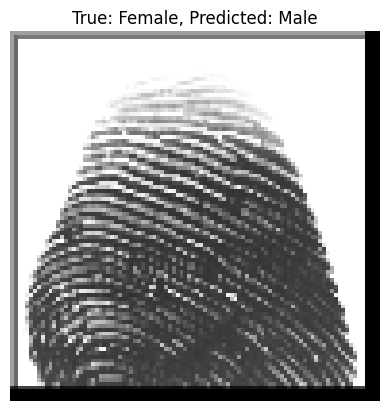

Sample 3527: True: Female, Predicted: Male


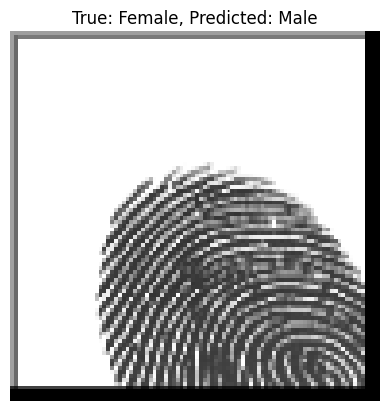

Sample 3529: True: Female, Predicted: Male


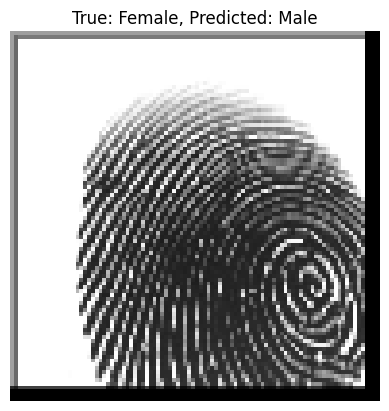

Sample 3531: True: Female, Predicted: Male


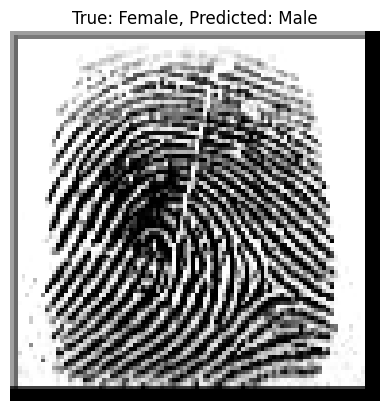

Sample 3533: True: Female, Predicted: Male


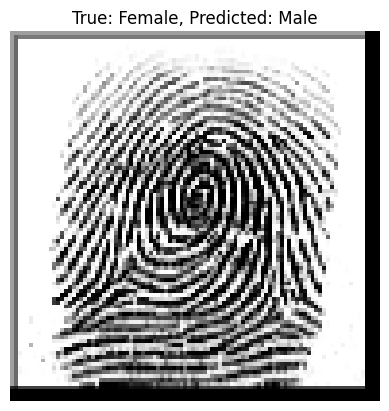

Sample 3537: True: Female, Predicted: Male


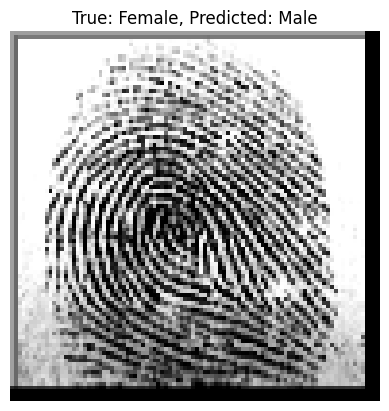

Sample 3563: True: Female, Predicted: Male


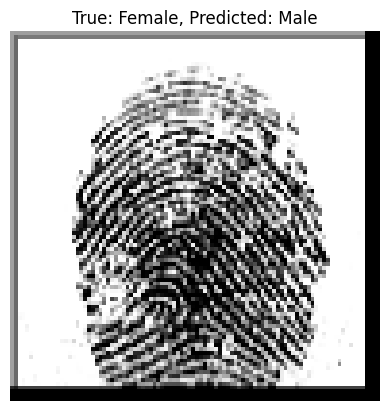

Sample 3568: True: Female, Predicted: Male


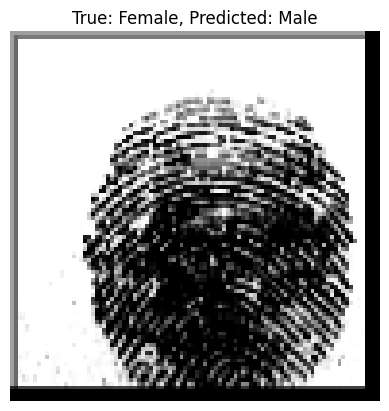

Sample 3569: True: Female, Predicted: Male


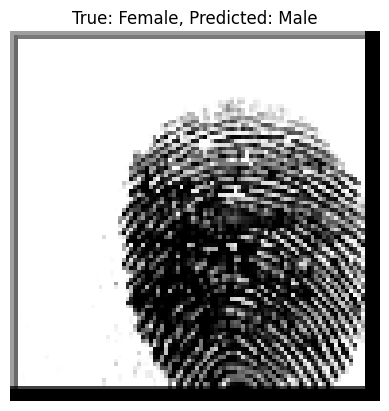

Sample 3657: True: Female, Predicted: Male


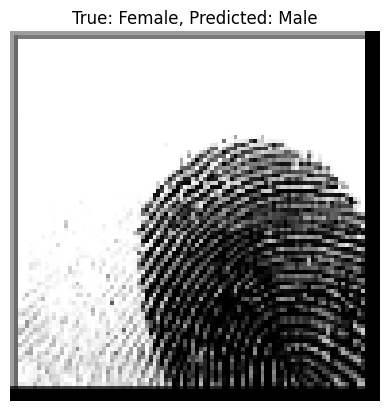

Sample 3658: True: Female, Predicted: Male


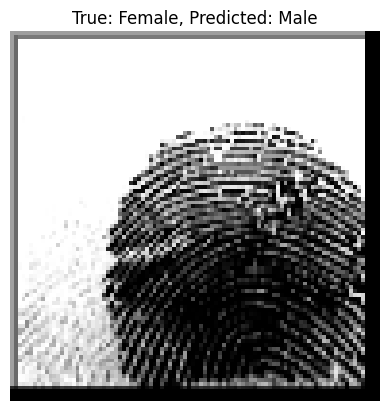

Sample 3663: True: Female, Predicted: Male


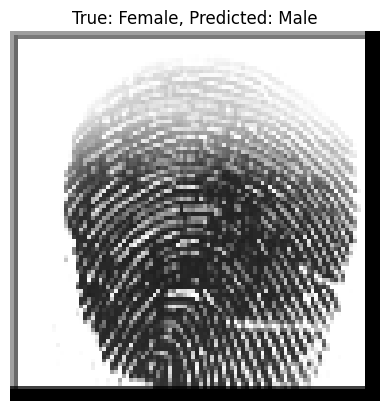

Sample 3664: True: Female, Predicted: Male


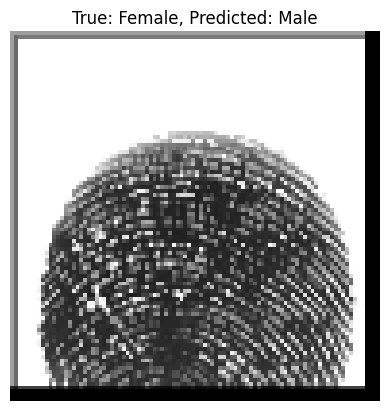

Sample 3713: True: Female, Predicted: Male


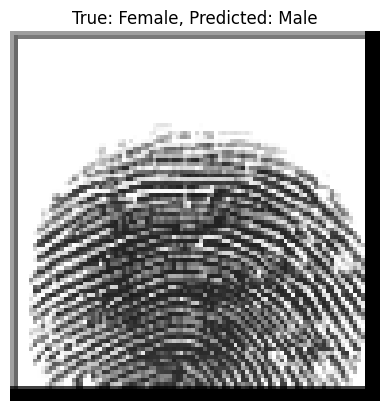

Sample 3714: True: Female, Predicted: Male


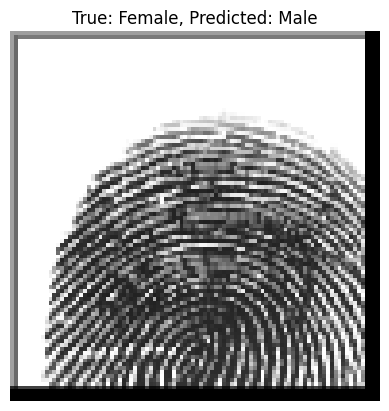

Sample 3716: True: Female, Predicted: Male


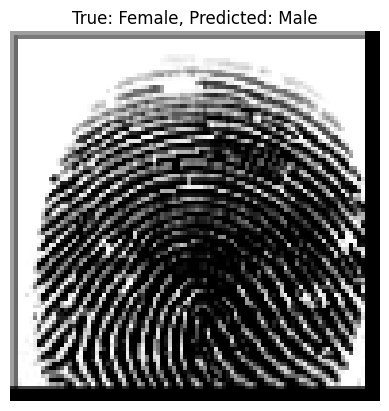

Sample 3718: True: Female, Predicted: Male


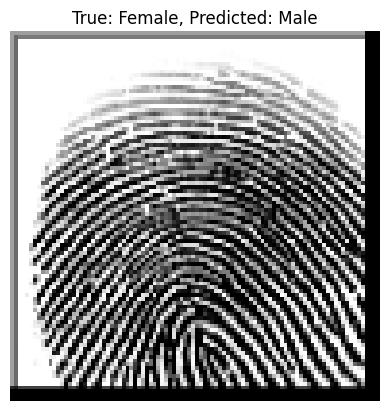

Sample 3752: True: Male, Predicted: Female


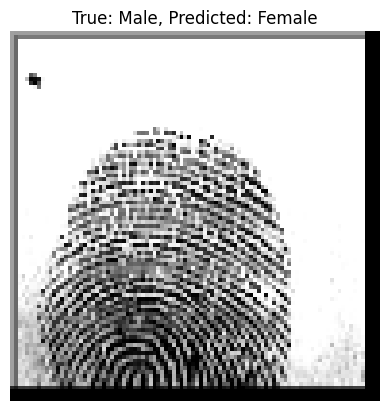

Sample 3755: True: Male, Predicted: Female


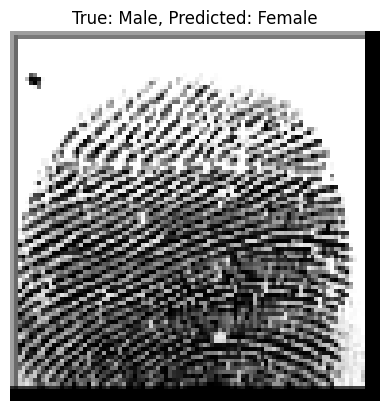

Sample 3761: True: Female, Predicted: Male


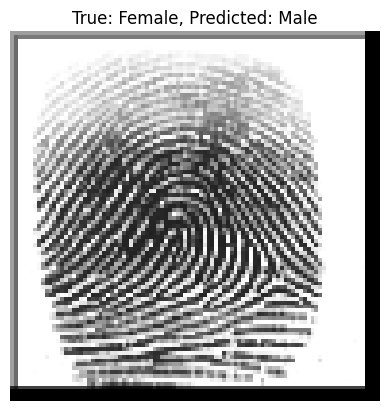

Sample 3763: True: Female, Predicted: Male


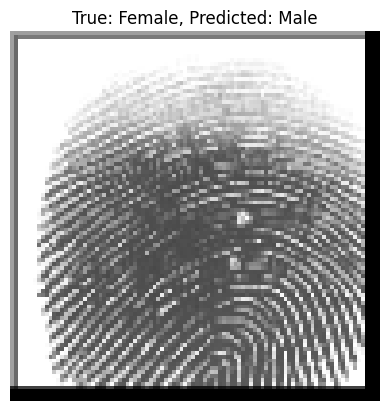

Sample 3764: True: Female, Predicted: Male


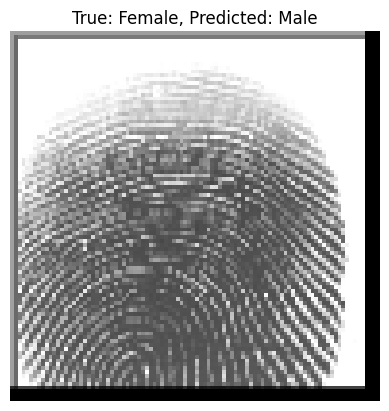

Sample 3769: True: Female, Predicted: Male


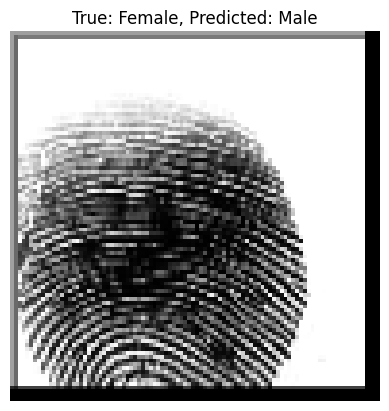

Sample 3791: True: Female, Predicted: Male


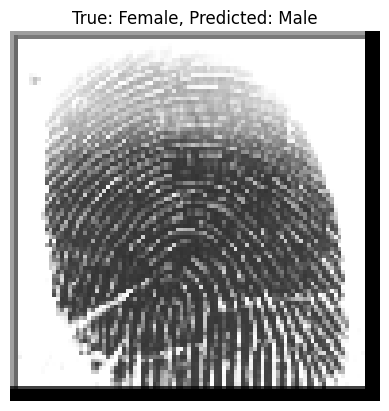

Sample 3792: True: Female, Predicted: Male


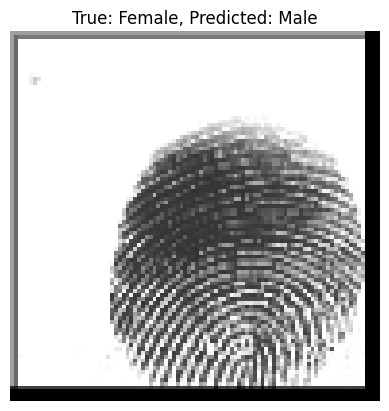

Sample 3793: True: Female, Predicted: Male


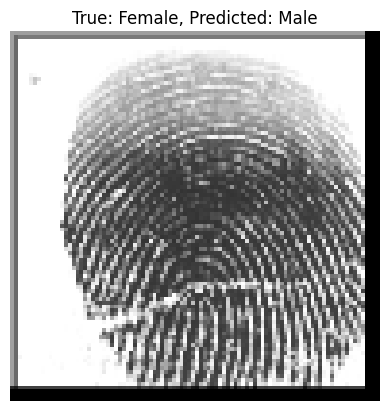

Sample 3794: True: Female, Predicted: Male


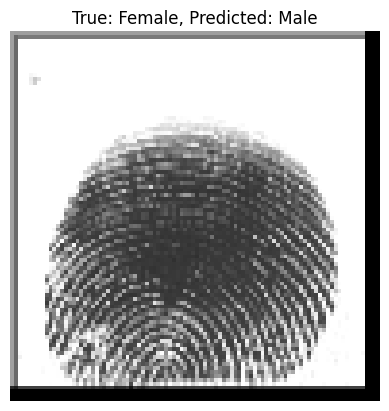

Sample 3795: True: Female, Predicted: Male


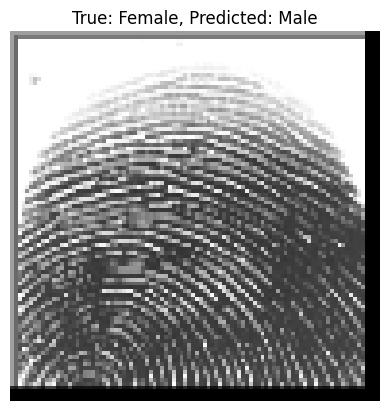

Sample 3798: True: Female, Predicted: Male


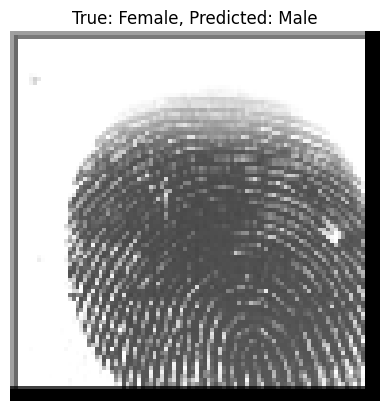

Sample 3799: True: Female, Predicted: Male


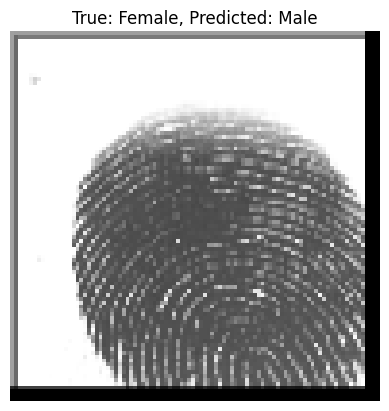

Sample 3826: True: Male, Predicted: Female


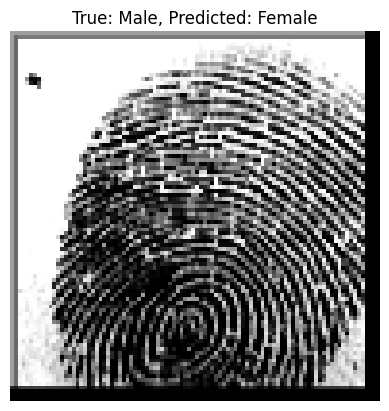

Sample 3865: True: Female, Predicted: Male


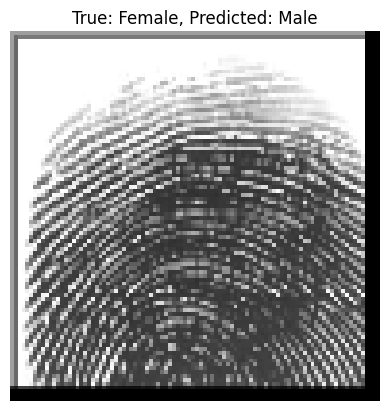

Sample 3881: True: Male, Predicted: Female


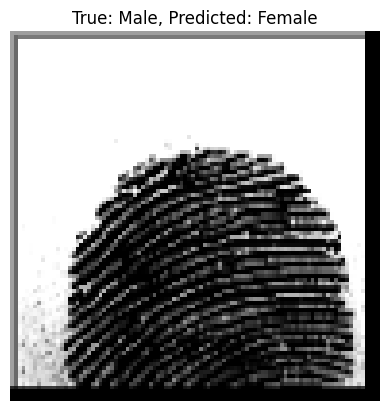

Sample 3893: True: Male, Predicted: Female


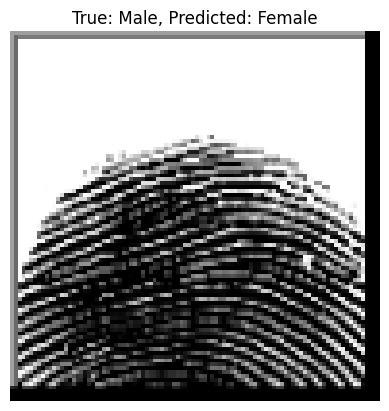

Sample 3903: True: Female, Predicted: Male


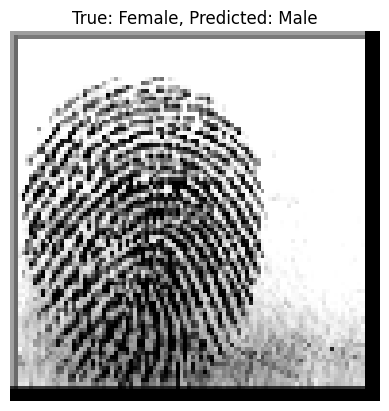

Sample 3909: True: Female, Predicted: Male


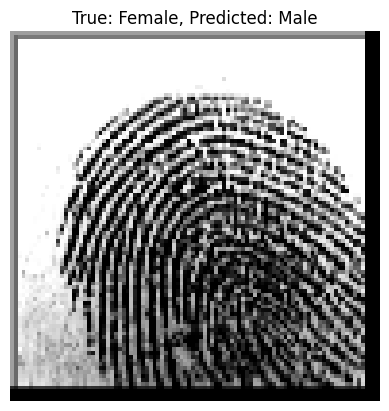

Sample 3913: True: Female, Predicted: Male


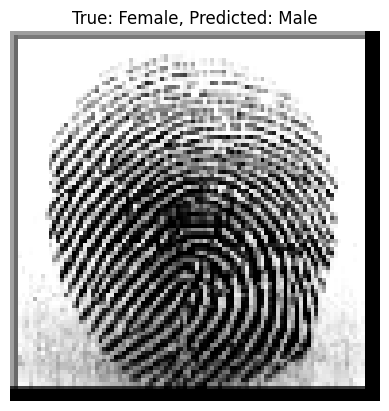

Sample 3916: True: Female, Predicted: Male


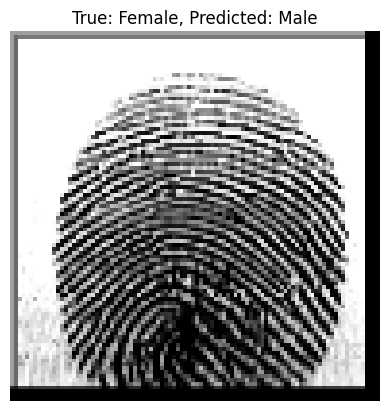

Sample 3918: True: Female, Predicted: Male


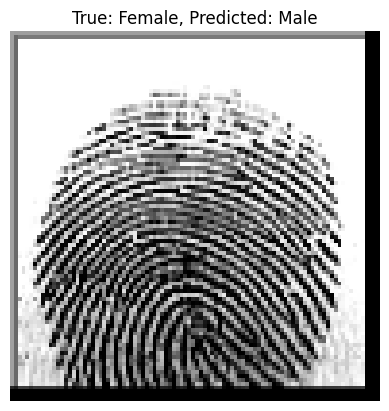

Sample 3919: True: Female, Predicted: Male


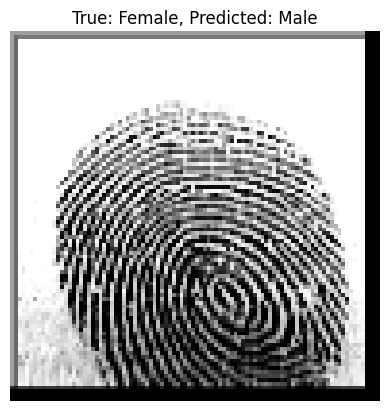

Sample 3927: True: Male, Predicted: Female


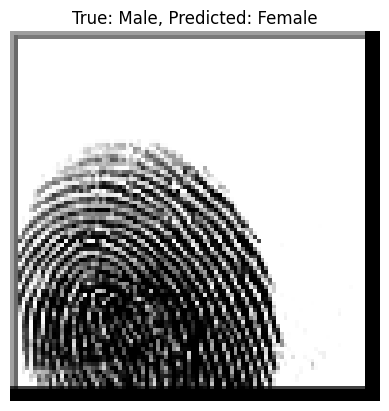

Sample 3974: True: Male, Predicted: Female


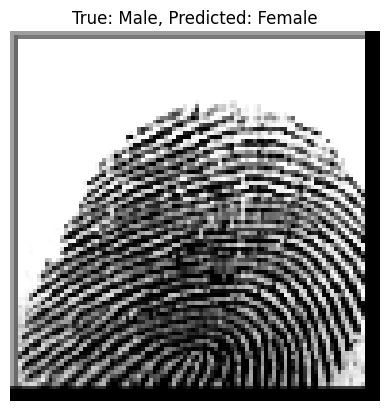

Sample 3996: True: Male, Predicted: Female


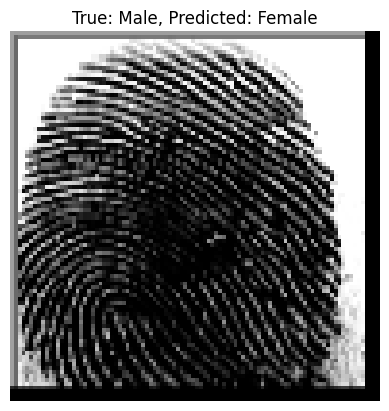

Sample 4008: True: Female, Predicted: Male


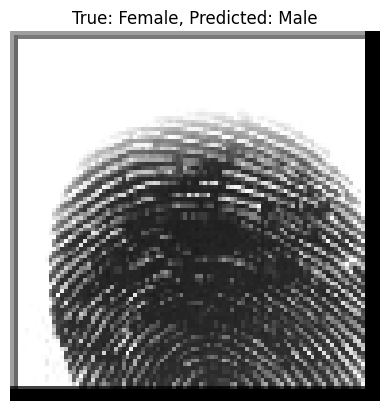

Sample 4023: True: Female, Predicted: Male


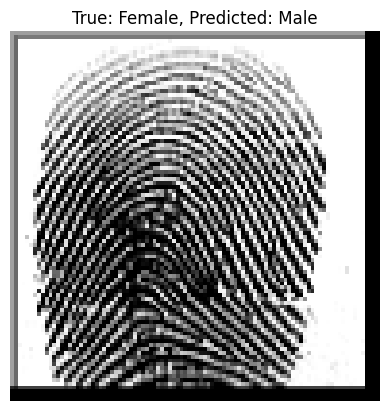

Sample 4029: True: Female, Predicted: Male


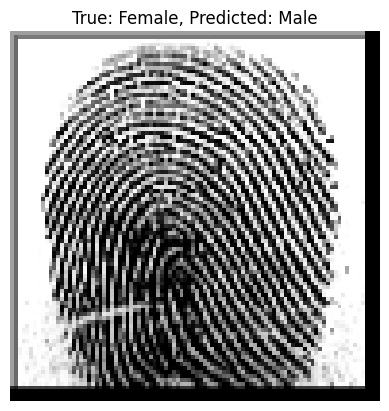

Sample 4045: True: Female, Predicted: Male


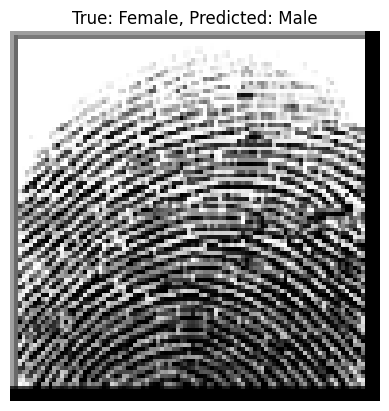

Sample 4048: True: Female, Predicted: Male


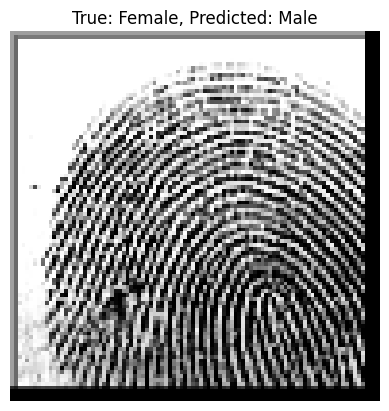

Sample 4058: True: Female, Predicted: Male


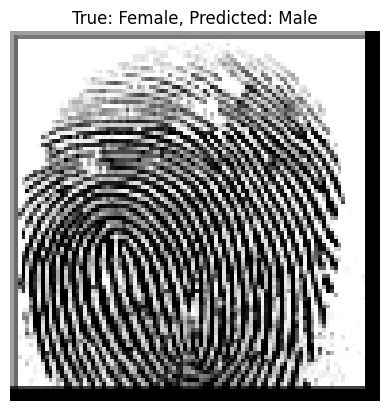

Sample 4066: True: Male, Predicted: Female


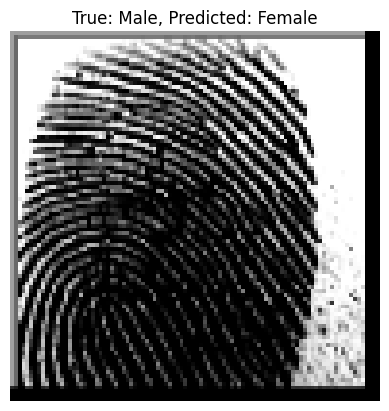

Sample 4075: True: Female, Predicted: Male


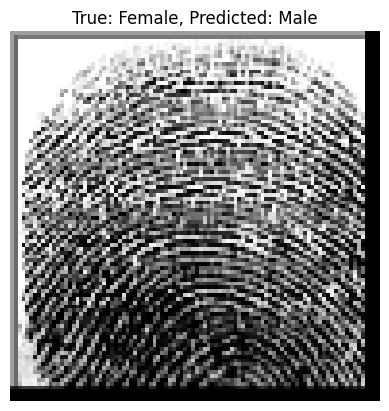

Sample 4079: True: Female, Predicted: Male


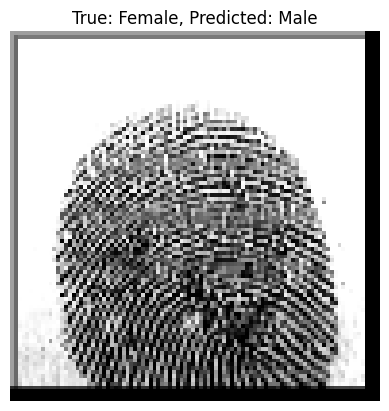

Sample 4104: True: Female, Predicted: Male


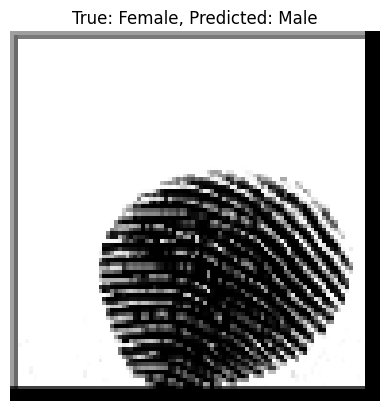

Sample 4107: True: Female, Predicted: Male


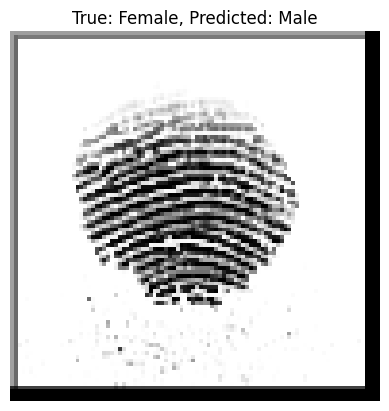

Sample 4109: True: Female, Predicted: Male


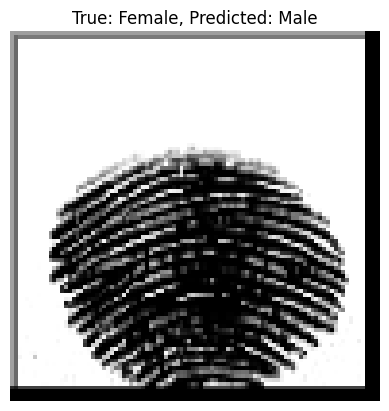

Sample 4196: True: Female, Predicted: Male


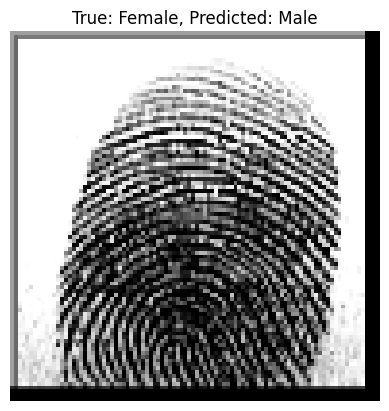

Sample 4198: True: Female, Predicted: Male


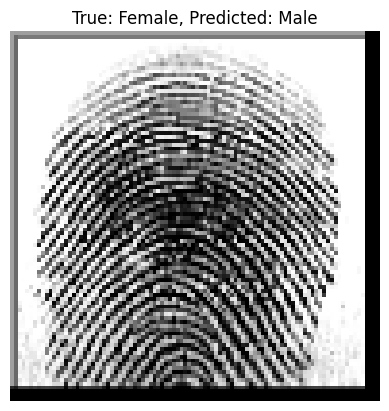

Sample 4199: True: Female, Predicted: Male


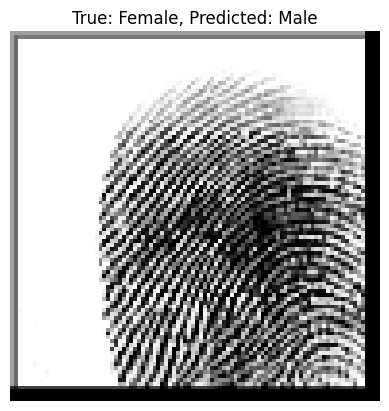

Sample 4202: True: Female, Predicted: Male


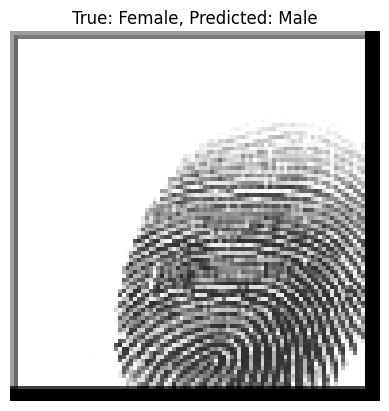

Sample 4203: True: Female, Predicted: Male


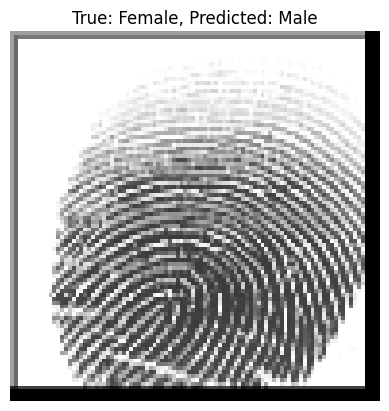

Sample 4207: True: Female, Predicted: Male


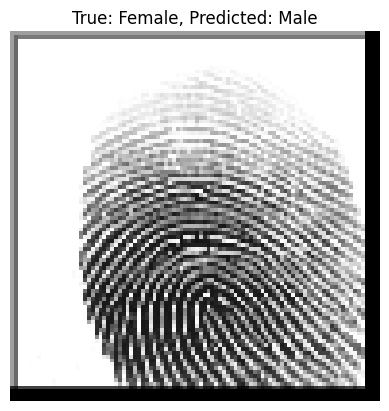

Sample 4208: True: Female, Predicted: Male


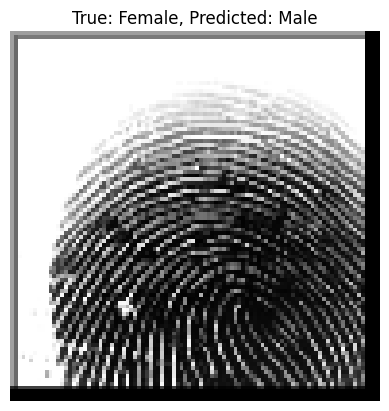

Sample 4222: True: Female, Predicted: Male


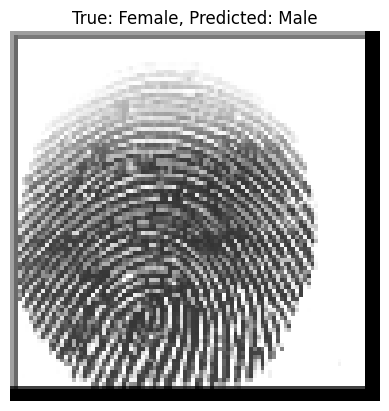

Sample 4223: True: Female, Predicted: Male


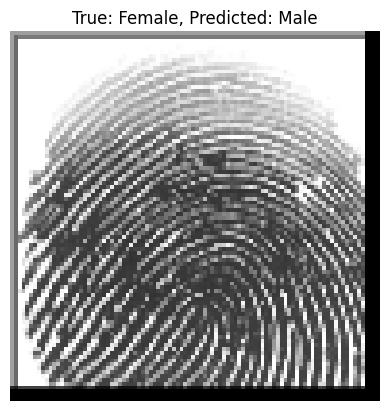

Sample 4224: True: Female, Predicted: Male


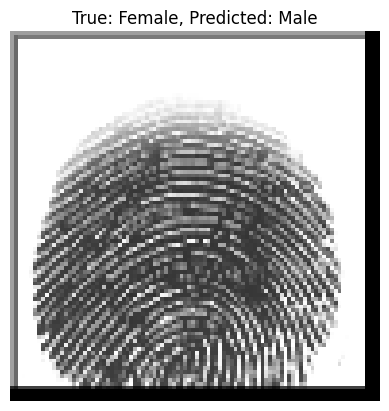

Sample 4227: True: Female, Predicted: Male


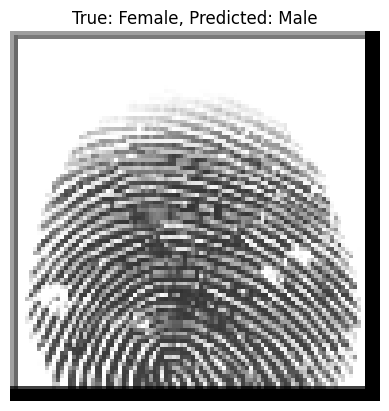

Sample 4229: True: Female, Predicted: Male


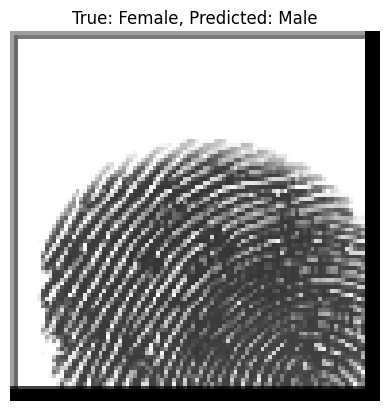

Sample 4313: True: Female, Predicted: Male


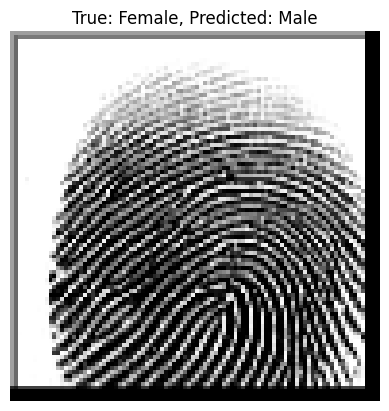

Sample 4316: True: Female, Predicted: Male


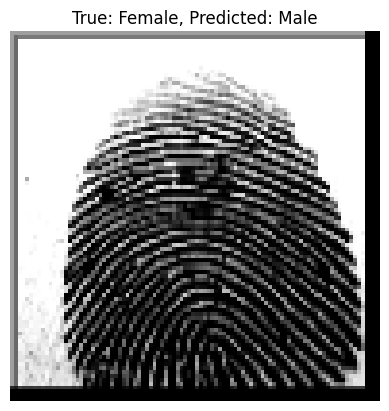

Sample 4318: True: Female, Predicted: Male


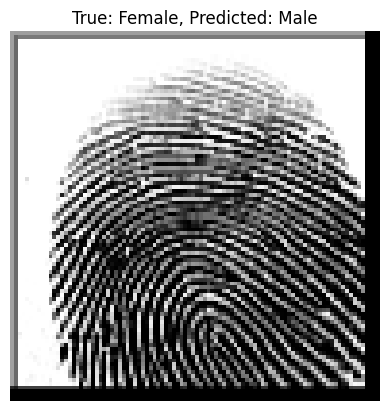

Sample 4320: True: Female, Predicted: Male


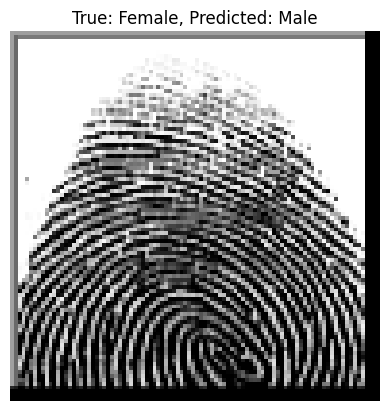

Sample 4336: True: Male, Predicted: Female


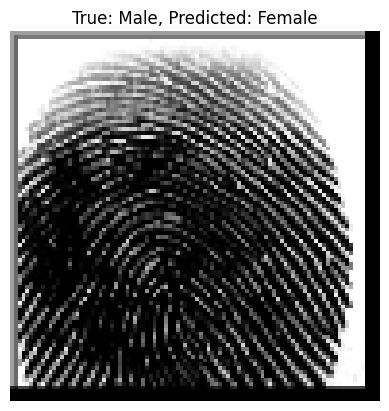

Sample 4341: True: Female, Predicted: Male


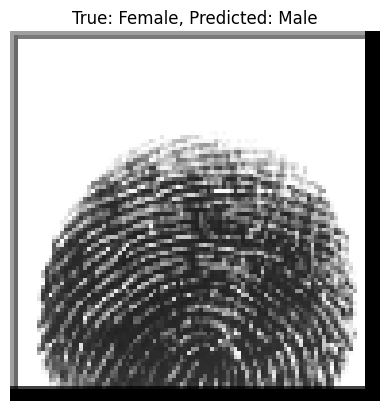

Sample 4343: True: Female, Predicted: Male


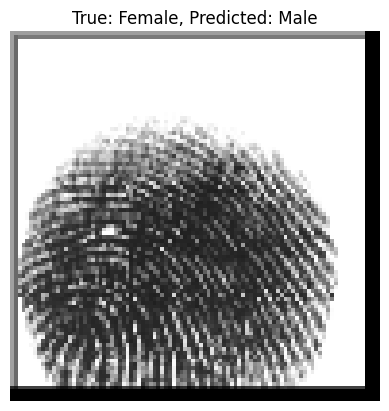

Sample 4345: True: Female, Predicted: Male


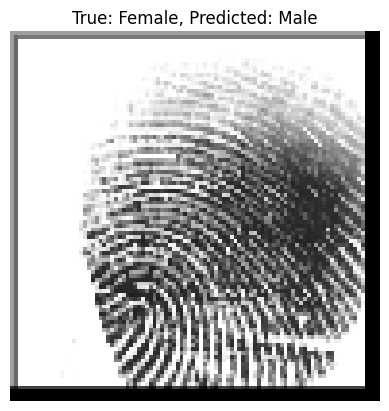

Sample 4348: True: Female, Predicted: Male


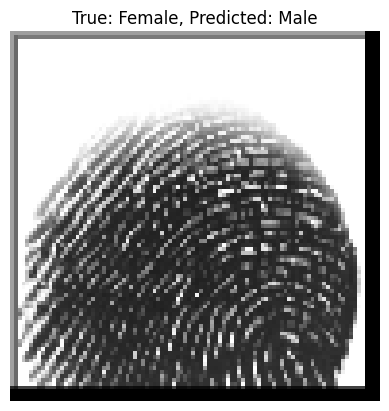

Sample 4355: True: Male, Predicted: Female


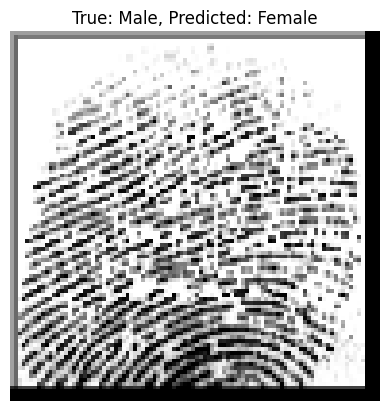

Sample 4361: True: Female, Predicted: Male


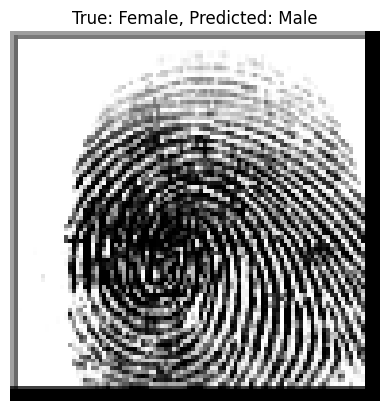

Sample 4362: True: Female, Predicted: Male


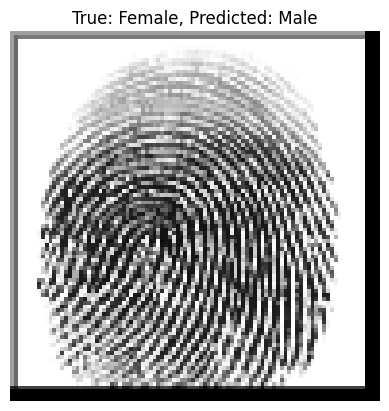

Sample 4363: True: Female, Predicted: Male


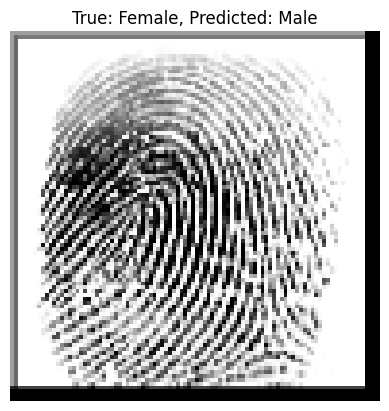

Sample 4366: True: Female, Predicted: Male


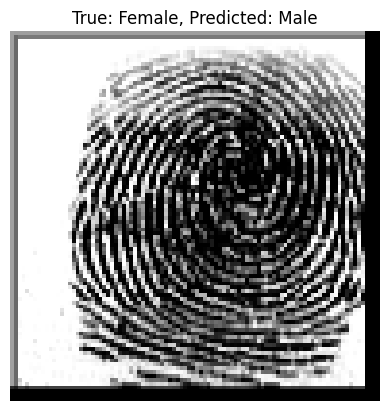

Sample 4367: True: Female, Predicted: Male


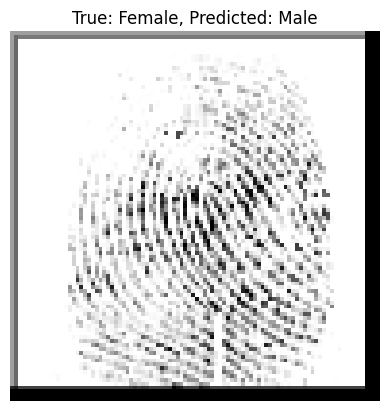

Sample 4442: True: Male, Predicted: Female


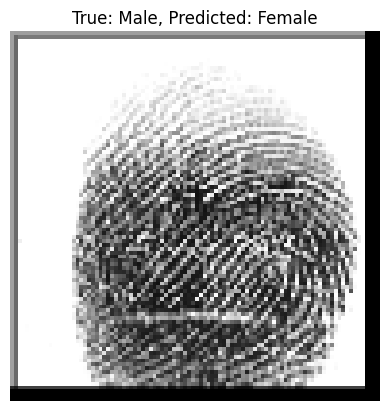

Sample 4443: True: Male, Predicted: Female


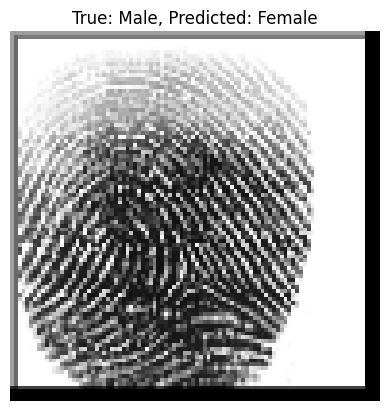

Sample 4521: True: Female, Predicted: Male


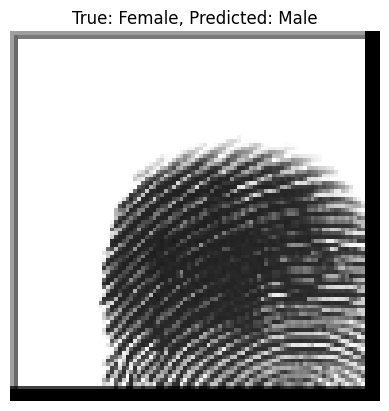

Sample 4522: True: Female, Predicted: Male


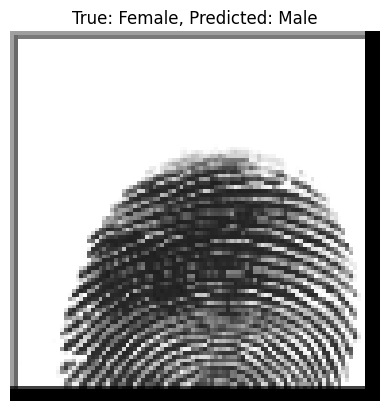

Sample 4525: True: Female, Predicted: Male


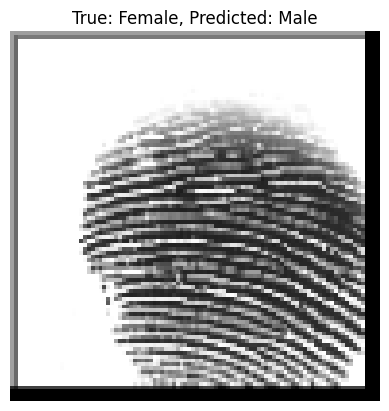

Sample 4526: True: Female, Predicted: Male


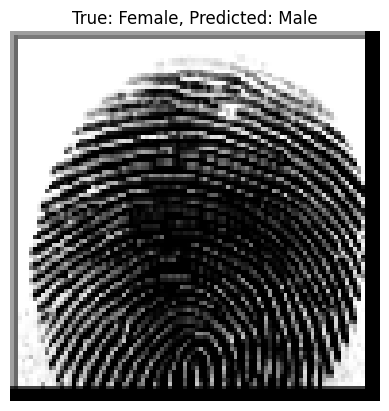

Sample 4529: True: Female, Predicted: Male


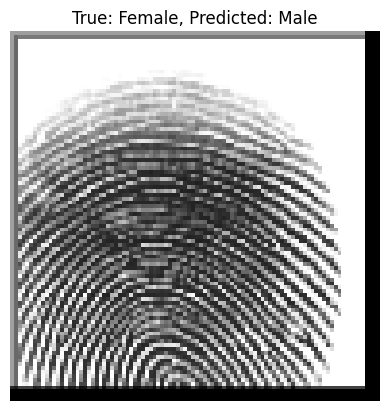

Sample 4531: True: Male, Predicted: Female


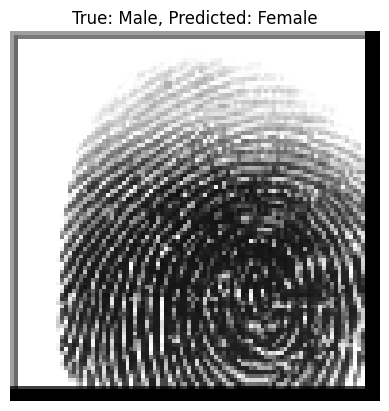

Sample 4536: True: Male, Predicted: Female


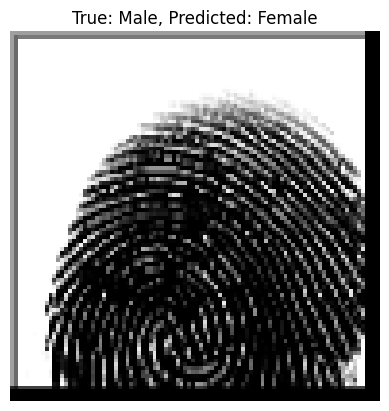

Sample 4568: True: Male, Predicted: Female


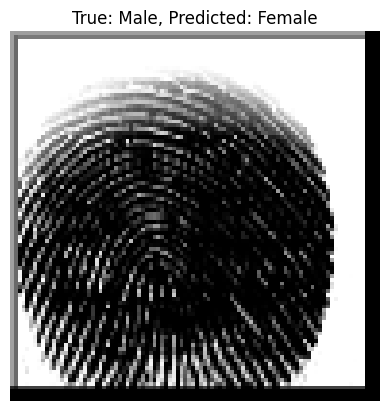

Sample 4591: True: Female, Predicted: Male


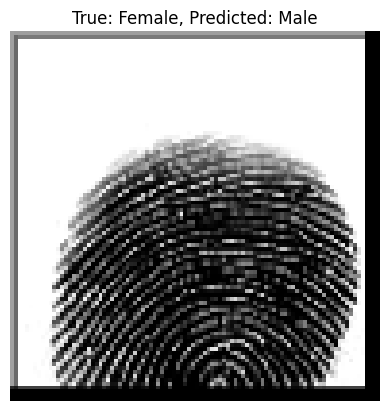

Sample 4597: True: Female, Predicted: Male


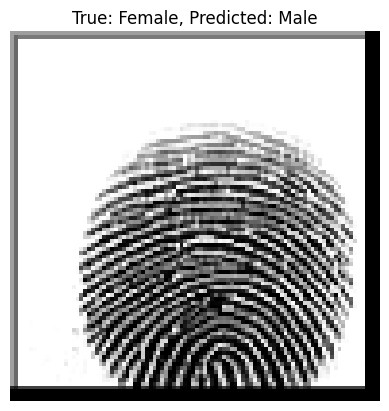

Sample 4599: True: Female, Predicted: Male


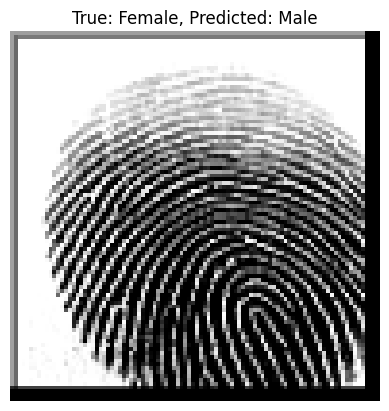

Sample 4601: True: Male, Predicted: Female


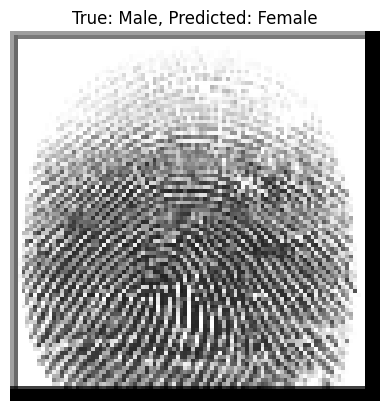

Sample 4678: True: Male, Predicted: Female


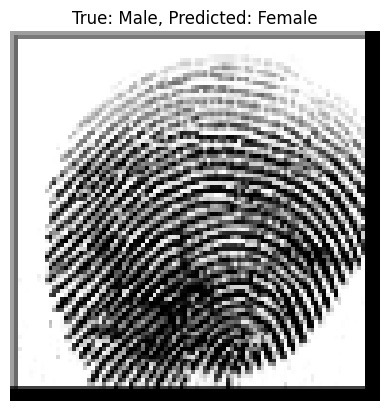

Sample 4695: True: Female, Predicted: Male


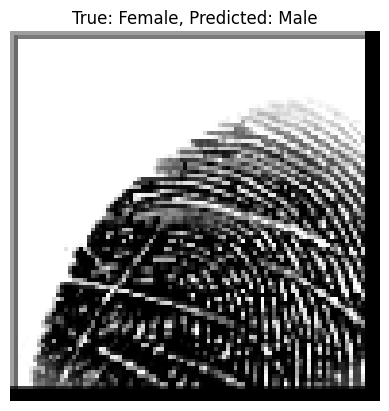

Sample 4697: True: Female, Predicted: Male


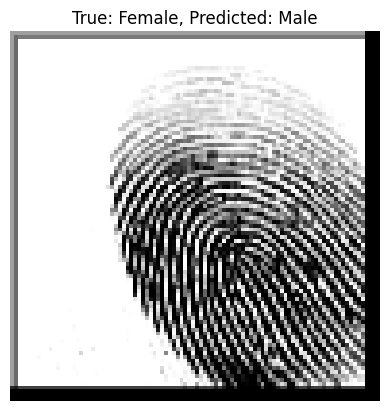

Sample 4698: True: Female, Predicted: Male


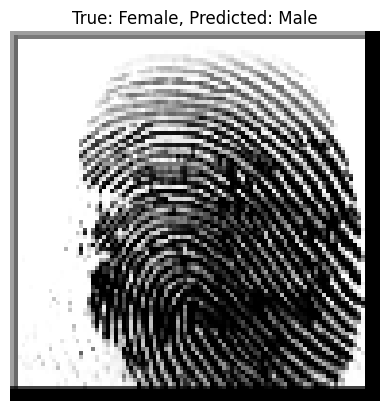

Sample 4722: True: Female, Predicted: Male


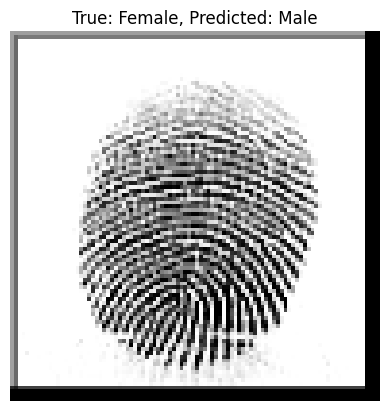

Sample 4728: True: Female, Predicted: Male


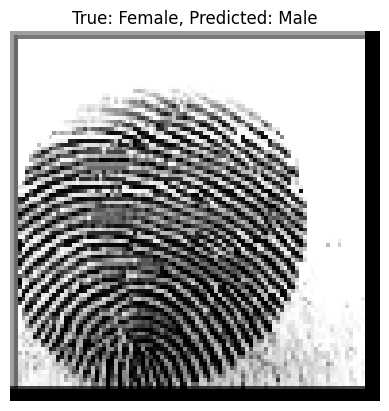

Sample 4743: True: Female, Predicted: Male


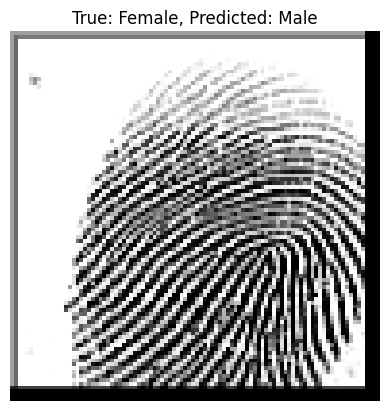

Sample 4746: True: Female, Predicted: Male


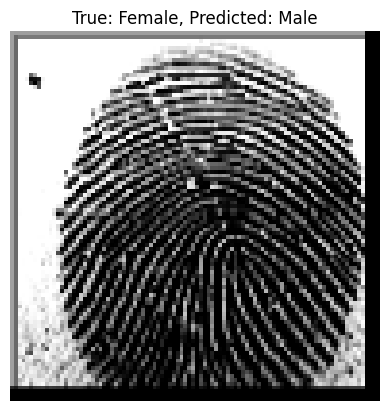

Sample 4747: True: Female, Predicted: Male


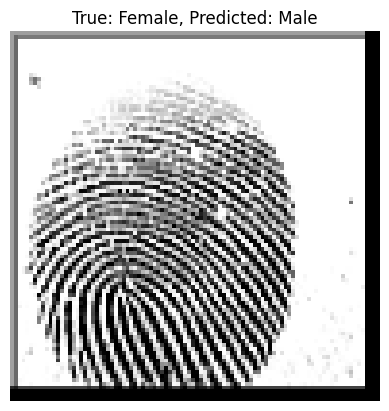

Sample 4770: True: Male, Predicted: Female


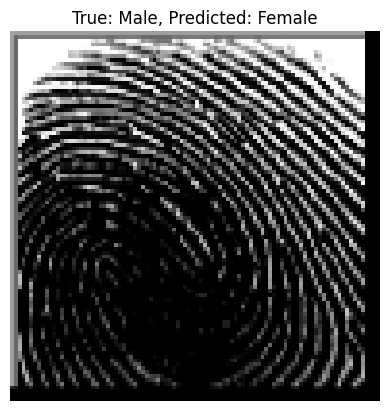

Sample 4831: True: Female, Predicted: Male


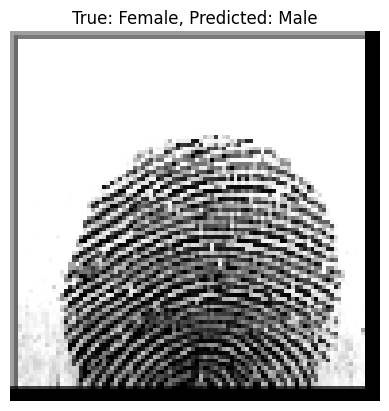

Sample 4833: True: Female, Predicted: Male


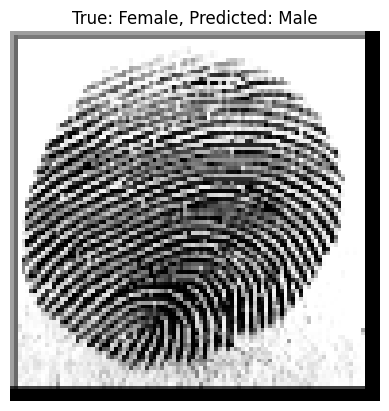

Sample 4838: True: Female, Predicted: Male


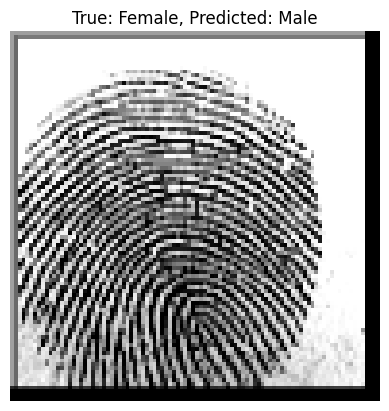

Sample 4842: True: Male, Predicted: Female


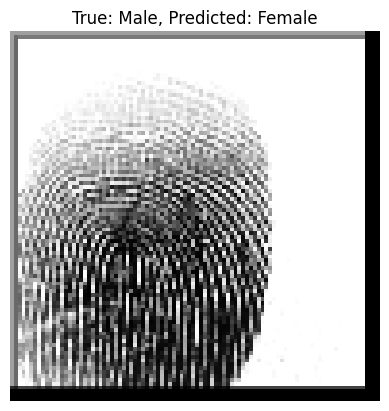

Sample 4861: True: Female, Predicted: Male


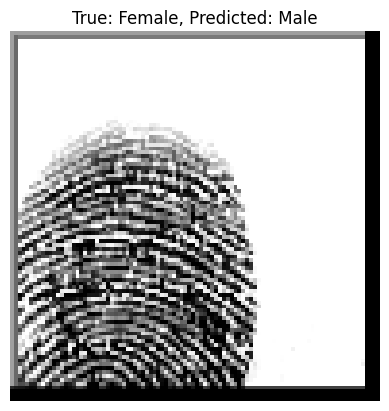

Sample 4864: True: Female, Predicted: Male


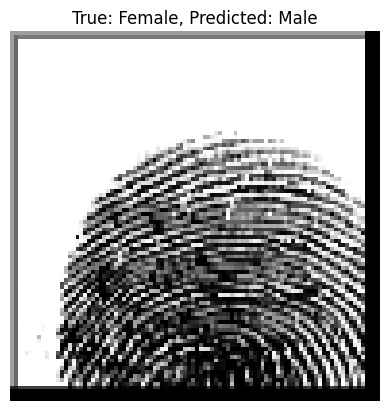

Sample 4866: True: Female, Predicted: Male


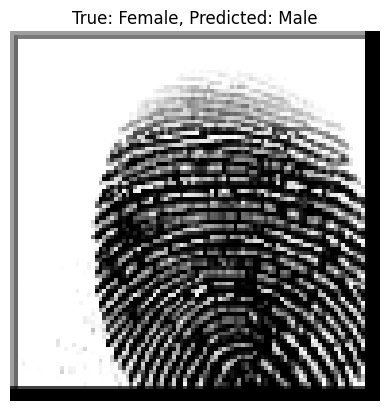

Sample 4868: True: Female, Predicted: Male


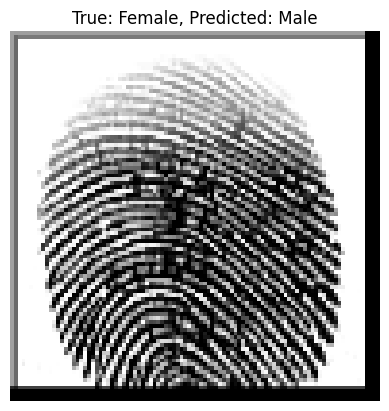

Sample 4869: True: Female, Predicted: Male


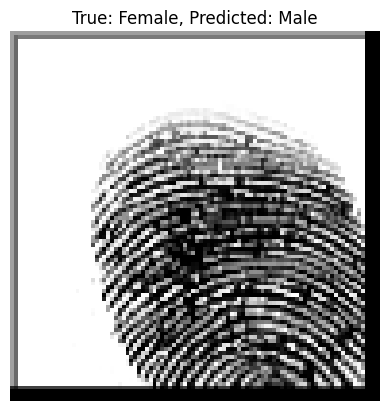

Sample 4870: True: Female, Predicted: Male


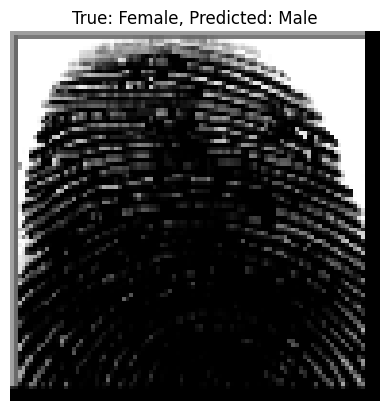

Sample 4881: True: Female, Predicted: Male


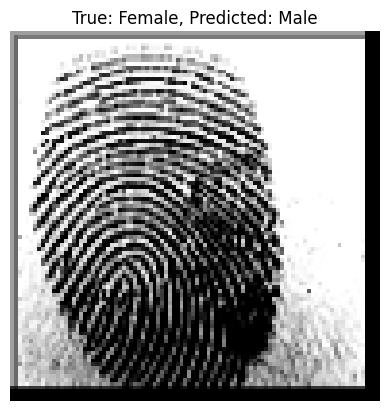

Sample 4885: True: Female, Predicted: Male


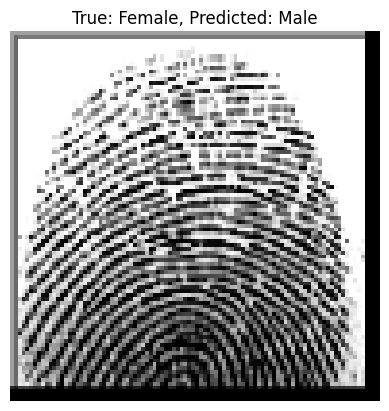

Sample 4886: True: Female, Predicted: Male


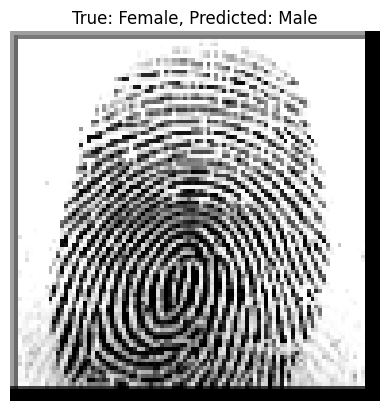

Sample 4888: True: Female, Predicted: Male


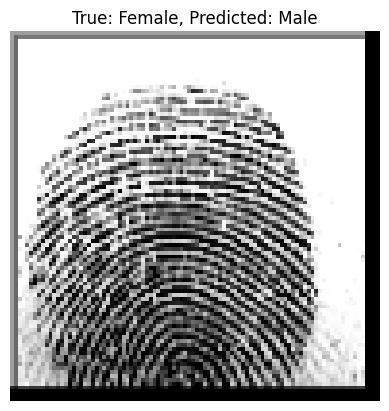

Sample 4898: True: Male, Predicted: Female


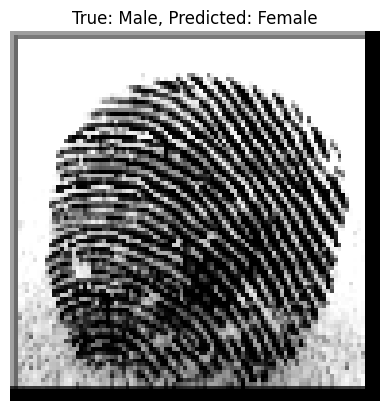

Sample 4935: True: Male, Predicted: Female


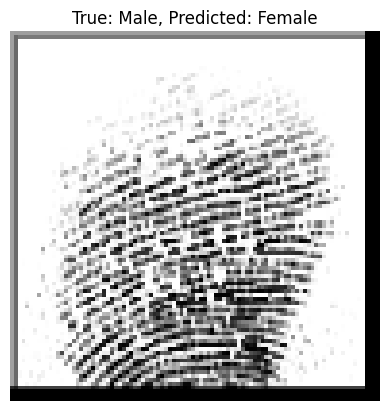

Sample 4967: True: Female, Predicted: Male


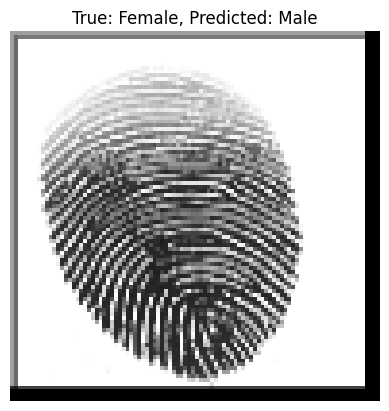

Sample 4970: True: Female, Predicted: Male


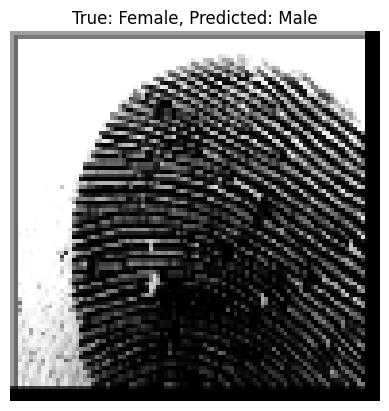

Sample 4990: True: Male, Predicted: Female


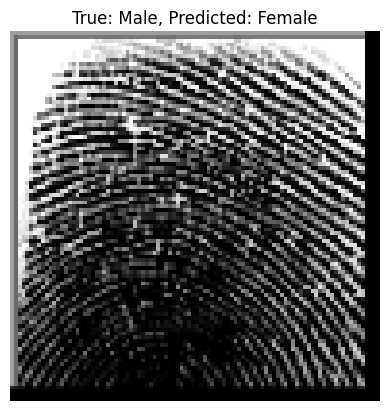

Sample 4993: True: Female, Predicted: Male


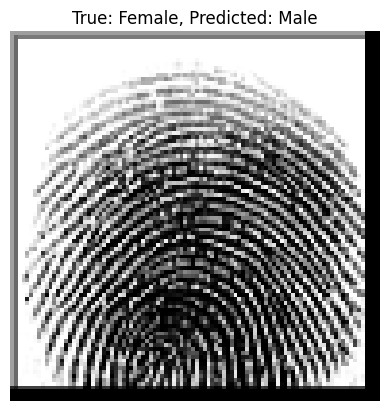

Sample 4997: True: Female, Predicted: Male


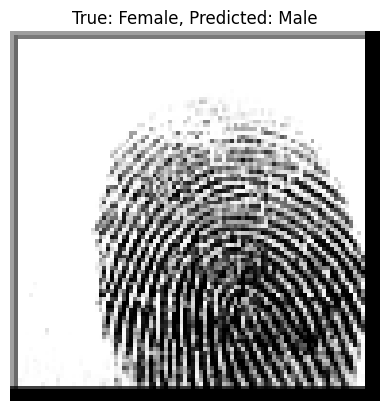

Sample 4999: True: Female, Predicted: Male


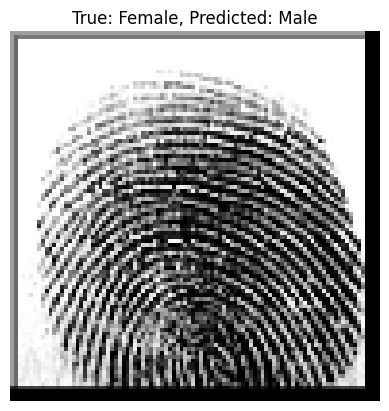

Sample 5001: True: Female, Predicted: Male


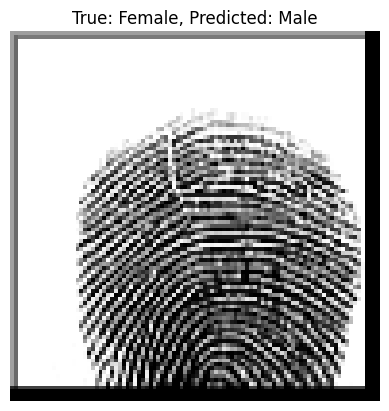

Sample 5009: True: Female, Predicted: Male


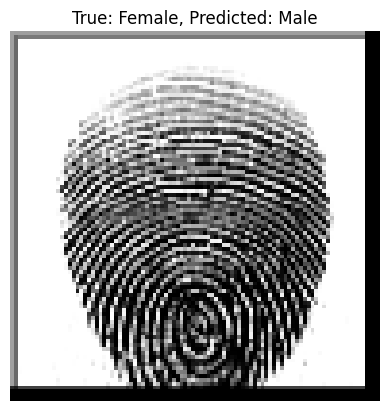

Sample 5057: True: Female, Predicted: Male


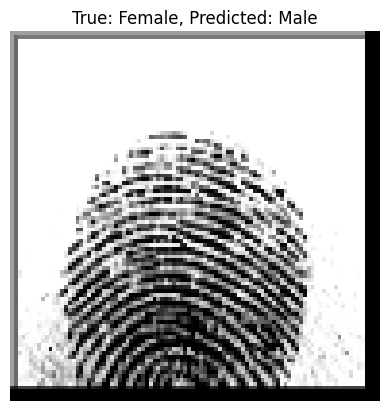

Sample 5058: True: Female, Predicted: Male


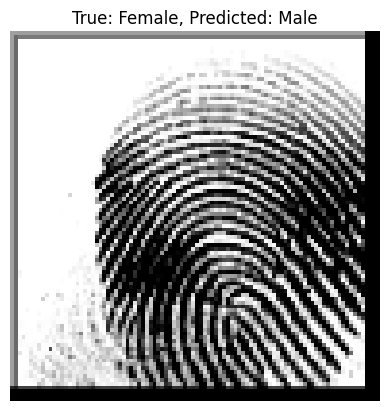

Sample 5059: True: Female, Predicted: Male


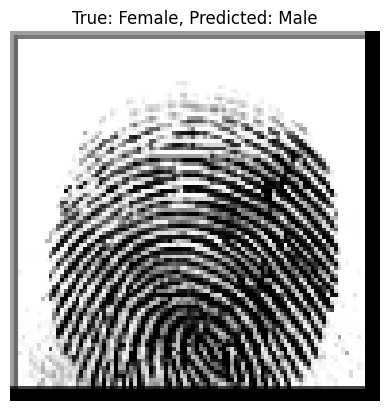

Sample 5100: True: Male, Predicted: Female


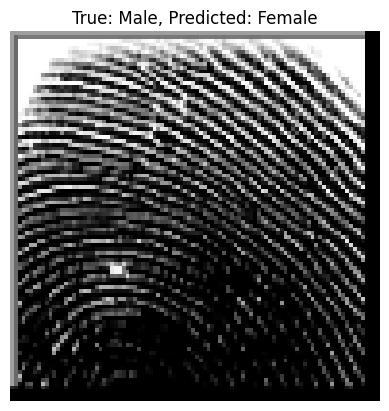

Sample 5102: True: Female, Predicted: Male


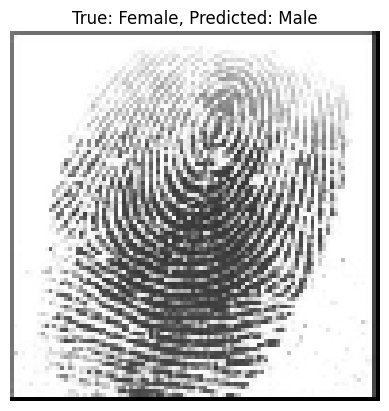

Sample 5105: True: Female, Predicted: Male


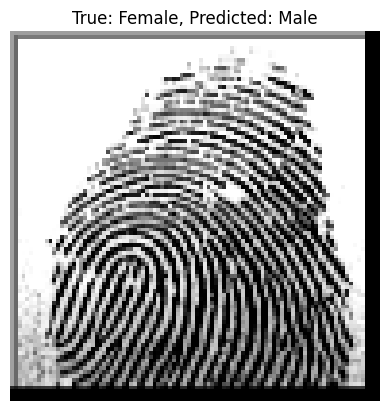

Sample 5107: True: Female, Predicted: Male


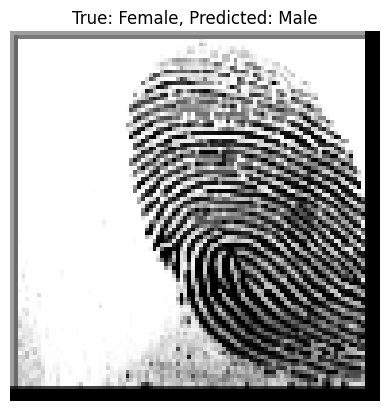

Sample 5108: True: Female, Predicted: Male


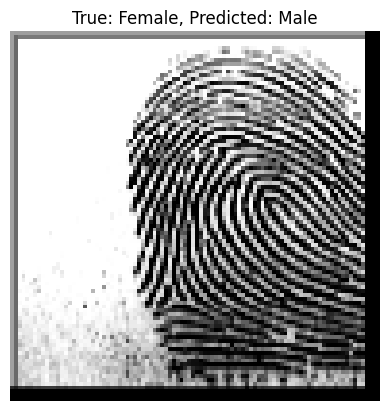

Sample 5110: True: Female, Predicted: Male


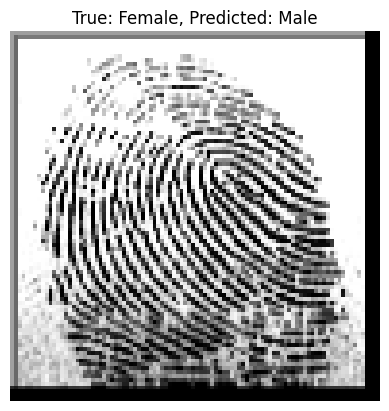

Sample 5121: True: Female, Predicted: Male


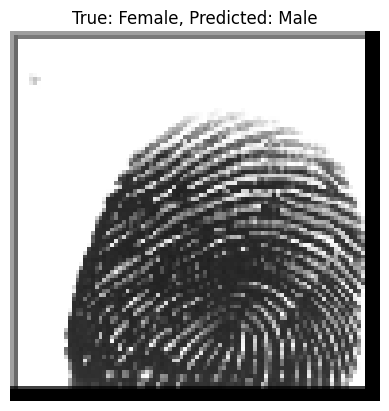

Sample 5123: True: Female, Predicted: Male


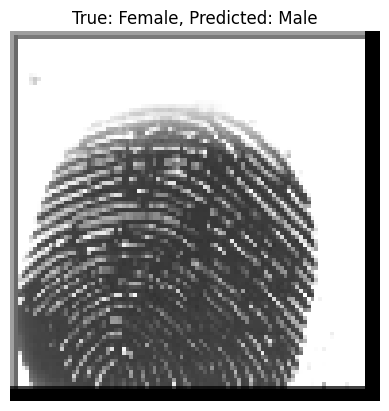

Sample 5127: True: Female, Predicted: Male


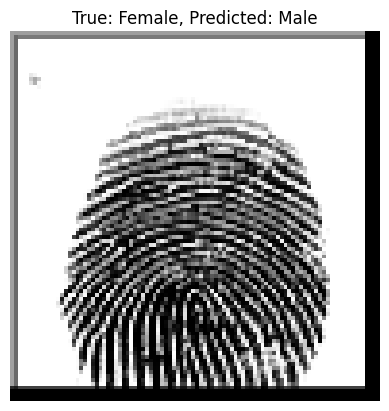

Sample 5129: True: Female, Predicted: Male


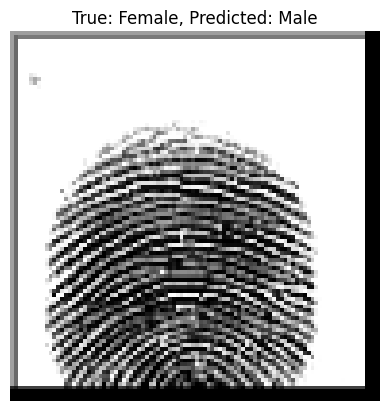

Sample 5143: True: Male, Predicted: Female


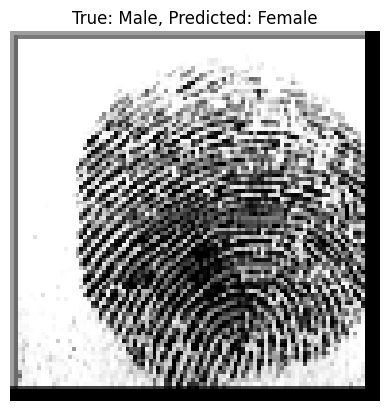

Sample 5144: True: Male, Predicted: Female


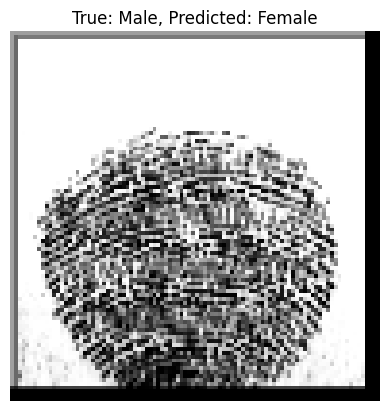

Sample 5170: True: Male, Predicted: Female


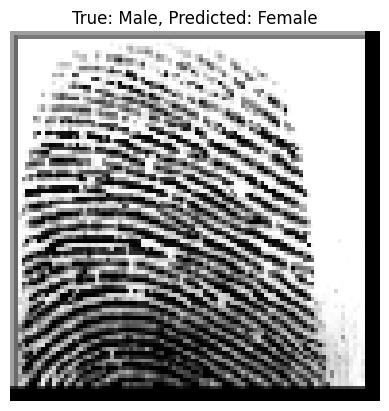

Sample 5184: True: Male, Predicted: Female


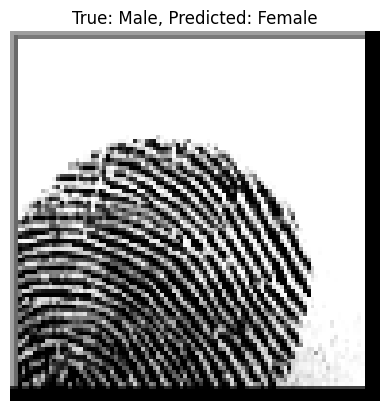

Sample 5204: True: Female, Predicted: Male


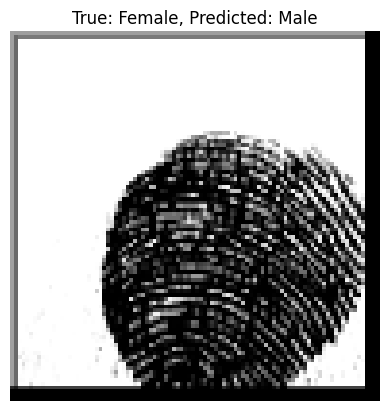

Sample 5205: True: Female, Predicted: Male


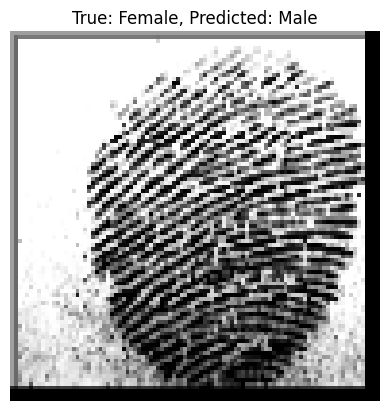

Sample 5206: True: Female, Predicted: Male


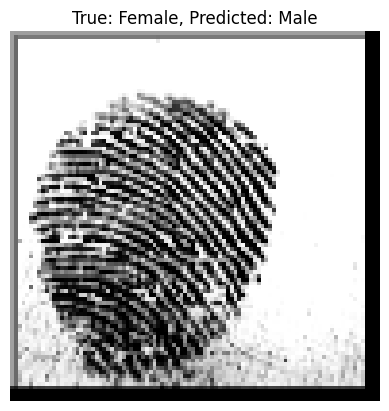

Sample 5207: True: Female, Predicted: Male


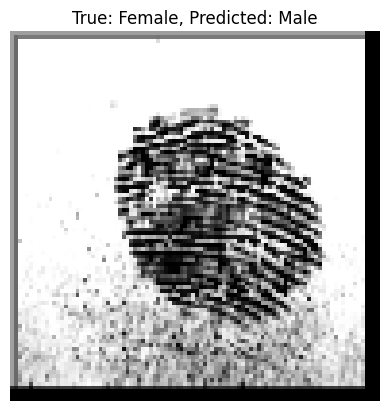

Sample 5208: True: Female, Predicted: Male


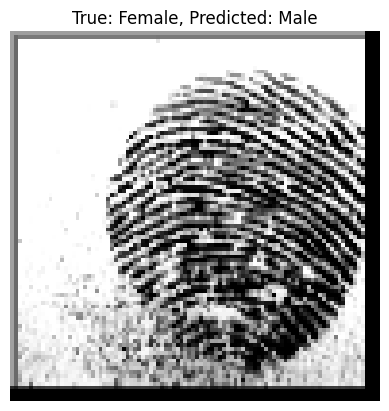

Sample 5209: True: Female, Predicted: Male


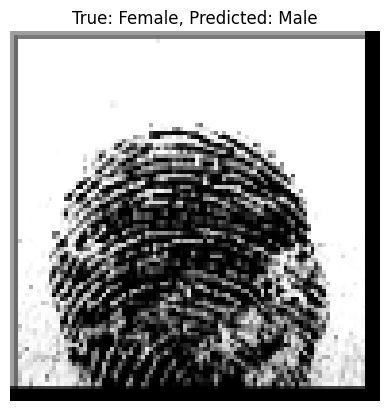

Sample 5210: True: Female, Predicted: Male


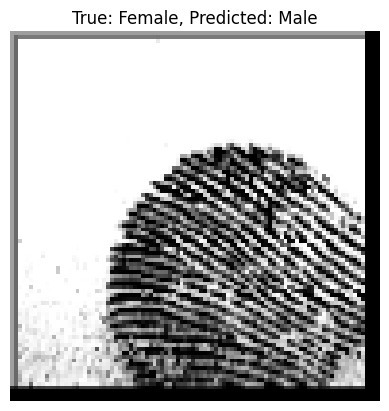

Sample 5221: True: Female, Predicted: Male


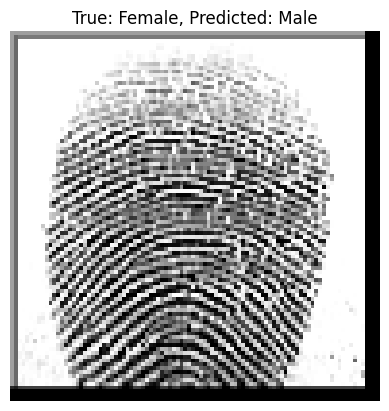

Sample 5228: True: Female, Predicted: Male


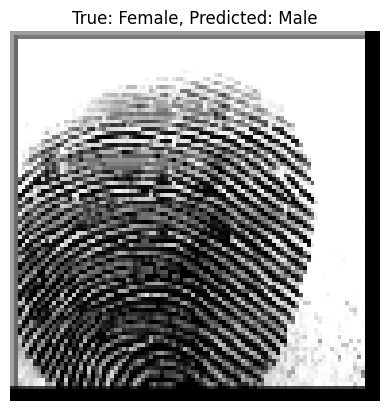

Sample 5229: True: Female, Predicted: Male


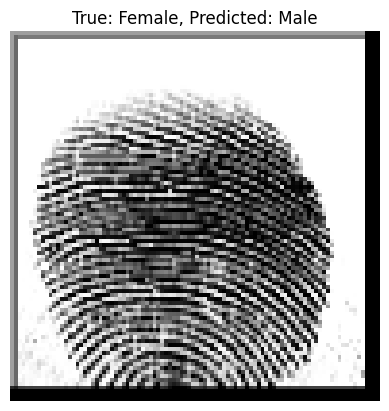

Sample 5230: True: Female, Predicted: Male


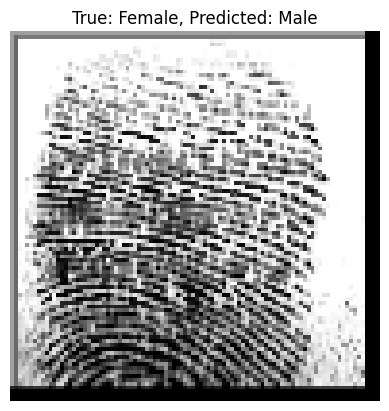

Sample 5235: True: Female, Predicted: Male


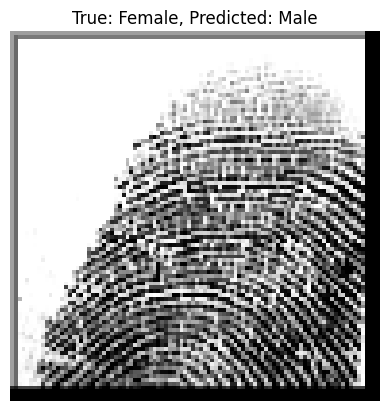

Sample 5241: True: Female, Predicted: Male


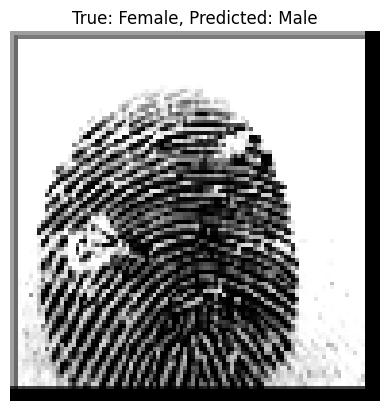

Sample 5243: True: Female, Predicted: Male


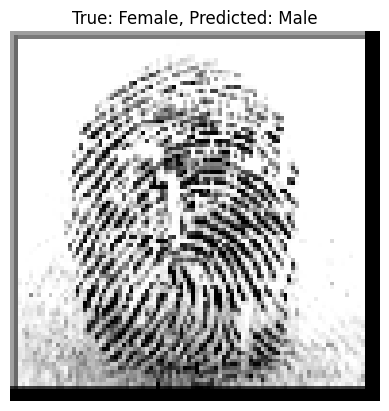

Sample 5244: True: Female, Predicted: Male


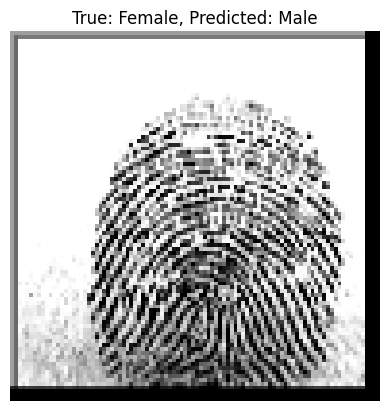

Sample 5253: True: Female, Predicted: Male


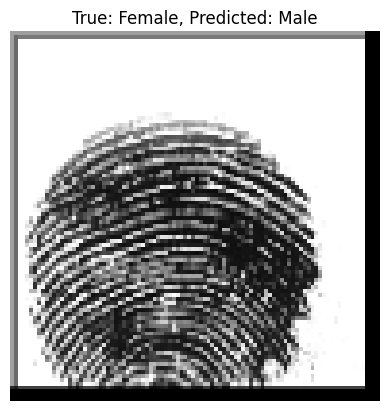

Sample 5256: True: Female, Predicted: Male


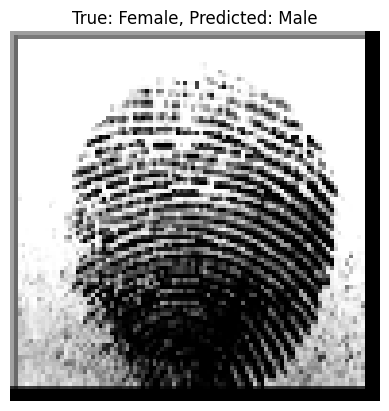

Sample 5331: True: Female, Predicted: Male


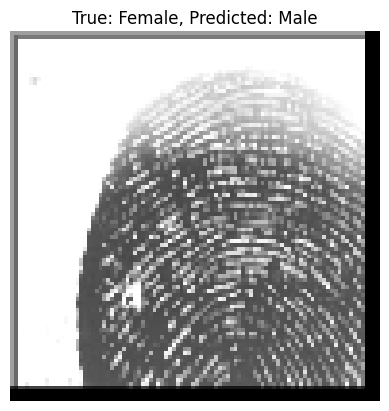

Sample 5333: True: Female, Predicted: Male


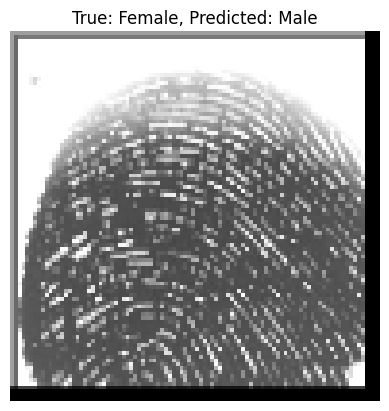

Sample 5334: True: Female, Predicted: Male


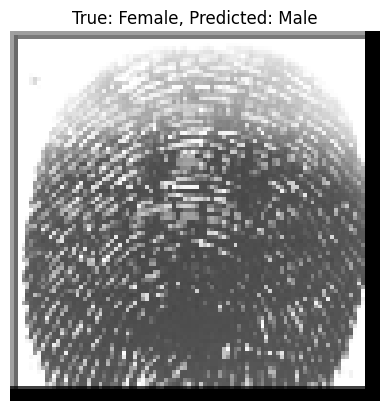

Sample 5335: True: Female, Predicted: Male


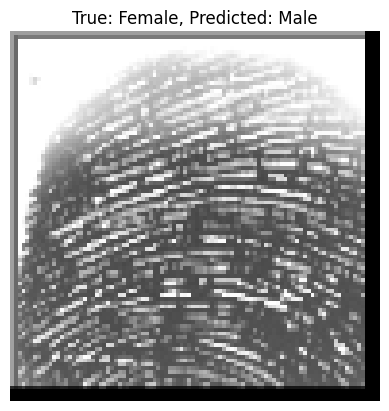

Sample 5339: True: Female, Predicted: Male


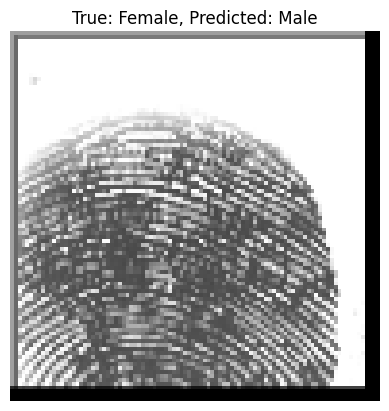

Sample 5357: True: Male, Predicted: Female


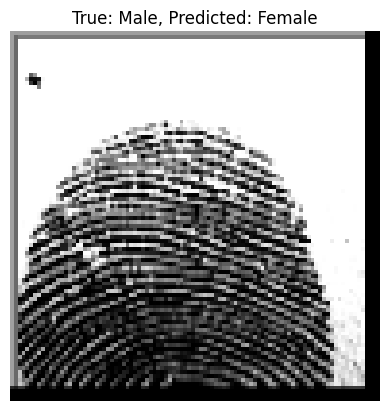

Sample 5370: True: Male, Predicted: Female


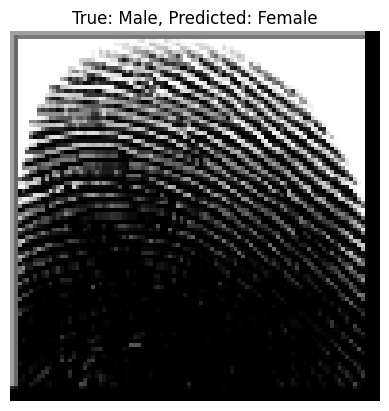

Sample 5498: True: Male, Predicted: Female


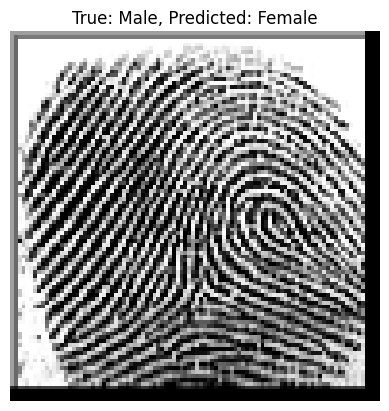

Sample 5533: True: Female, Predicted: Male


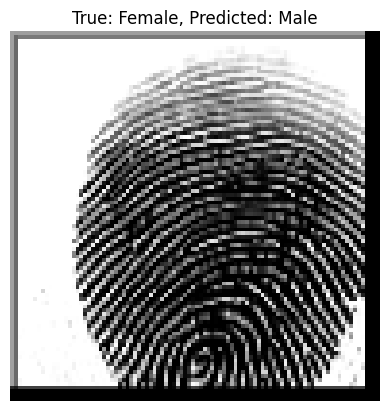

Sample 5536: True: Female, Predicted: Male


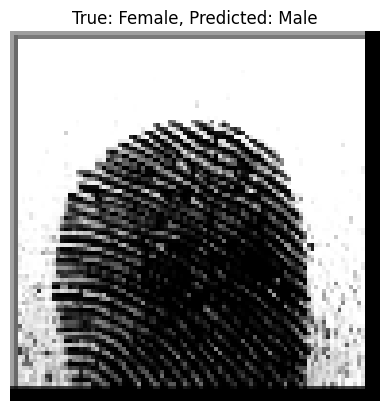

Sample 5537: True: Female, Predicted: Male


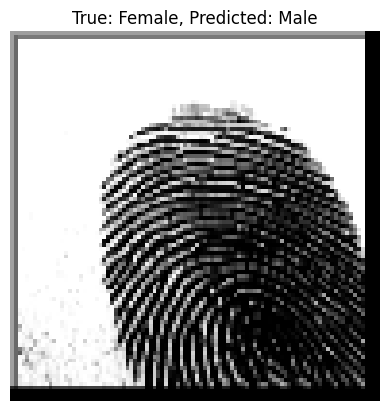

Sample 5538: True: Female, Predicted: Male


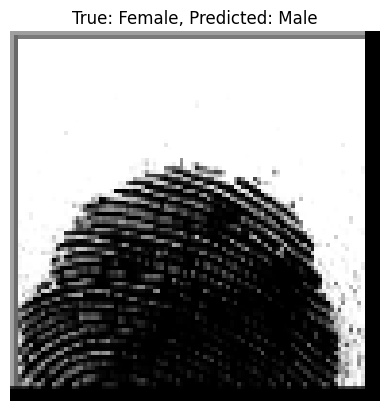

Sample 5563: True: Male, Predicted: Female


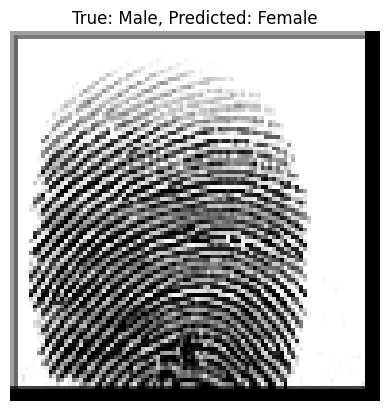

Sample 5568: True: Male, Predicted: Female


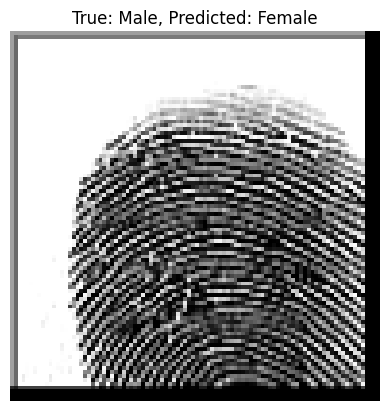

Sample 5576: True: Male, Predicted: Female


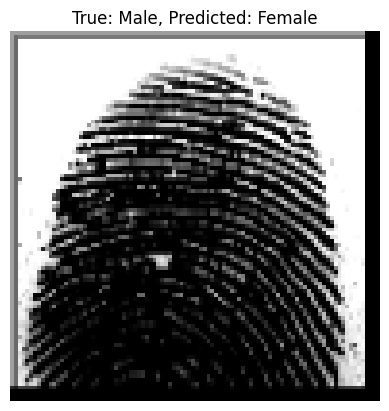

Sample 5584: True: Male, Predicted: Female


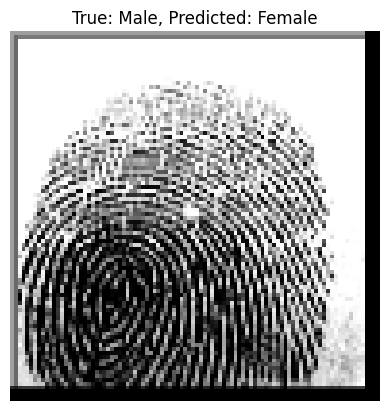

Sample 5600: True: Male, Predicted: Female


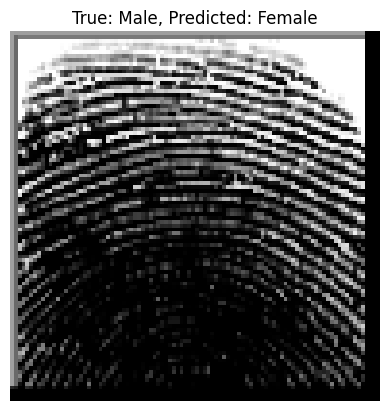

Sample 5612: True: Male, Predicted: Female


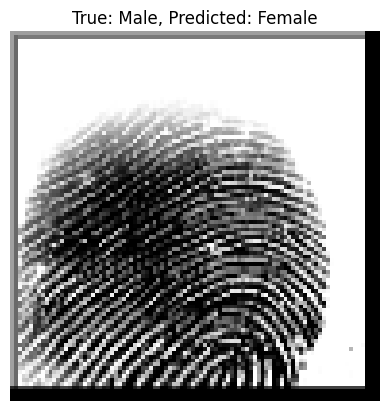

Sample 5638: True: Female, Predicted: Male


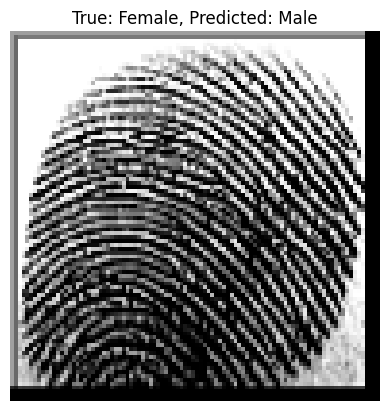

Sample 5639: True: Female, Predicted: Male


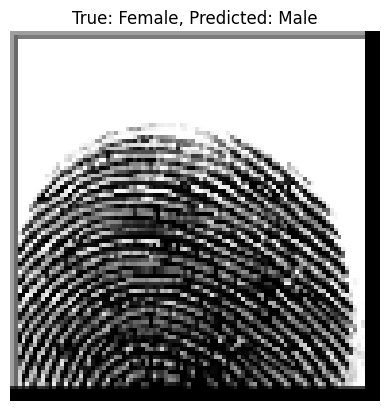

Sample 5644: True: Male, Predicted: Female


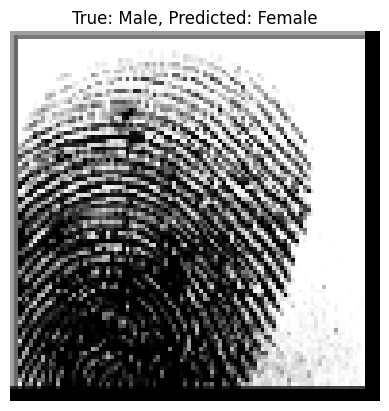

Sample 5646: True: Male, Predicted: Female


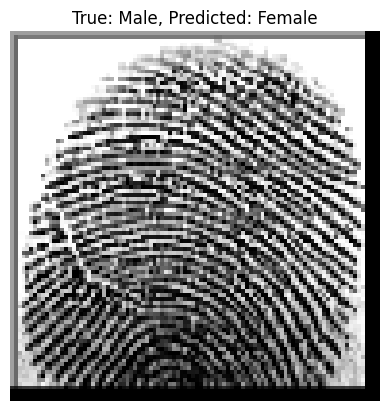

Sample 5710: True: Male, Predicted: Female


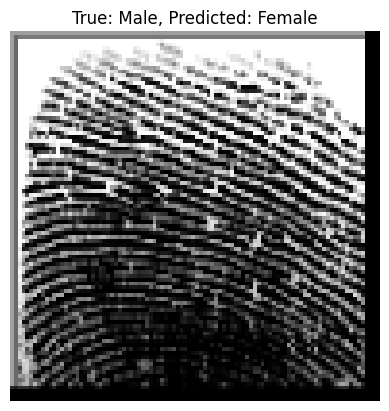

Sample 5715: True: Female, Predicted: Male


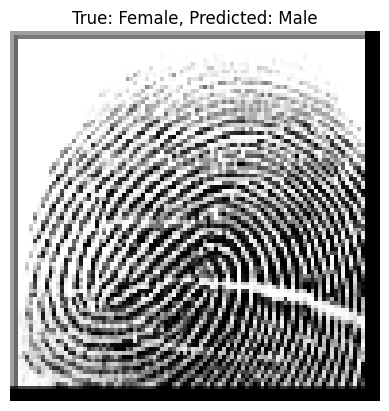

Sample 5716: True: Female, Predicted: Male


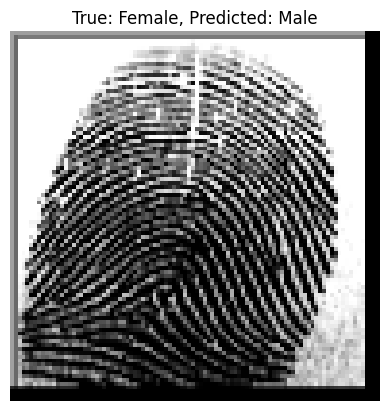

Sample 5723: True: Female, Predicted: Male


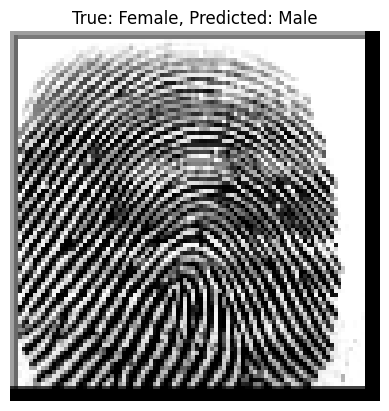

Sample 5726: True: Female, Predicted: Male


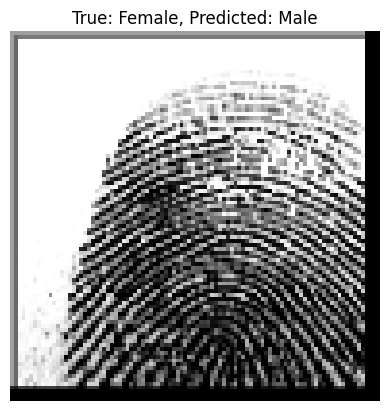

Sample 5727: True: Female, Predicted: Male


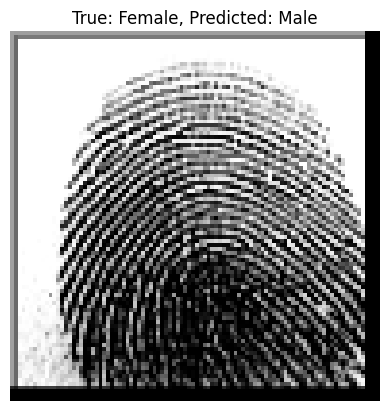

Sample 5728: True: Female, Predicted: Male


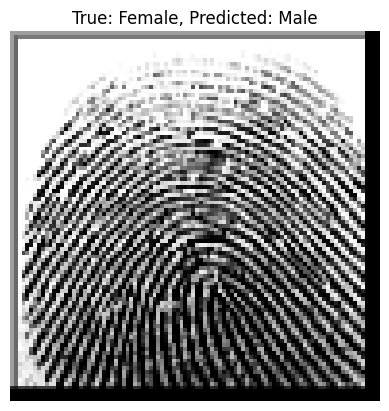

Sample 5734: True: Female, Predicted: Male


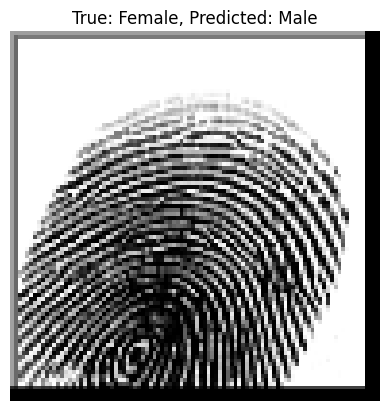

Sample 5739: True: Female, Predicted: Male


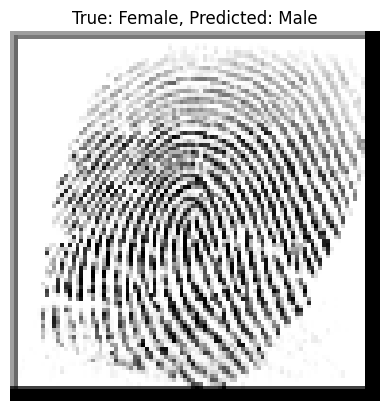

Sample 5752: True: Female, Predicted: Male


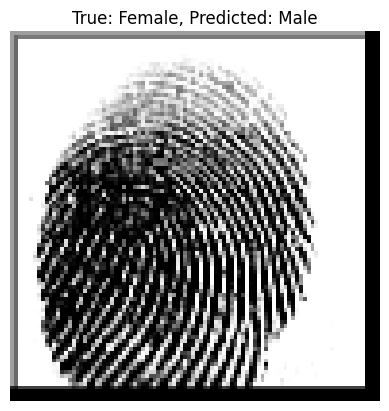

Sample 5753: True: Female, Predicted: Male


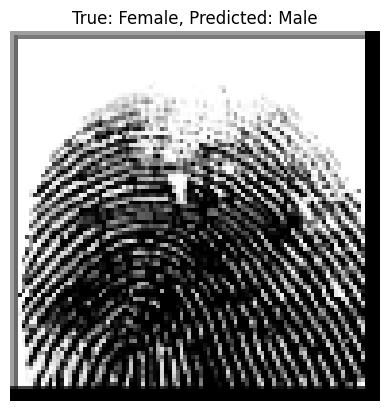

Sample 5756: True: Female, Predicted: Male


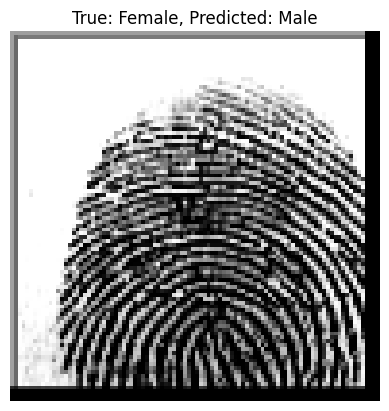

Sample 5759: True: Female, Predicted: Male


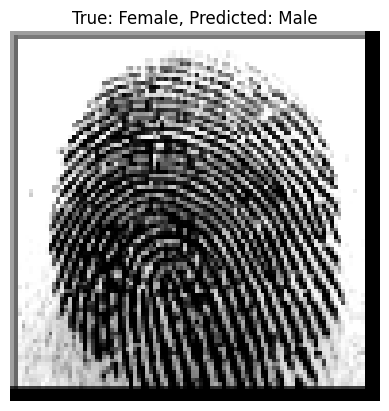

Sample 5793: True: Female, Predicted: Male


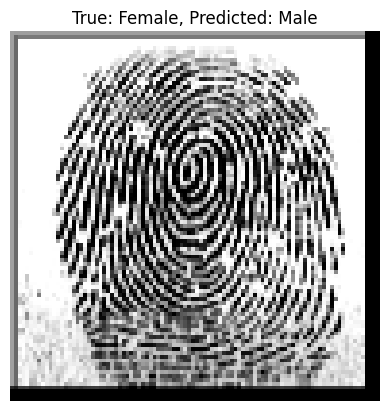

Sample 5796: True: Female, Predicted: Male


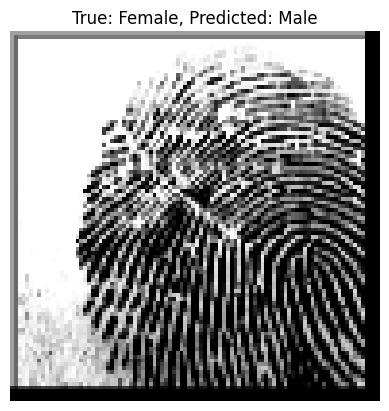

Sample 5798: True: Female, Predicted: Male


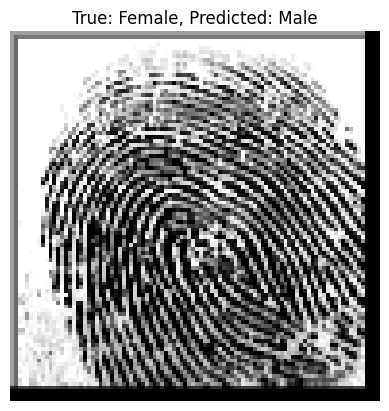

Sample 5800: True: Female, Predicted: Male


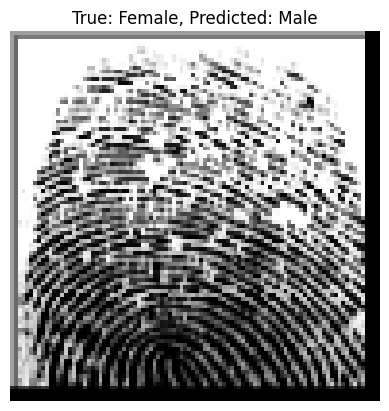

Sample 5816: True: Male, Predicted: Female


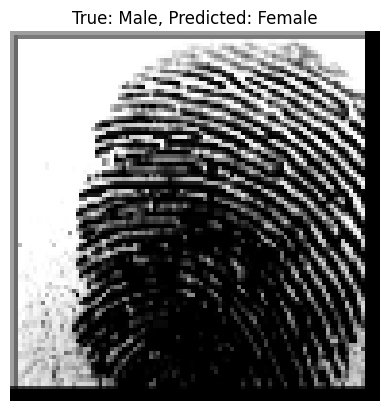

Sample 5866: True: Female, Predicted: Male


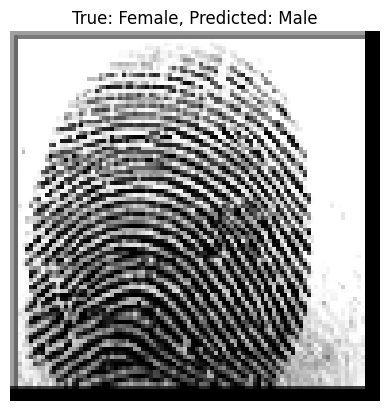

Sample 5867: True: Female, Predicted: Male


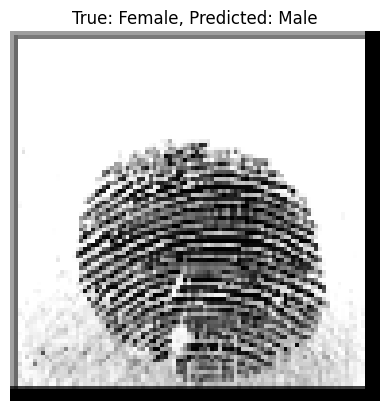

Sample 5868: True: Female, Predicted: Male


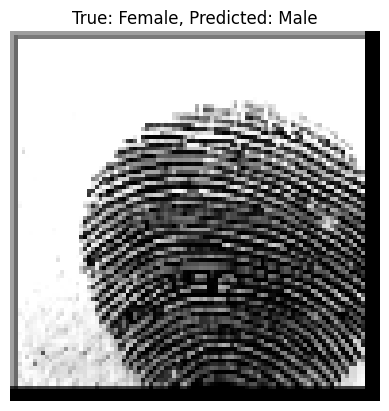

Sample 5869: True: Female, Predicted: Male


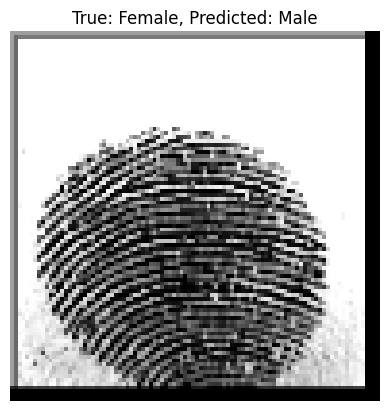

Sample 5886: True: Male, Predicted: Female


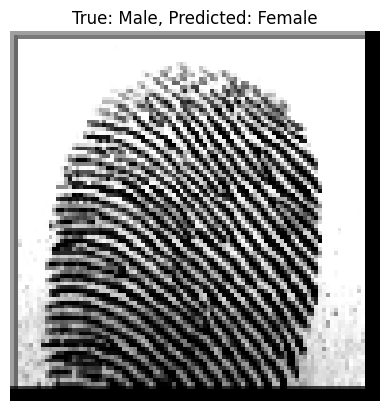

Sample 5892: True: Male, Predicted: Female


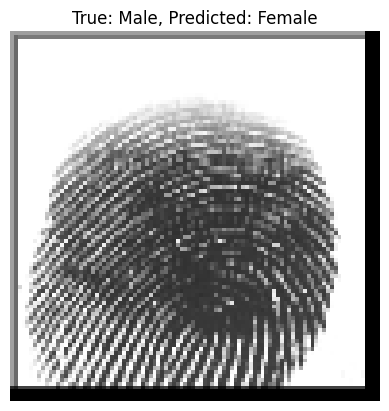

Sample 5902: True: Female, Predicted: Male


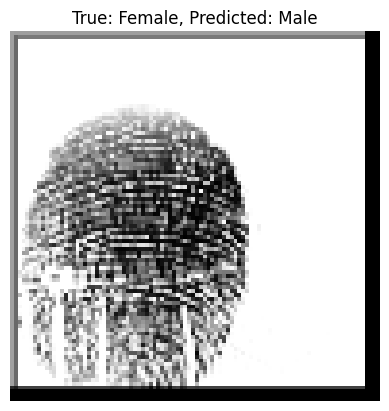

Sample 5903: True: Female, Predicted: Male


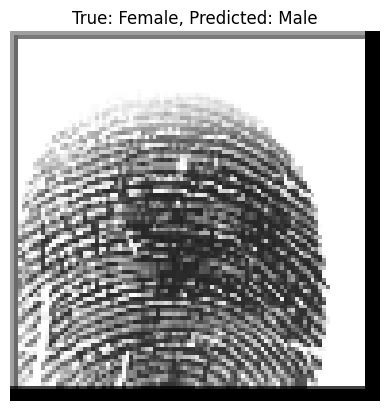

Sample 5908: True: Female, Predicted: Male


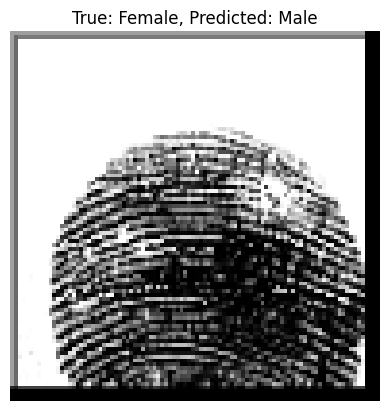

Sample 5914: True: Female, Predicted: Male


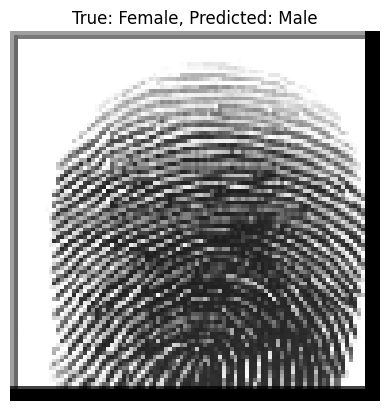

Sample 5915: True: Female, Predicted: Male


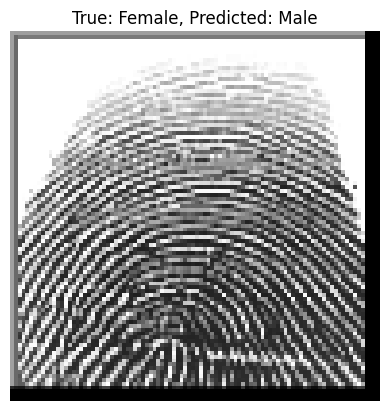

Sample 5961: True: Male, Predicted: Female


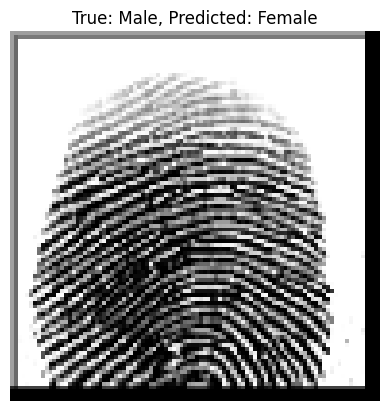

Sample 5962: True: Male, Predicted: Female


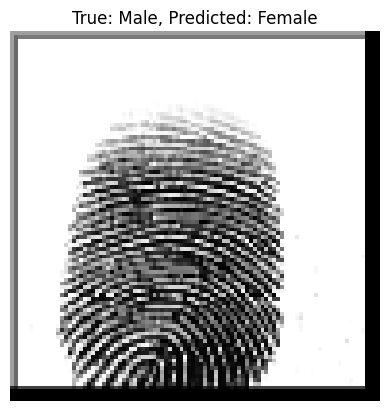

Sample 5969: True: Male, Predicted: Female


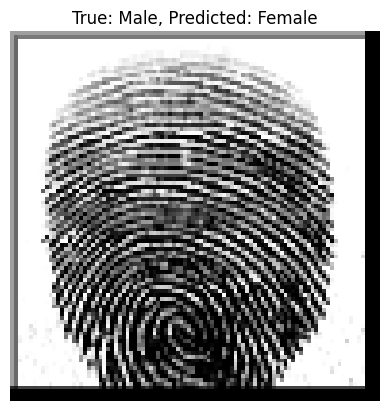

Male samples in test set: 4770
Female samples in test set: 1230


In [4]:
# Load data from the "Altered-Medium" path using the loading_data function
Medium_data = loading_data(Medium_path, True)

# Separate labels and image features from the loaded "Altered-Medium" data
img, labels = [], []
for label, feature in Medium_data:
    labels.append(label)
    img.append(feature)

# Convert the image data to a numpy array and reshape it
train_data = np.array(img).reshape(-1, img_size, img_size, 1)

# Normalize the pixel values to be between 0 and 1
train_data = train_data / 255.0

# Convert the labels to categorical format (one-hot encoding) with 2 classes
train_labels = to_categorical(labels, num_classes=2)

# Convert labels to a numpy array
labels = np.array(labels)

# Display an image from the training data (for example, the 5000th image)
plt.imshow(train_data[5000])


# Initialize the RandomOverSampler
oversampler = RandomOverSampler(sampling_strategy='auto', random_state=42)

# Resample the training data and labels using the oversampler
train_data_resampled, labels_resampled = oversampler.fit_resample(train_data.reshape(-1, 96*96*1), labels)

# Reshape the resampled data back to its original shape
train_data_resampled = train_data_resampled.reshape(-1, 96, 96, 1)

# Create an instance of EarlyStopping callback
early_stopping_cb = EarlyStopping(monitor='val_loss', patience=10)

# Fit the model2 to the resampled data with callbacks and validation split
history = model2.fit(
    train_data_resampled,
    labels_resampled,
    batch_size=128,
    epochs=24,
    validation_split=0.2,
    callbacks=[early_stopping_cb],
    verbose=1
)

# Plot training and validation loss
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(8, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Evaluate the trained model2 on the test set
loss, accuracy = model2.evaluate(x_test, y_test)
print(f"Test Loss: {loss:.4f}, Test Accuracy: {accuracy:.4f}")

# Predict labels on the test set
preds = model2.predict(x_test)
preds = (preds >= 0.5).astype(np.int32)

# Compute confusion matrix
cm = confusion_matrix(y_test, preds)
df_cm = pd.DataFrame(cm, index=['Male', 'Female'], columns=['Male', 'Female'])

# Visualize confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Confusion Matrix for Gender Classification Model")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.show()

# Compute and print classification report
class_report = classification_report(y_test, preds, target_names=['Male', 'Female'])
print("Classification Report:")
print(class_report)

# Visualize misclassified samples
for i in range(len(y_test)):
    true_label = 'Male' if y_test[i] == 0 else 'Female'
    pred_label = 'Male' if preds[i] == 0 else 'Female'
    if true_label != pred_label:
        print(f"Sample {i+1}: True: {true_label}, Predicted: {pred_label}")
        plt.imshow(x_test[i].squeeze(), cmap='gray')
        plt.title(f"True: {true_label}, Predicted: {pred_label}")
        plt.axis('off')
        plt.show()

# Analyze class distribution in the test set (optional)
male_samples = np.sum(y_test == 0)
female_samples = np.sum(y_test == 1)
print(f"Male samples in test set: {male_samples}")
print(f"Female samples in test set: {female_samples}")

# Save the trained model2
model2.save("Gender2.keras")
